# 👥 Made by

| Name                          | Student ID     |
|-------------------------------|----------------|
| Edwardo Bassil                | 1010830969     |
| Tiffany Costas                | 1005854844     |
| Daniel Robets                 | 1005809760     |
| Amreen Imrit                  | 1005902971     |
| Fatima Shabeer                | 1008713215     |
| MohammadAmir Ahmadian Shahreza| 1011679337     |


# 📘 Table of Contents

- [1.0 Problem Definition and Early Exploration](#problem-definition)
  - [1.1 Exploring Innovation Reports](#problem-definition-exploring)
  - [1.2 Clustering Global Innovation Index](#problem-definition-clustering)

- [2.0 Policy 1: Commercialization Gap](#policy-1)
  - [2.1 Data loading and cleaning](#policy-1-cleaning)
  - [2.2 Results Analysis](#policy-1-analysis)

- [3.0 Policy 2: Tax Breaks and Deregulations](#policy-2)
  - [3.1 Data loading and cleaning](#policy-2-cleaning)
  - [3.2 Datasets merging](#policy-2-merging)
  - [3.3 Analysis of correlations between tax rates, GDP growth, and VC investments](#policy-2-analysis)

- [4.0 Policy 3: Brain Drain](#policy-3)
  - [4.1 Cleaning Migration Data](#policy-3-cleaning)
  - [4.2 Quick Migration Data Analysis](#policy-3-analysis)
  - [4.3 Correlation Matrix of Emigrants, tax rates, wage, housing and unemployment](#policy3-cm)
  - [4.4 Simple Regression for Factors Affecting Emigration](#policy3-sre)

- [5.0 Policy 4: Energy & Innovation](#policy-4)
  - [5.1 Data Collection](#policy-4-cleaning)
  - [5.2 Exploratory Data Analysis (G7 + CHN, ISR, KOR)](#policy-4-EDA)
  - [5.3 Canada Deep Dive & US Comparison](#policy-4-can-usa)
  - [5.4 Canada Statistical Analysis](#policy-4-stats-can)
  - [5.5 Advanced Policy Simulation (Canada)](#policy-4-simulation)

- [6.0 ChatBot](#chatbot)

- [7.0 Conclusion](#conclusion)




<a name="problem-definition"></a>

# **1.0 Problem Definition and Early Exploration**




Canada is struggling to keep up with the world's most innovative countries as it ranks 14th on the World Intellectual Property Organization's Global Innovation Index. Canada's main issues stopping it from being a global innovation hub are :


*   Low R&D spending as a % of GDP
*   Weak public-private collaborations
*   Poor commercilization (conversion of R&D into market-ready products)
*   High corporate taxes
*   Long bureaucratic delays for high-growth tech
*   Significant brain-drain, especially to the USA
*   Under-leveraged energy sector potential

To tackle those issues, we defined a set of four policies, each targetting a specific issue :
*   Policy 1 : Bridging the commercialization gap via late-stage innovation support late-stage innovation.
*   Policy 2 : Incentivizing startup activity through targeted tax breaks and deregulation
*   Policy 3 : Understanding and mitigating Canada’s brain-drain
*   Policy 4 : Leveraging energy sector reform to attract innovation-heavy industries

In this notebook, we apply correlation analysis, hypothesis testing, and visual analytics to explore the policy levers most correlated with innovation success metrics (GDP growth, venture capital investment, and startup performance). The goal is to formulate data-driven policy recommendations that are both actionable and statistically supported.  
Together, those 4 policies aim to make Canada a more startup friendly environment and foster a mindset of constant innovation, attracting investors, founders and global businesses. Those aspects will help reverse the current brain drain and boost economic and high-tech growth, which will establish Canada as a top-tier innovation hub.

Link to all our dataset: https://drive.google.com/drive/folders/1Qhvcm31XTzW6c3Ru1QVyO-Miu_pmuriB?usp=sharing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

main_path = "/content/drive/My Drive/MIE1624 Group Project/Group Project/all_data"
policy1_path = os.path.join(main_path, "policy1_dataset")
policy2_path = os.path.join(main_path, "policy2_dataset")
policy3_path = os.path.join(main_path, "policy3_dataset")
policy4_path = os.path.join(main_path, "policy4_dataset")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<a name="problem-definition-exploring"></a>
## **1.1 Exploring Different Innovation Report & Comparing Canada**

We start the analysis by summarizing different reports regarding innovation in different countries. These reports of helpful to understand what other countries are doing to improve their innovation and where Canada currently stands. This sections reads all the summaries we collected by passing each report into chatgpt and then uses the Open AI API to summarize where Canada is falling behind and how Canada can improve.



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import os

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
#himport open AI
try:
    import openai
except:
    !pip install openai
    import openai

## API Key
API_KEY= "secret" #this key needs to be changed to your personal ones

os.environ['OPENAI_API_KEY'] = API_KEY
openai.api_key = os.getenv("OPENAI_API_KEY")

# model = "gpt-4-0125-preview" # 128K tokens
model="gpt-4o-mini" # 128K token

from openai import OpenAI

client = OpenAI()

In [ ]:
def getAIAnswer (prompt, model):
  '''
  get the AI answer using the OpenAI API

  Args:
  prompt (str): the prompt to be used in the API call
  model (str): the model to be used in the API call

  Returns:
  response (str): the response from the API call
  '''
  response = client.chat.completions.create(
    model = model,
    messages = [
      {"role": "system", "content": "You are a helpful assistant."},
      {"role": "user", "content": prompt[:min(len(prompt), 100000)]}
    ]
  )
  return response.choices[0].message.content

def read_text_file(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        return file.read()

In [ ]:
file_path = os.path.join(main_path, "report_summaries/Copy of ed_summary.txt")
rep_summary = read_text_file(file_path)

propmt = f"Based on the provided summary, summarize where Canada is falling behind in innovation compared to other countries and then suggest actionable strategies for Canada to improve its innovation: This is the report: {rep_summary}"
print(getAIAnswer(propmt, model))


**Summary of Innovation Gaps in Canada Compared to Other Countries:**

Canada is falling behind in innovation on several fronts compared to other advanced economies, as outlined in various reports:

1. **R&D Investment**: Canada invests roughly 1.8% of its GDP in R&D, significantly lower than countries like Switzerland (3.2%) and Japan (approximately 2.5%). This limited investment hampers advancements and competitiveness in emerging technologies.
  
2. **Technology Adoption**: There is insufficient uptake of advanced technologies in Canadian businesses, contributing to weak productivity and innovation performance.

3. **Commercialization of Research**: Canada struggles with effectively translating research into commercial products, with many patents being held abroad rather than leveraged domestically.

4. **Support for Startups and SMEs**: The venture capital landscape is underdeveloped, limiting resources for high-growth firms and impeding the scaling of innovative companies.

5. **W

<a name="problem-definition-clustering"></a>
## **1.2 Clustering Global Innovation Index**

The goal of this section is to analyze where canada lies when compare to other countries, and understand what factors contributes the most to innovation. We start by building a hierarchical clustering to see where Canada lies. We then use a random forest to obtain feature importance of the global index factors

In [ ]:
#File Path
GLOBAL_INDEX_DIR = os.path.join(main_path, "policy2_dataset/extracted from global innnovation index/")

In [ ]:
global_data = "Global_Innovation_Index_2024_Final_Structured_Dataset.csv"
global_data = os.path.join(GLOBAL_INDEX_DIR, global_data)
global_data = pd.read_csv(global_data)
print(global_data.columns.tolist())

['Economy', 'GII Rank', 'Score', '1. Institutions', '1.1 Institutional environment', '1.1.1 Operational stability for businesses', '1.1.2 Government effectiveness', '1.2 Regulatory environment', '1.2.1 Regulatory quality', '1.2.2 Rule of law', '1.3 Business environment', '1.3.1 Policy stability for doing business', '1.3.2 Entrepreneurship policies and culture', '2. Human capital and research', '2.1 Education', '2.1.1 Expenditure on education, % GDP', '2.1.2 Government funding/pupil, secondary, % GDP/cap', '2.1.3 School life expectancy, years', '2.1.4 PISA scales in reading, maths, and science', '2.1.5 Pupil–teacher ratio, secondary', '2.2 Tertiary education', '2.2.1 Tertiary enrollment, gross', '2.2.2 Graduates in science and engineering, %', '2.2.3 Tertiary inbound mobility, %', '2.3 Research and development (R&D)', '2.3.1 Researchers, FTE/mn pop.', '2.3.2 Gross expenditure on R&D, % GDP', '2.3.3 Global corporate R&D investors, top 3, mn USD$', '2.3.4 QS university ranking, top 3', '3

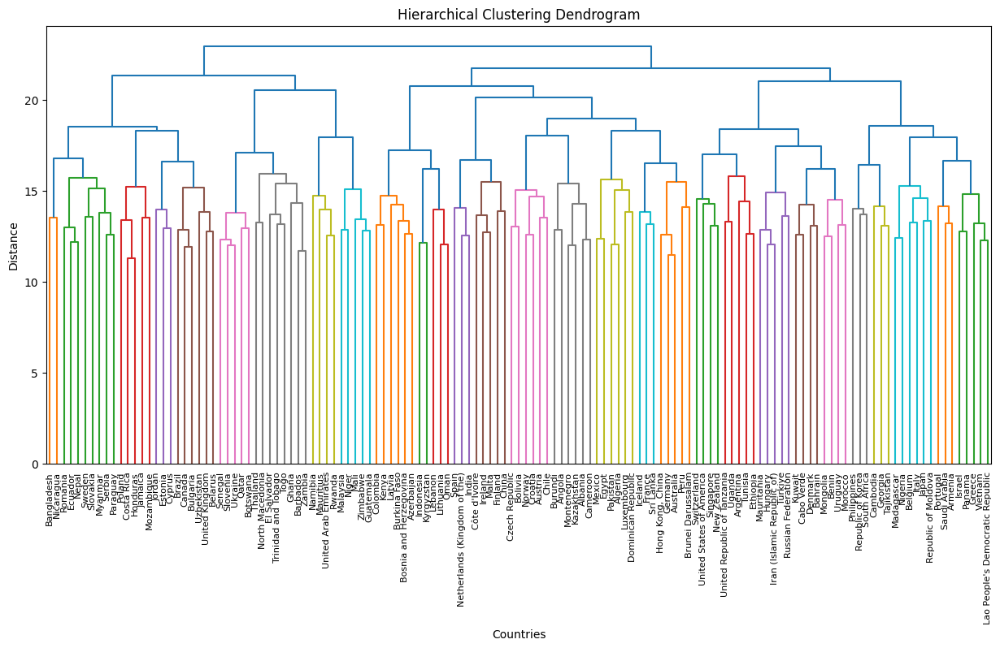

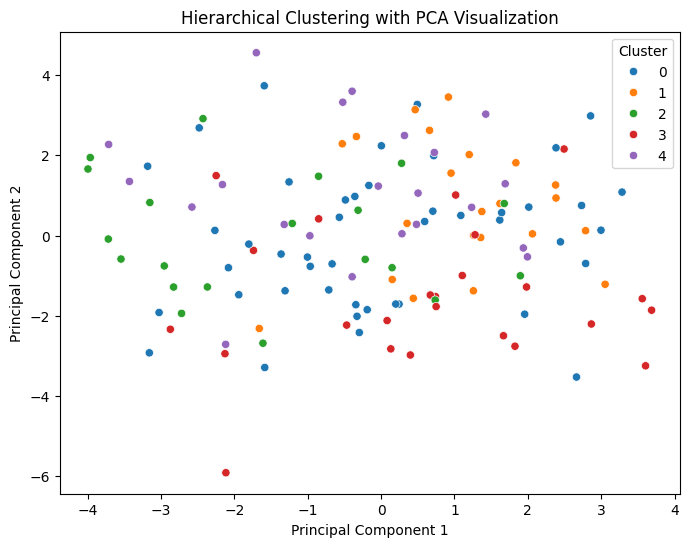

Countries in Hierarchical Cluster 0: ['Finland', 'Netherlands (Kingdom of the)', 'Germany', 'China', 'France', 'Austria', 'Hong Kong, China', 'Ireland', 'Luxembourg', 'Norway', 'Iceland', 'Australia', 'Spain', 'Malta', 'Czech Republic', 'Lithuania', 'India', 'Latvia', 'Croatia', 'Chile', 'Indonesia', 'Mexico', 'Colombia', 'Montenegro', 'Oman', 'Peru', 'Kazakhstan', 'Bosnia and Herzegovina', 'Albania', 'Egypt', 'Brunei Darussalam', 'Sri Lanka', 'Pakistan', 'Lebanon', 'Azerbaijan', 'Kenya', 'Dominican Republic', 'Kyrgyzstan', 'Bolivia', "Côte d'Ivoire", 'Algeria', 'Cameroon', 'Burundi', 'Burkina Faso', 'Angola']
Countries in Hierarchical Cluster 1: ['United Arab Emirates', 'Malaysia', 'Slovenia', 'Thailand', 'Qatar', 'Mauritius', 'North Macedonia', 'Ukraine', 'Barbados', 'Botswana', 'Senegal', 'El Salvador', 'Ghana', 'Namibia', 'Rwanda', 'Trinidad and Tobago', 'Zambia', 'Togo', 'Zimbabwe', 'Guatemala', 'Mali', 'Niger']
Countries in Hierarchical Cluster 2: ['Republic of Korea', 'Japan', '

In [ ]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(global_data.drop(columns=['Economy']))

# Apply hierarchical clustering
linkage_matrix = linkage(data_scaled, method='ward')

# Plot the dendrogram
plt.figure(figsize=(15, 7))
dendrogram(linkage_matrix, labels=global_data["Economy"].tolist(), orientation='top', leaf_rotation=90, leaf_font_size=8)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Countries')
plt.ylabel('Distance')
plt.show()

# Apply Agglomerative Clustering with the desired number of clusters
agg_clustering = AgglomerativeClustering(n_clusters=5, linkage='ward')
cluster_labels_agg = agg_clustering.fit_predict(data_scaled)

# Apply PCA for visualization of hierarchical clustering
pca_agg = PCA(n_components=2)
principal_components_agg = pca_agg.fit_transform(data_scaled)
prinicpal_df = pd.DataFrame(data=principal_components_agg, columns=['PC1', 'PC2'])
prinicpal_df['Cluster'] = cluster_labels_agg
prinicpal_df['Country'] = global_data["Economy"].tolist()

# Visualize the clusters from hierarchical clustering
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=prinicpal_df, palette='tab10')
plt.title('Hierarchical Clustering with PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Print countries in each cluster for hierarchical clustering
for i in range(6):
  cluster_countries_agg = prinicpal_df[prinicpal_df['Cluster'] == i]['Country'].tolist()
  print(f"Countries in Hierarchical Cluster {i}: {cluster_countries_agg}")

canada_cluster_agg = prinicpal_df[prinicpal_df['Country'] == 'Canada']['Cluster'].values[0]
print(f"Canada is in hierarchical cluster: {canada_cluster_agg}")


Interpretation: From the clustering we see taht the US lies together with Switzerland, Singapore, and New Zealand, which is expected. On the other hand, Canada lies together with brazil, bulgaria, uzbekistan, UK and Belarus.

We tried to group the clustering into 6 groups but this was giving us bizarre answers such as placing the US with Uganda. The PCA performed also shows the grouping when placed in 6 clusters was not good. Thus, we dicided to only look at the dendogram

### Feature Importance using the global index factors

We try using both lasso regression and random forest. The lasso regression was pushing too many features to 0, and was perhaps to understanding the co-related of some of these feature. Thus, we stuck with the random forest for our analysis

In [ ]:
# --- Feature Importance Analysis ---
# Define target variable (overall rank assumed as first column)
global_data = global_data.drop(columns=['Economy', "GII Rank"])
y = global_data.iloc[:, 0]  # The score
X = global_data.iloc[:, 1:]  # All other factors

# Train Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Train LASSO Regression for comparison
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X, y)
lasso_importances = pd.Series(np.abs(lasso.coef_), index=X.columns).sort_values(ascending=False)



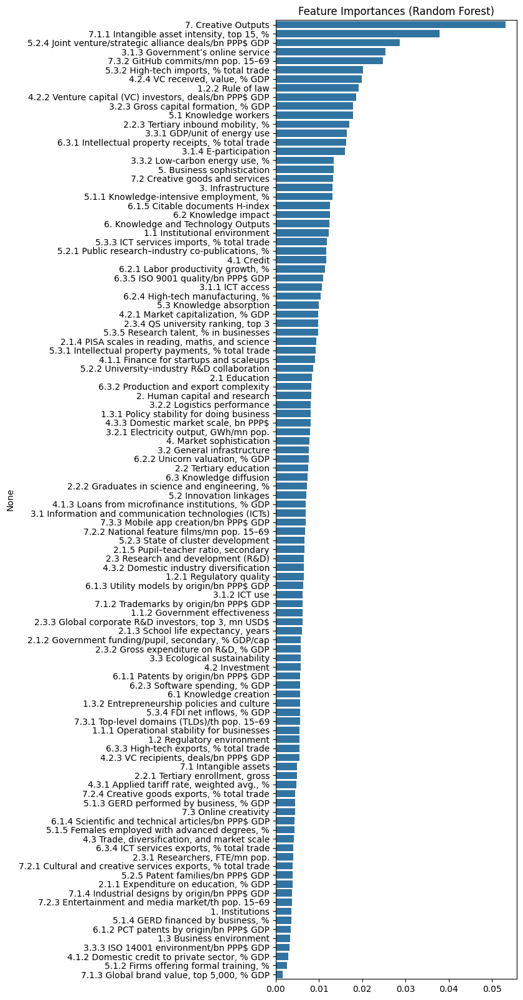

7. Creative Outputs                                         0.053103
7.1.1 Intangible asset intensity, top 15, %                 0.037881
5.2.4 Joint venture/strategic alliance deals/bn PPP$ GDP    0.028648
3.1.3 Government’s online service                           0.025380
7.3.2 GitHub commits/mn pop. 15–69                          0.024859
5.3.2 High-tech imports, % total trade                      0.020197
4.2.4 VC received, value, % GDP                             0.019917
1.2.2 Rule of law                                           0.019170
4.2.2 Venture capital (VC) investors, deals/bn PPP$ GDP     0.018550
3.2.3 Gross capital formation, % GDP                        0.017933
5.1 Knowledge workers                                       0.017888
2.2.3 Tertiary inbound mobility, %                          0.016991
3.3.1 GDP/unit of energy use                                0.016437
6.3.1 Intellectual property receipts, % total trade         0.016245
3.1.4 E-participation             

In [ ]:
# Plot feature importances
plt.figure(figsize=(5, 20))
sns.barplot(y=feature_importances.index, x=feature_importances.values)
#plt.xticks(rotation=90)
plt.title('Feature Importances (Random Forest)')
plt.show()

"""
plt.figure(figsize=(20, 5))
sns.barplot(x=lasso_importances.index, y=lasso_importances.values)
plt.xticks(rotation=90)
plt.title('Feature Importances (LASSO)')
plt.show()
"""
"""
# Create innovation score metric based on top features
top_features = feature_importances[:5].index  # Select top 5 factors
weights = feature_importances[:5] / feature_importances[:5].sum()  # Normalize weights
global_data['Innovation Score'] = (global_data[top_features] * weights.values).sum(axis=1)

# Save results
global_data.to_csv('country_clusters_and_innovation_scores.csv')
"""

print (feature_importances[:20])


Interpretation:

The top contributors to innovation are heavily concentrated in areas related to creative outputs and venture capital activity:

*   Intangible asset intensity and joint ventures per GDP (top 2) show that countries leading in innovation excel in converting ideas into valuable, marketable assets and fostering strategic business collaborations.

*   Government’s digital presence and open-source contributions (e.g., GitHub commits) also rank highly, emphasizing the importance of digital infrastructure and civic technology engagement.

*   High-tech imports, VC received, and gross capital formation reflect the importance of economic openness, investment flow, and access to emerging technologies.

Education and knowledge-related factors like knowledge workers, tertiary mobility, and knowledge-intensive employment play an essential but slightly secondary role. This suggests that while a strong talent base is necessary, it is not sufficient on its own — ecosystems that actively commercialize and scale innovation are the true differentiators.

Finally, some traditional indicators such as general infrastructure, market size, or tertiary education enrollment appear lower in importance. This implies that raw inputs matter less than how countries transform resources into innovation outputs.


<a name="policy-1"></a>
# **2.0 Policy 1: Addressing the Commercialization Gap**

1.   **Definition**  
Despite robust public investment in early-stage research, Canada consistently underperforms in translating innovation into commercial success. OECD data shows Canada ranks among the top countries for higher education R&D (HERD) as a share of GDP, yet it lags significantly in Business Expenditure on R&D (BERD), late-stage venture capital, and patent production. This policy highlights this weak pipeline from scientific discovery to globally competitive firms and briefly argues Canada's need for redirecting resources toward late-stage commercialization support.

2.   **Data sourcing**
*   Main science and technology indicators (from 2010 to 2022) :
  *   Author : OECD
  *   Dataset name in notebook : MSTI_data.csv
  *   URL :  https://data-explorer.oecd.org/vis?df[ds]=DisseminateFinalDMZ&df[id]=DSD_MSTI%40DF_MSTI&df[ag]=OECD.STI.STP&dq=.A.G_FB%2BG_FA%2BG_FG%2BH%2BB%2BG.PT_GERD%2BPT_B1GQ..&pd=2010%2C&to[TIME_PERIOD]=false&vw=tb


*   Venture capital investments (from 2010 to 2023) :
  *   Author : OECD
  *   Dataset name in notebook : VC_data.csv
  *   URL : https://data-explorer.oecd.org/vis?lc=en&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_VC%40DF_VC_INV&df[ag]=OECD.SDD.TPS&dq=...USD_EXC.A&pd=2007%2C&to[TIME_PERIOD]=false&vw=tb

*   Patent applications filed under the patent cooperation treaty (PCT) (from 2010 to 2021) :
  *   Author : OECD
  *   Dataset name in notebook : Patents_data.csv
  *   URL :  https://data-explorer.oecd.org/vis?df[ds]=DisseminateFinalDMZ&df[id]=DSD_MSTI%40DF_MSTI&df[ag]=OECD.STI.STP&dq=.A.G_FB%2BG_FA%2BG_FG%2BH%2BB%2BG.PT_GERD%2BPT_B1GQ..&pd=2010%2C&to[TIME_PERIOD]=false&vw=tb













In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

<a name="policy-1-cleaning"></a>
## **2.1 Data loading and cleaning**

Before performing any analysis, it is essential to load, explore, and clean the datasets to ensure consistency and readiness for merging. This section outlines how the data was imported, inspected, and cleaned.  
Prior to loading the dataset and cleaning it, we took a quick look at the datasets on Excel to verify their features and screen for redundant or useless columns.  
Firstly, the datasets have redunant columns like abreviated and long forms of the same fields (like type of tax, country name, etc.) or fields that didn't interest us like frequency of tax payments or action (they were the same for every entry). All those columns are deleted from the 'df' to facilitate further cleaning in this section.
*   Step 1 : Load the datasets and visualize them.
*   Step 2 : Ensure consistency betwen the `Measure` and `Unit of measure` fields of each dataset that will be later used for partitioning the datasets into multiple dataframes.
>After these steps, all datasets are cleaned, standardized, and ready to be merged for further analysis.

In [ ]:
# Load Main Science Indicators dataset from OECD
# URL: https://data-explorer.oecd.org/vis?df[ds]=DisseminateFinalDMZ&df[id]=DSD_MSTI%40DF_MSTI&df[ag]=OECD.STI.STP&dq=.A.G_FB%2BG_FA%2BG_FG%2BH%2BB%2BG.PT_GERD%2BPT_B1GQ..&pd=2010%2C&to[TIME_PERIOD]=false&vw=tb

complete_MSTI_df = pd.read_csv(policy1_path + "/MSTI_data.csv")

# Load Venture Capital Investments dataset from OECD
# URL: https://data-explorer.oecd.org/vis?df[ds]=DisseminateFinalDMZ&df[id]=DSD_MSTI%40DF_MSTI&df[ag]=OECD.STI.STP&dq=.A.G_FB%2BG_FA%2BG_FG%2BH%2BB%2BG.PT_GERD%2BPT_B1GQ..&pd=2010%2C&to[TIME_PERIOD]=false&vw=tb


complete_VC_df = pd.read_csv(policy1_path + "/VC_data.csv")

# Load Patent Applications dataset from OECD
# URL: https://data-explorer.oecd.org/vis?df[ds]=DisseminateFinalDMZ&df[id]=DSD_MSTI%40DF_MSTI&df[ag]=OECD.STI.STP&dq=.A.G_FB%2BG_FA%2BG_FG%2BH%2BB%2BG.PT_GERD%2BPT_B1GQ..&pd=2010%2C&to[TIME_PERIOD]=false&vw=tb

complete_Patents_df = pd.read_csv(policy1_path + "/Patents_data.csv")


In [ ]:
# Visualize the MSTI dataset
print(complete_MSTI_df.head())

# Identify the relevant columns
print(complete_MSTI_df.columns.tolist())

  STRUCTURE                        STRUCTURE_ID  \
0  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
1  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
2  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
3  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
4  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   

                                      STRUCTURE_NAME ACTION REF_AREA  \
0  Main Science and Technology Indicators (MSTI d...      I      FRA   
1  Main Science and Technology Indicators (MSTI d...      I      FRA   
2  Main Science and Technology Indicators (MSTI d...      I      FRA   
3  Main Science and Technology Indicators (MSTI d...      I      FRA   
4  Main Science and Technology Indicators (MSTI d...      I      FRA   

  Reference area FREQ Frequency of observation MEASURE  \
0         France    A                   Annual    G_FB   
1         France    A                   Annual    G_FB   
2         France    A                   Annual    G_FB   
3         France    A       

In [ ]:
# Visualize the VC dataset
print(complete_VC_df.head())

# Identify the relevant columns
print(complete_VC_df.columns.tolist())

  STRUCTURE                        STRUCTURE_ID  \
0  DATAFLOW  OECD.SDD.TPS:DSD_VC@DF_VC_INV(1.0)   
1  DATAFLOW  OECD.SDD.TPS:DSD_VC@DF_VC_INV(1.0)   
2  DATAFLOW  OECD.SDD.TPS:DSD_VC@DF_VC_INV(1.0)   
3  DATAFLOW  OECD.SDD.TPS:DSD_VC@DF_VC_INV(1.0)   
4  DATAFLOW  OECD.SDD.TPS:DSD_VC@DF_VC_INV(1.0)   

                                    STRUCTURE_NAME ACTION REF_AREA  \
0  Venture capital investments (market statistics)      I      BEL   
1  Venture capital investments (market statistics)      I      BEL   
2  Venture capital investments (market statistics)      I      BEL   
3  Venture capital investments (market statistics)      I      BEL   
4  Venture capital investments (market statistics)      I      BEL   

  Reference area     MEASURE                                          Measure  \
0        Belgium  VC_INV_MKT  Venture capital investments (market statistics)   
1        Belgium  VC_INV_MKT  Venture capital investments (market statistics)   
2        Belgium  VC_INV_MKT 

In [ ]:
# Visualize the Patents dataset
print(complete_Patents_df.head())

# Identify the relevant columns
print(complete_Patents_df.columns.tolist())

  STRUCTURE                        STRUCTURE_ID  \
0  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
1  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
2  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
3  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   
4  DATAFLOW  OECD.STI.STP:DSD_MSTI@DF_MSTI(1.3)   

                                      STRUCTURE_NAME ACTION REF_AREA  \
0  Main Science and Technology Indicators (MSTI d...      I      TUR   
1  Main Science and Technology Indicators (MSTI d...      I      TUR   
2  Main Science and Technology Indicators (MSTI d...      I      TUR   
3  Main Science and Technology Indicators (MSTI d...      I      TUR   
4  Main Science and Technology Indicators (MSTI d...      I      TUR   

  Reference area FREQ Frequency of observation MEASURE  \
0        Türkiye    A                   Annual   P_PCT   
1        Türkiye    A                   Annual   P_PCT   
2        Türkiye    A                   Annual   P_PCT   
3        Türkiye    A       

In [ ]:
# Only keep the useful columns
MSTI_df = complete_MSTI_df[["Reference area", "Measure", "Unit of measure", "TIME_PERIOD", "Price base", "OBS_VALUE"]]
VC_df = complete_VC_df[["Reference area", "Measure", "Unit of measure", "TIME_PERIOD", "OBS_VALUE", "Unit multiplier", "Business development stage"]]
Patents_df = complete_Patents_df[["Reference area", "Measure", "Unit of measure", "TIME_PERIOD", "Price base", "OBS_VALUE"]]

  The MSTI data is available for only a limited number of countries for 2023; therefore, this year is not included for analyses from this dataset.

In [ ]:
print("MSTI_df TIME_PERIOD counts:")
print(MSTI_df["TIME_PERIOD"].value_counts().sort_index())
print()

print("VC_df TIME_PERIOD counts:")
print(VC_df["TIME_PERIOD"].value_counts().sort_index())
print()

print("Patents_df TIME_PERIOD counts:")
print(Patents_df["TIME_PERIOD"].value_counts().sort_index())


MSTI_df TIME_PERIOD counts:
TIME_PERIOD
2010    1257
2011    1338
2012    1270
2013    1330
2014    1244
2015    1389
2016    1276
2017    1389
2018    1264
2019    1346
2020    1252
2021    1273
2022     796
2023      17
Name: count, dtype: int64

VC_df TIME_PERIOD counts:
TIME_PERIOD
2010    190
2011    192
2012    178
2013    192
2014    200
2015    194
2016    188
2017    190
2018    186
2019    188
2020    188
2021    192
2022    192
2023    174
Name: count, dtype: int64

Patents_df TIME_PERIOD counts:
TIME_PERIOD
2010    49
2011    49
2012    49
2013    49
2014    49
2015    49
2016    49
2017    49
2018    49
2019    49
2020    49
2021    49
Name: count, dtype: int64


In [ ]:
MSTI_df = MSTI_df[MSTI_df["TIME_PERIOD"] != 2023]

Based on the 'Measure' and 'Unit of measure' fields, the MSTI dataset is broken into different datasets to facilitate the process of analyzing the data. In this dataset the 'Measure' column is the indicator measured and the 'Unit of measure' is the unit we have used for quantifying that measure.

The measures in the MSTI datset include:
* Gross Domestic Expenditure on R&D (GERD)
* GERD financed by the business enterprise sector
* GERD financed by the rest of the world
* GERD financed by government
* Higher Education Expenditure on R&D (HERD)
* Business Enterprise Expenditure on R&D (BERD)

and the units of measure are:
* US dollars
* Percentage of GDP
* Percentage of gross domestic expenditure on R&D


In [ ]:
print(MSTI_df["Measure"].unique())

['GERD financed by the business enterprise sector'
 'GERD financed by the rest of the world'
 'Higher Education Expenditure on R&D (HERD)'
 'Gross Domestic Expenditure on R&D (GERD)' 'GERD financed by government'
 'Business Enterprise Expenditure on R&D (BERD)']


In [ ]:
# Break the dataframe into smaller dataframes based on different 'Measure' values
gerd_foreign_df = MSTI_df[MSTI_df["Measure"] == "GERD financed by the rest of the world"]
herd_df = MSTI_df[MSTI_df["Measure"] == "Higher Education Expenditure on R&D (HERD)"]
gerd_government_df = MSTI_df[MSTI_df["Measure"] == "GERD financed by government"]
gerd_business_df = MSTI_df[MSTI_df["Measure"] == "GERD financed by the business enterprise sector"]
gerd_total_df = MSTI_df[MSTI_df["Measure"] == "Gross Domestic Expenditure on R&D (GERD)"]
berd_df = MSTI_df[MSTI_df["Measure"] == "Business Enterprise Expenditure on R&D (BERD)"]

In [ ]:
print(MSTI_df["Unit of measure"].unique())

['US dollars, PPP converted' 'Percentage of GDP'
 'Percentage of gross domestic expenditure on R&D']


In [ ]:
# Break the dataframes separated by 'Measure' into smaller dataframes based on different 'Unit of measure' values

# GERD financed by the rest of the world
gerd_foreign_pct_gdp_df = gerd_foreign_df[gerd_foreign_df["Unit of measure"] == "Percentage of GDP"]
gerd_foreign_pct_gerd_df = gerd_foreign_df[gerd_foreign_df["Unit of measure"] == "Percentage of gross domestic expenditure on R&D"]
gerd_foreign_USD_df = gerd_foreign_df[(gerd_foreign_df["Unit of measure"] == "US dollars, PPP converted") & (gerd_foreign_df["Price base"] == "Current prices")]

# HERD
herd_pct_gdp_df = herd_df[herd_df["Unit of measure"] == "Percentage of GDP"]
herd_pct_gerd_df = herd_df[herd_df["Unit of measure"] == "Percentage of gross domestic expenditure on R&D"]
herd_USD_df = herd_df[(herd_df["Unit of measure"] == "US dollars, PPP converted") & (herd_df["Price base"] == "Current prices")]

# GERD financed by government
gerd_government_pct_gdp_df = gerd_government_df[gerd_government_df["Unit of measure"] == "Percentage of GDP"]
gerd_government_pct_gerd_df = gerd_government_df[gerd_government_df["Unit of measure"] == "Percentage of gross domestic expenditure on R&D"]
gerd_government_USD_df = gerd_government_df[(gerd_government_df["Unit of measure"] == "US dollars, PPP converted") & (gerd_government_df["Price base"] == "Current prices")]

# GERD financed by business enterprise sector
gerd_business_pct_gdp_df = gerd_business_df[gerd_business_df["Unit of measure"] == "Percentage of GDP"]
gerd_business_pct_gerd_df = gerd_business_df[gerd_business_df["Unit of measure"] == "Percentage of gross domestic expenditure on R&D"]
gerd_business_USD_df = gerd_business_df[(gerd_business_df["Unit of measure"] == "US dollars, PPP converted") & (gerd_business_df["Price base"] == "Current prices")]

# GERD total
gerd_total_pct_gdp_df = gerd_total_df[gerd_total_df["Unit of measure"] == "Percentage of GDP"]
gerd_total_pct_gerd_df = gerd_total_df[gerd_total_df["Unit of measure"] == "Percentage of gross domestic expenditure on R&D"]
gerd_total_USD_df = gerd_total_df[(gerd_total_df["Unit of measure"] == "US dollars, PPP converted") & (gerd_total_df["Price base"] == "Current prices")]

# BERD
berd_pct_gdp_df = berd_df[berd_df["Unit of measure"] == "Percentage of GDP"]
berd_pct_gerd_df = berd_df[berd_df["Unit of measure"] == "Percentage of gross domestic expenditure on R&D"]
berd_USD_df = berd_df[(berd_df["Unit of measure"] == "US dollars, PPP converted") & (berd_df["Price base"] == "Current prices")]


We repeat the same steps for the VC dataset. In this dataset our columns of main focus are 'Business development stage' and 'Unit of measure'.

The business development stages in the VC datset include:
* Start-up and other early stage investments
* Late stage investments
* Total investments

and the units of measure are:
* US dollars
* Percentage of GDP

In [ ]:
print(VC_df["Unit of measure"].unique())
print(VC_df["Business development stage"].unique())

['US dollars, exchange rate converted' 'Percentage of GDP']
['Total' 'Later stage venture' 'Start-up and other early stage']


In [ ]:
# Standardize the 'Business development stage' naming
VC_df["Business development stage"] = VC_df["Business development stage"].replace("Later stage venture", "Later stage")

# Break the dataframe into smaller dataframes based on updated 'Business development stage' and 'Unit of measure'
tot_USD_VC_df = VC_df[(VC_df["Unit of measure"] == "US dollars, exchange rate converted") & (VC_df["Business development stage"] == "Total")]
late_USD_VC_df = VC_df[(VC_df["Unit of measure"] == "US dollars, exchange rate converted") & (VC_df["Business development stage"] == "Later stage")]
early_USD_VC_df = VC_df[(VC_df["Unit of measure"] == "US dollars, exchange rate converted") & (VC_df["Business development stage"] == "Start-up and other early stage")]
tot_GDP_VC_df = VC_df[(VC_df["Unit of measure"] == "Percentage of GDP") & (VC_df["Business development stage"] == "Total")]
late_GDP_VC_df = VC_df[(VC_df["Unit of measure"] == "Percentage of GDP") & (VC_df["Business development stage"] == "Later stage")]
early_GDP_VC_df = VC_df[(VC_df["Unit of measure"] == "Percentage of GDP") & (VC_df["Business development stage"] == "Start-up and other early stage")]


For the patents dataset we only have one 'Measure', patent applications filed under the PCT, and the 'Unit of measure' is count of those filled patents, so there is no need for further downsizing.

In [ ]:
print(Patents_df["Measure"].unique())
print(Patents_df["Unit of measure"].unique())

['patent applications filed under the PCT']
['Patents']


<a name="policy-1-analysis"></a>
## **2.2 Results Analysis**


Number of patents have been widely used as a data source to measure innovative activities, especially the commercialization rate. However, it should be noted that there are limitations to patent statistics as a proxy for innovation, including the fact that not all patents will have commercialization potential; nevertheless, they are still a good estimating factor.


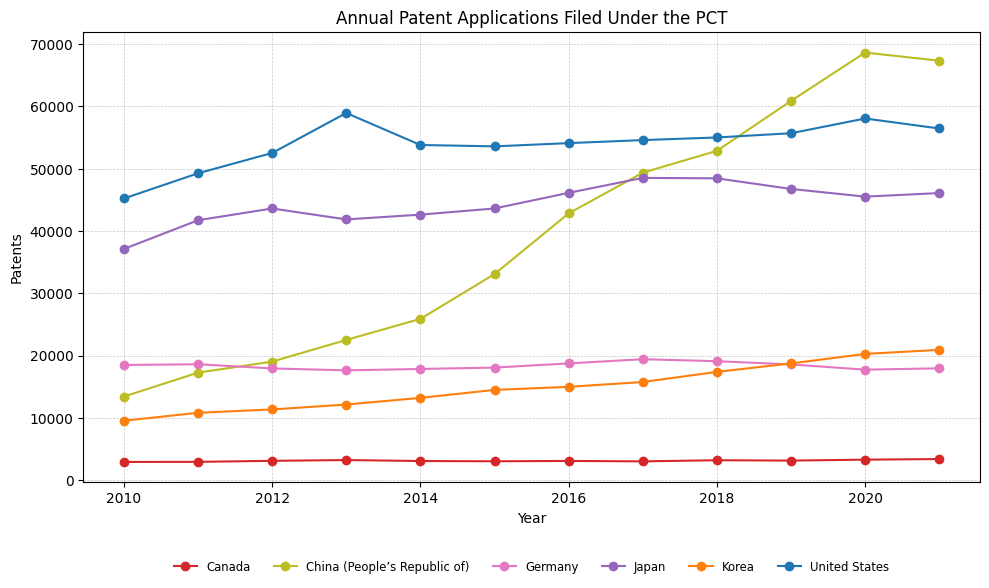

In [ ]:
# Dictionary of dataframes we are interested in
Patents_dataframes = {"Patents_df": Patents_df}

for name, df in Patents_dataframes.items():
    if df.empty:
        continue

    # Exclude groups of countries that are not individual nations
    df = df[~df["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Identify the top 5 countries
    averages = df.groupby("Reference area")["OBS_VALUE"].mean()
    top_countries = averages.sort_values(ascending=False).head(5).index.tolist()

    # Include Canada and US (US may sometimes be missed in "per % GDP" plots due to its high GDP)
    if "Canada" not in top_countries and "Canada" in df["Reference area"].unique():
        top_countries.append("Canada")
    if "United States" not in top_countries and "United States" in df["Reference area"].unique():
        top_countries.append("United States")

    df_filtered = df[df["Reference area"].isin(top_countries)]

    # Color mapping for consistency across all plots
    country_color_map = {"Canada": "#d62728", "United States": "#1f77b4", "United Kingdom": "#2ca02c", "Korea": "#ff7f0e", "Japan": "#9467bd", "Israel": "#8c564b", "Germany": "#e377c2", "Denmark": "#7f7f7f", "Finland": "#17becf", "China (People’s Republic of)": "#bcbd22", "Austria": "black"}

    # Plot the figures
    plt.figure(figsize=(10, 6))
    for country, group in df_filtered.groupby("Reference area"):
        group = group.sort_values("TIME_PERIOD")
        color = country_color_map.get(country, "blue")  # fallback to blue for unmapped countries
        plt.plot(group["TIME_PERIOD"], group["OBS_VALUE"],
                 marker='o', linestyle='-', label=country, color=color)

    plt.xlabel("Year")
    plt.ylabel(df["Unit of measure"].iloc[0])
    plt.title("Annual Patent Applications Filed Under the PCT")

    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)  # vertical + horizontal lines

    plt.legend(loc='upper center',
               bbox_to_anchor=(0.5, -0.15),
               ncol=len(df_filtered["Reference area"].unique()),
               fontsize="small",
               frameon=False)

    plt.tight_layout()
    plt.show()



Annual Patent Applications Filed Under the PCT in 2021:
1. China (People’s Republic of): 67345
2. United States: 56467
3. Japan: 46098
4. Korea: 20925
5. Germany: 17958
6. France: 6982
7. United Kingdom: 6375
8. Italy: 3859
9. Netherlands: 3661
10. Canada: 3392


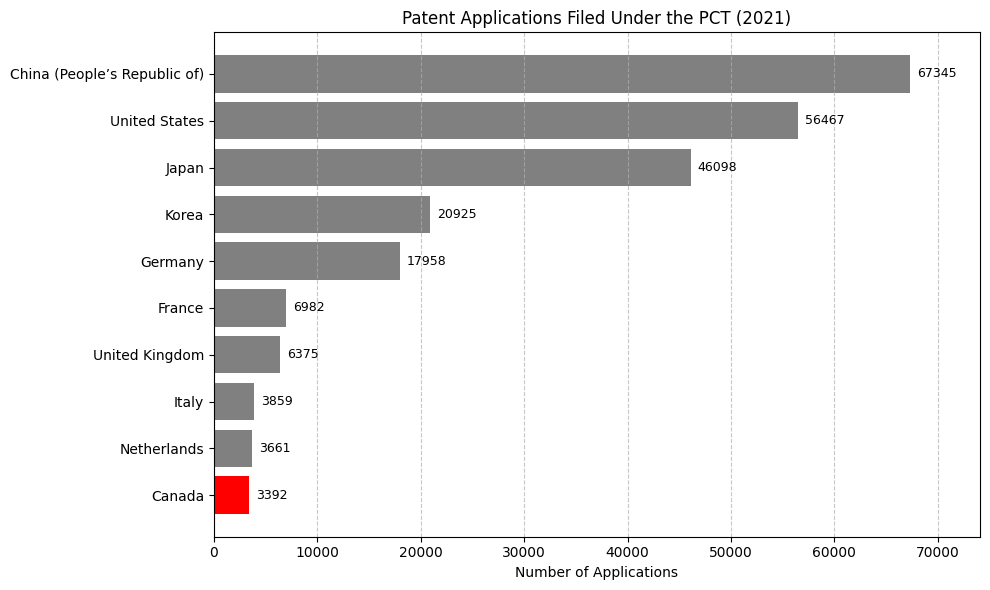

In [ ]:
# Dictionary of dataframes we are interested in
Patents_dataframes = {"Patents_df": Patents_df}

for name, df in Patents_dataframes.items():
    if df.empty:
        continue

    # Filter only for 2021
    df_2021 = df[df["TIME_PERIOD"] == 2021]

    # Exclude group entries
    df_2021 = df_2021[~df_2021["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Sort countries by OBS_VALUE descending
    sorted_df = df_2021.sort_values(by="OBS_VALUE", ascending=False).reset_index(drop=True)

    # Determine how many rows to print
    if "Canada" in sorted_df["Reference area"].values:
        canada_index = sorted_df[sorted_df["Reference area"] == "Canada"].index[0]
        n_rows = max(10, canada_index + 1)
    else:
        n_rows = 10

    # Slice data for plot
    plot_df = sorted_df.head(n_rows)

    # Print section header
    print("\nAnnual Patent Applications Filed Under the PCT in 2021:")
    for i, row in plot_df.iterrows():
        country = row["Reference area"]
        value = row["OBS_VALUE"]
        print(f"{i+1}. {country}: {value:.0f}")

    # --- Plotting ---
    plt.figure(figsize=(10, 6))
    bars = plt.barh(plot_df["Reference area"], plot_df["OBS_VALUE"],
                    color=["red" if country == "Canada" else "grey" for country in plot_df["Reference area"]])
    plt.title("Patent Applications Filed Under the PCT (2021)")
    plt.xlabel("Number of Applications")
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    max_val = plot_df["OBS_VALUE"].max()
    plt.xlim(0, max_val * 1.1)

    # Annotate bars with values
    for bar in bars:
        width = bar.get_width()
        plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height()/2,
                 f"{width:.0f}", va='center', fontsize=9)

    plt.tight_layout()
    plt.show()


The plot below is a plot from one of our referecnes, `Narwhal Project`, and recreated for consistency of the report.

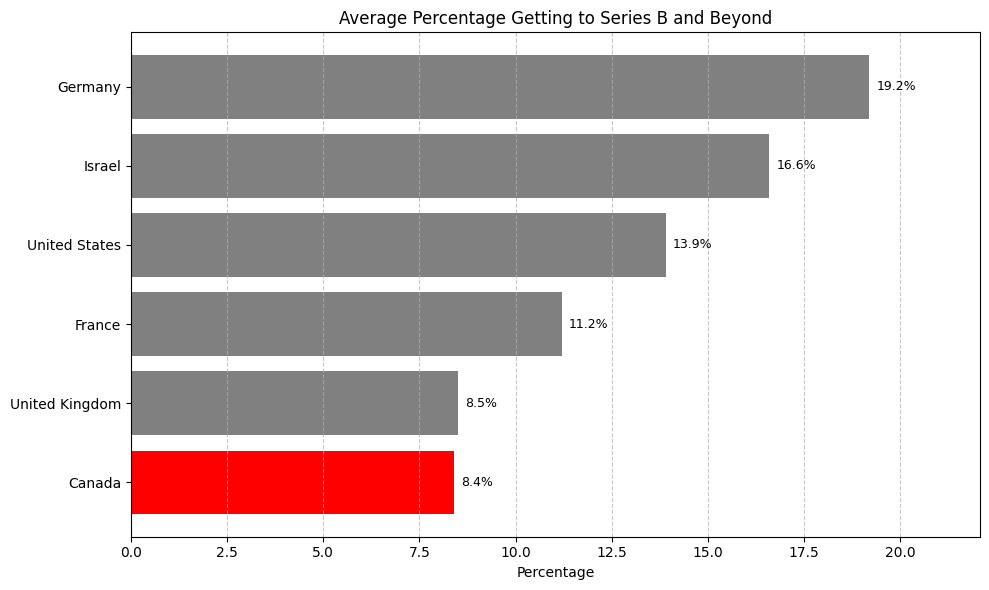

In [ ]:
# Source: https://narwhalproject.org/

# Data from the report
countries = ["Germany", "Israel", "United States", "France", "United Kingdom", "Canada"]
values = [19.2, 16.6, 13.9, 11.2, 8.5, 8.4]  # Percentages

# Sort descending
sorted_data = sorted(zip(countries, values), key=lambda x: x[1], reverse=True)
sorted_countries, sorted_values = zip(*sorted_data)

# Color: red for Canada, grey otherwise
colors = ['red' if country == 'Canada' else 'grey' for country in sorted_countries]

# Plot following the same formatting for consistency
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_countries, sorted_values, color=colors)
plt.gca().invert_yaxis()
plt.title("Average Percentage Getting to Series B and Beyond")
plt.xlabel("Percentage")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Label bars
max_val = max(sorted_values)
for bar in bars:
    width = bar.get_width()
    plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height() / 2,
             f"{width:.1f}%", va='center', fontsize=9)

plt.xlim(0, max_val * 1.15)
plt.tight_layout()
plt.show()


Canada has been the tenth country in filling patent applications in 2021, with numbers as low as half of leading countires such as China and the U.S. From the plots it is also evident that the rate of Canada's patent production is not increasing and looks like Canada is falling behind and unable to improve the commercialization rate of its innovations.

The "Average Percentage Getting to Series B and Beyond" plot is also another indicator of Canadian companies' problems in commercializing their products, with a low 8.4% success rate compared to other countries.

Now that we have identified one of Canada's innovation environment's problems, we need to understand what are the factors that we can mitigate to close that gap.

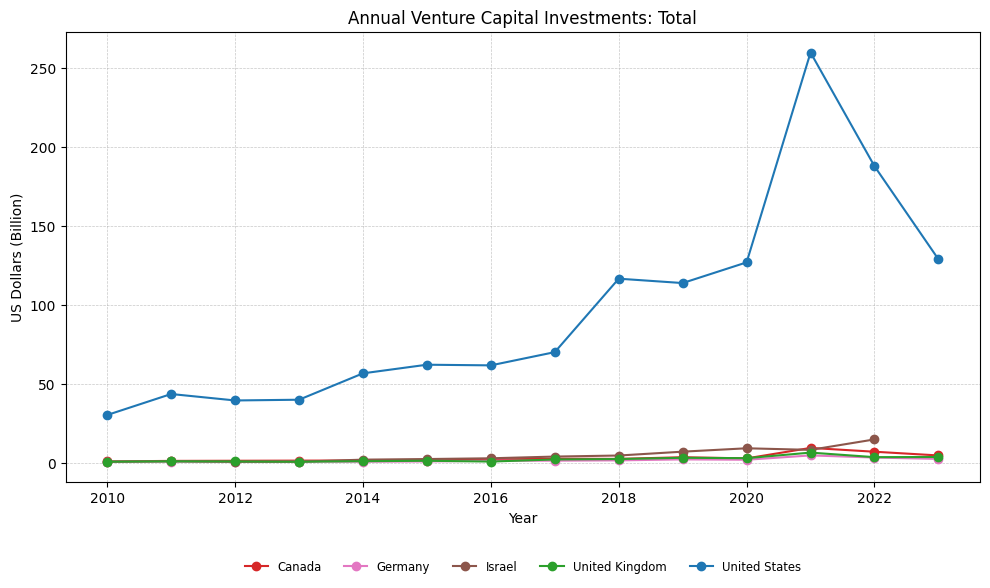

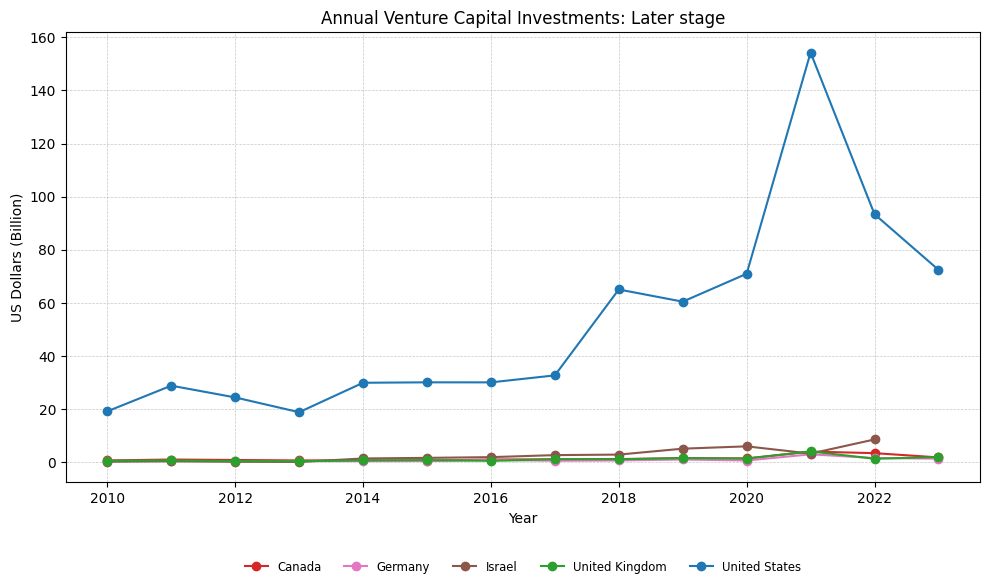

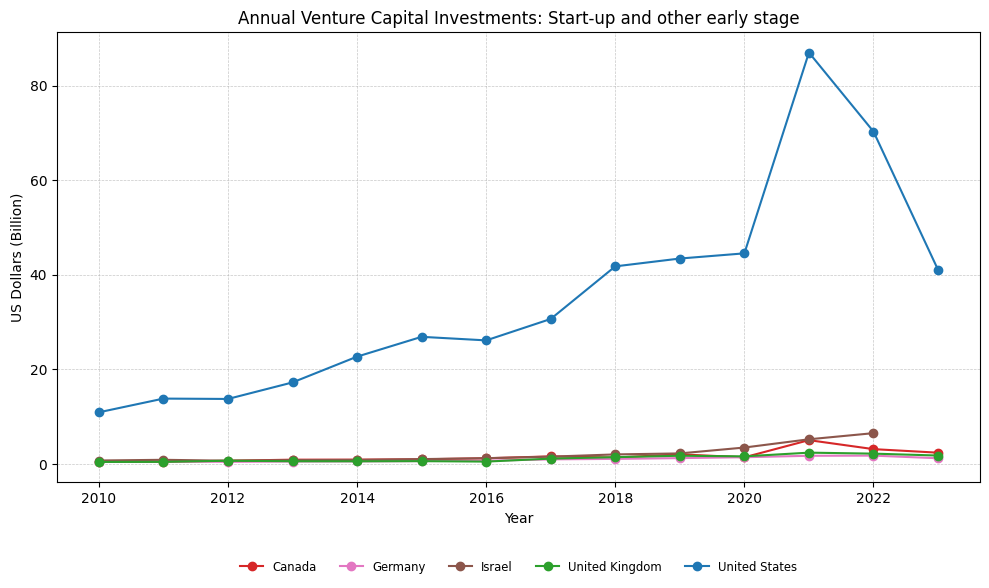

In [ ]:
# Dictionary of dataframes we are interested in
VC_dataframes = {"tot_USD_VC_df": tot_USD_VC_df, "late_USD_VC_df": late_USD_VC_df,
    "early_USD_VC_df": early_USD_VC_df}

for name, df in VC_dataframes.items():
    if df.empty:
        continue

    # Exclude groups of countries that are not individual nations
    df = df[~df["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Identify the top 5 countries
    averages = df.groupby("Reference area")["OBS_VALUE"].mean()
    top_countries = averages.sort_values(ascending=False).head(5).index.tolist()

    # Include Canada and US (US may sometimes be missed in "per % GDP" plots due to its high GDP)
    if "Canada" not in top_countries and "Canada" in df["Reference area"].unique():
        top_countries.append("Canada")
    if "United States" not in top_countries and "United States" in df["Reference area"].unique():
        top_countries.append("United States")

    df_filtered = df[df["Reference area"].isin(top_countries)]

    # Color mapping for consistency across all plots
    country_color_map = {"Canada": "#d62728", "United States": "#1f77b4", "United Kingdom": "#2ca02c", "Korea": "#ff7f0e", "Estonia": "#9467bd", "Israel": "#8c564b", "Germany": "#e377c2", "Denmark": "#7f7f7f", "Finland": "#17becf", "Switzerland": "#bcbd22", "Austria": "black"}

    # Plot the figures
    plt.figure(figsize=(10, 6))
    for country, group in df_filtered.groupby("Reference area"):
        group = group.sort_values("TIME_PERIOD")
        color = country_color_map.get(country, "blue")  # fallback to blue for unmapped countries
        plt.plot(group["TIME_PERIOD"], group["OBS_VALUE"]/1000,
                 marker='o', linestyle='-', label=country, color=color)

    plt.xlabel("Year")
    plt.ylabel("US Dollars (Billion)")
    plt.title(f"Annual Venture Capital Investments: {df['Business development stage'].iloc[0]}")

    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)  # vertical + horizontal lines

    plt.legend(loc='upper center',
               bbox_to_anchor=(0.5, -0.15),
               ncol=len(df_filtered["Reference area"].unique()),
               fontsize="small",
               frameon=False)

    plt.tight_layout()
    plt.show()



Annual venture capital investments in 2023 - Total (Million USD):

**Data of Israel for this year is missing.
1. United States: 129095.38
2. Canada: 4852.01
3. United Kingdom: 3886.03
4. Germany: 2650.37
5. Korea: 2572.64
6. France: 1750.21


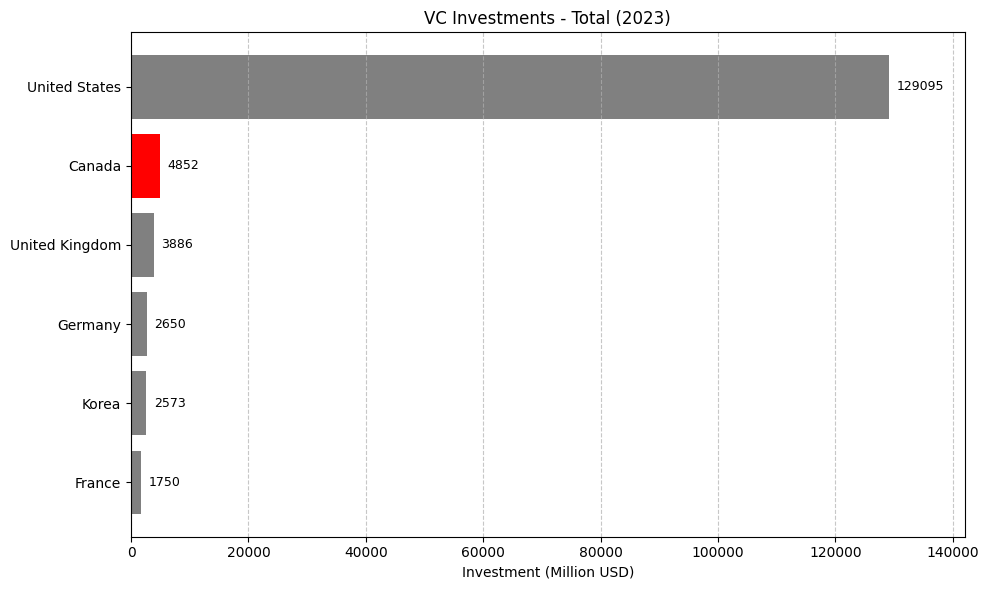


Annual venture capital investments in 2023 - Later stage (Million USD):

**Data of Israel for this year is missing.
1. United States: 72439.71
2. United Kingdom: 1885.18
3. Canada: 1764.41
4. Germany: 1306.42
5. France: 730.39
6. Netherlands: 373.54


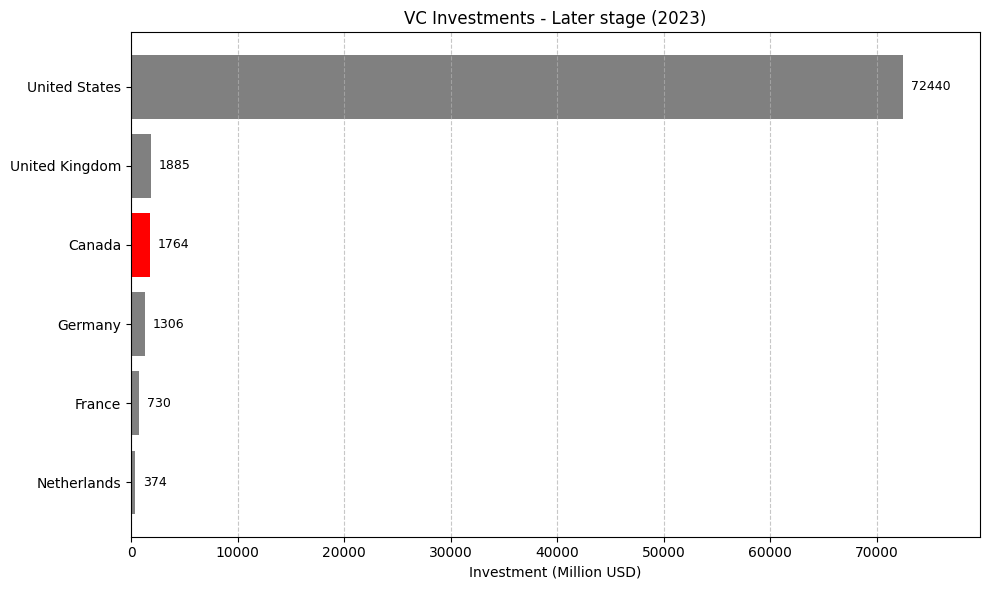


Annual venture capital investments in 2023 - Start-up and other early stage (Million USD):

**Data of Israel for this year is missing.
1. United States: 41031.27
2. Canada: 2350.99
3. United Kingdom: 1745.47
4. Germany: 1172.91
5. France: 858.17
6. Netherlands: 738.14


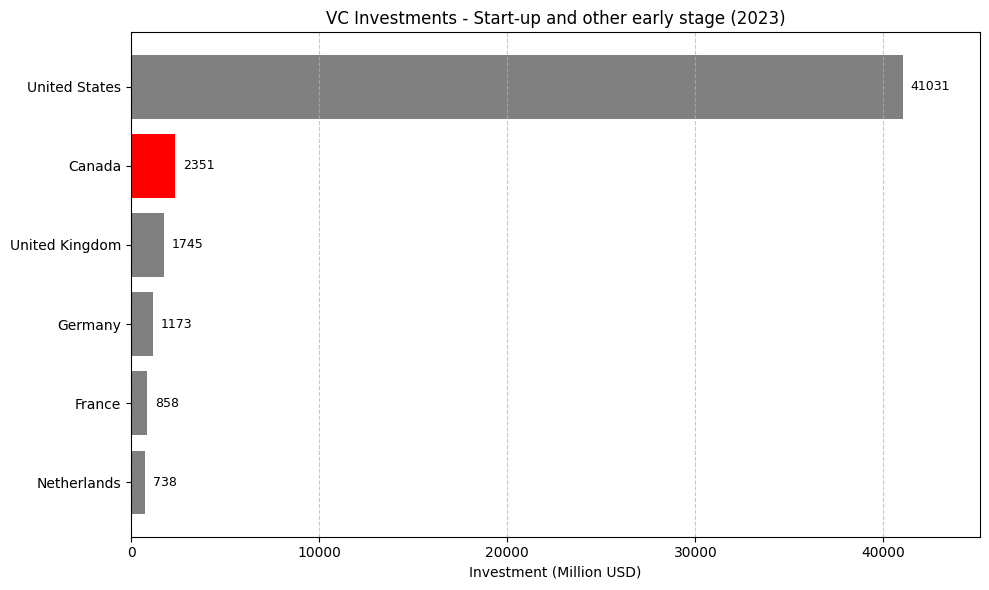

In [ ]:
# Dictionary of dataframes we are interested in
VC_dataframes = {"tot_USD_VC_df": tot_USD_VC_df, "late_USD_VC_df": late_USD_VC_df,
    "early_USD_VC_df": early_USD_VC_df}

for name, df in VC_dataframes.items():
    if df.empty:
        continue

    # Filter only for 2023
    df_2023 = df[df["TIME_PERIOD"] == 2023]

    # Exclude group entries
    df_2023 = df_2023[~df_2023["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Sort countries by OBS_VALUE descending
    sorted_df = df_2023.sort_values(by="OBS_VALUE", ascending=False).reset_index(drop=True)

    # Determine how many rows to show
    if "Canada" in sorted_df["Reference area"].values:
        canada_index = sorted_df[sorted_df["Reference area"] == "Canada"].index[0]
        n_rows = max(6, canada_index + 1)
    else:
        n_rows = 10

    # Trim data
    plot_df = sorted_df.head(n_rows)

    # Print section header
    print(f"\nAnnual venture capital investments in 2023 - {df['Business development stage'].iloc[0]} (Million USD):")
    print("\n**Data of Israel for this year is missing.")
    for i, row in plot_df.iterrows():
        country = row["Reference area"]
        value = row["OBS_VALUE"]
        print(f"{i+1}. {country}: {value:.2f}")

    # --- Plotting ---
    plt.figure(figsize=(10, 6))
    bars = plt.barh(plot_df["Reference area"], plot_df["OBS_VALUE"],
                    color=["red" if country == "Canada" else "grey" for country in plot_df["Reference area"]])
    plt.title(f"VC Investments - {df['Business development stage'].iloc[0]} (2023)")
    plt.xlabel("Investment (Million USD)")
    plt.gca().invert_yaxis()  # Highest at the top
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Determine max value for padding
    max_val = plot_df["OBS_VALUE"].max()
    plt.xlim(0, max_val * 1.1)  # Add 10% padding to the right

    # Annotate bars with values
    for bar in bars:
        width = bar.get_width()
        plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height()/2,
                 f"{width:.0f}", va='center', fontsize=9)

    plt.tight_layout()
    plt.show()



Israel's 2023 data is missing from the dataset, and since they are the clear leader in these investments, we revert to 2022 to give us a more accurate understanding of Canada's place compared to other leading nations.


Annual venture capital investments in 2022 - Total (Million USD):
1. United States: 188026.93
2. Israel: 15007.28
3. Canada: 7213.58
4. United Kingdom: 3773.92
5. Korea: 3666.82
6. Germany: 3524.72
7. France: 3292.19
8. Japan: 2449.46
9. Netherlands: 1070.08
10. Sweden: 957.24


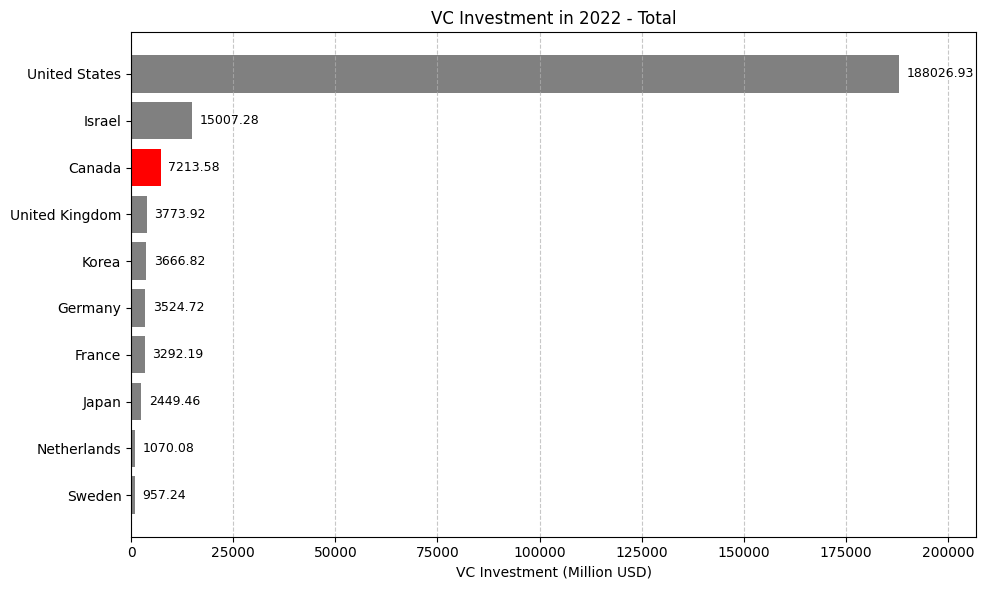


Annual venture capital investments in 2022 - Later stage (Million USD):
1. United States: 93380.63
2. Israel: 8526.35
3. Canada: 3370.77
4. France: 2014.70
5. Germany: 1520.82
6. United Kingdom: 1278.34
7. Sweden: 530.96
8. Spain: 424.45
9. Switzerland: 361.60
10. Netherlands: 305.27


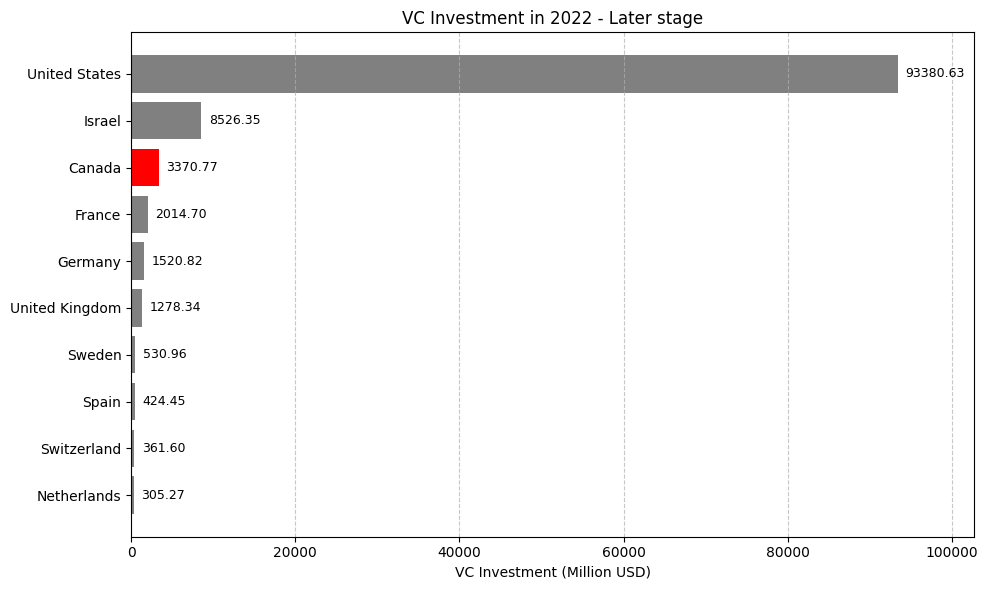


Annual venture capital investments in 2022 - Start-up and other early stage (Million USD):
1. United States: 70269.30
2. Israel: 6480.94
3. Canada: 3100.58
4. United Kingdom: 2149.81
5. Germany: 1724.77
6. France: 1172.69
7. Netherlands: 685.75
8. Spain: 474.78
9. Switzerland: 465.68
10. Sweden: 383.25


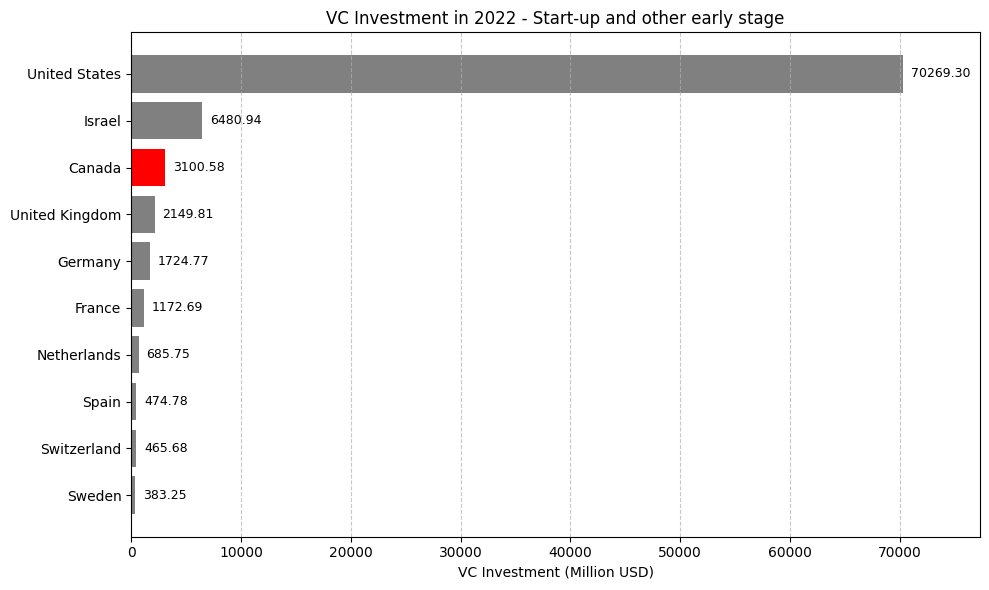

In [ ]:
# Dictionary of dataframes we are interested in
VC_dataframes = {"tot_USD_VC_df": tot_USD_VC_df, "late_USD_VC_df": late_USD_VC_df,
    "early_USD_VC_df": early_USD_VC_df}

for name, df in VC_dataframes.items():
    if df.empty:
        continue

    # Filter only for 2022
    df_2022 = df[df["TIME_PERIOD"] == 2022]

    # Exclude group entries
    df_2022 = df_2022[~df_2022["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Sort countries by OBS_VALUE descending
    sorted_df = df_2022.sort_values(by="OBS_VALUE", ascending=False).reset_index(drop=True)

    # Determine how many rows to print
    if "Canada" in sorted_df["Reference area"].values:
        canada_index = sorted_df[sorted_df["Reference area"] == "Canada"].index[0]
        n_rows = max(10, canada_index + 1)
    else:
        n_rows = 10

    # Slice top rows for plotting
    plot_df = sorted_df.head(n_rows)

    # Print section header
    print(f"\nAnnual venture capital investments in 2022 - {df['Business development stage'].iloc[0]} (Million USD):")
    for i, row in plot_df.iterrows():
        country = row["Reference area"]
        value = row["OBS_VALUE"]
        print(f"{i+1}. {country}: {value:.2f}")

    # --- Plotting ---
    plt.figure(figsize=(10, 6))
    bars = plt.barh(plot_df["Reference area"], plot_df["OBS_VALUE"],
                    color=["red" if country == "Canada" else "grey" for country in plot_df["Reference area"]])
    plt.title(f"VC Investment in 2022 - {df['Business development stage'].iloc[0]}")
    plt.xlabel("VC Investment (Million USD)")
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Add padding to x-axis
    max_val = plot_df["OBS_VALUE"].max()
    plt.xlim(0, max_val * 1.1)

    # Annotate bars with values
    for bar in bars:
        width = bar.get_width()
        plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height()/2,
                 f"{width:.2f}", va='center', fontsize=9)

    plt.tight_layout()
    plt.show()


The amount of VC investments in the U.S. is so high that in the plots it overshadows other top 5 countries. But we can see that Canada eventhough is spending around 20 times less than US, it still has managed to be in the top 3. However, the noticable factor is that the gap is larger when it comes to later stage investments, which is the stage that directly effects the success of the commercialization of the innovative companies. This indicates that Canada needs to have better late stage funding initiatives if it wants to stay in the race with other countries and does not want to lose its companies to countries like U.S. (i.e. acquisition of Element AI by ServiceNow).

The plot below is a plot from one of our referecnes, `Narwhal Project`, and recreated for consistency of the report.

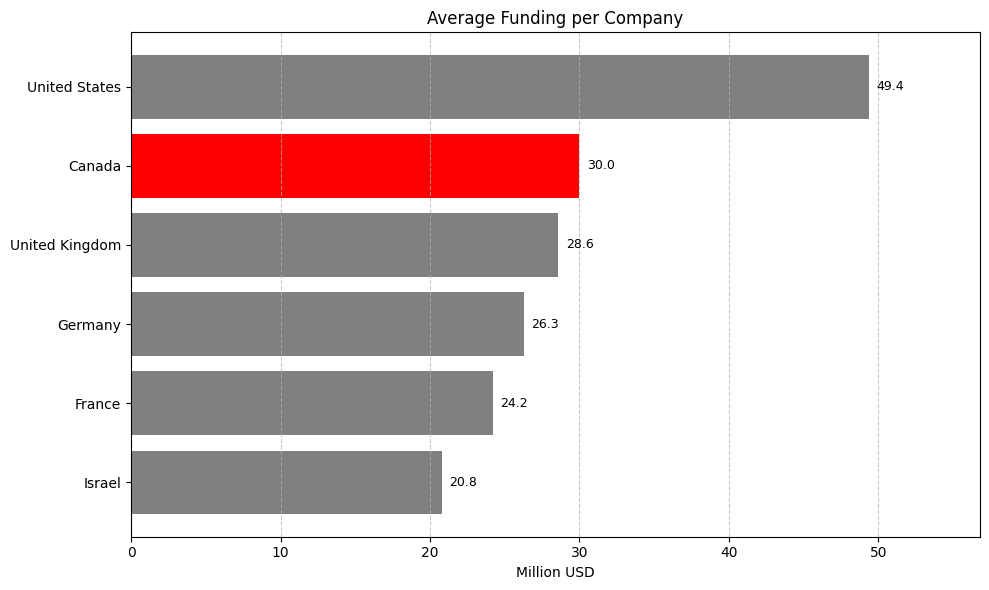

In [ ]:
# Source: https://narwhalproject.org/

# Data from the chart
countries = ["United States", "Canada", "United Kingdom", "Germany", "France", "Israel"]
values = [49.4, 30.0, 28.6, 26.3, 24.2, 20.8]

# Sort descending
sorted_data = sorted(zip(countries, values), key=lambda x: x[1], reverse=True)
sorted_countries, sorted_values = zip(*sorted_data)

# Color scheme: red for Canada, grey for others
colors = ['red' if country == 'Canada' else 'grey' for country in sorted_countries]

# Plot following the same formatting for consistency
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_countries, sorted_values, color=colors)
plt.gca().invert_yaxis()  # Highest at the top
plt.title("Average Funding per Company")
plt.xlabel("Million USD")
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add value labels
max_val = max(sorted_values)
for bar in bars:
    width = bar.get_width()
    plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height() / 2,
             f"{width:.1f}", va='center', fontsize=9)

plt.xlim(0, max_val * 1.15)
plt.tight_layout()
plt.show()


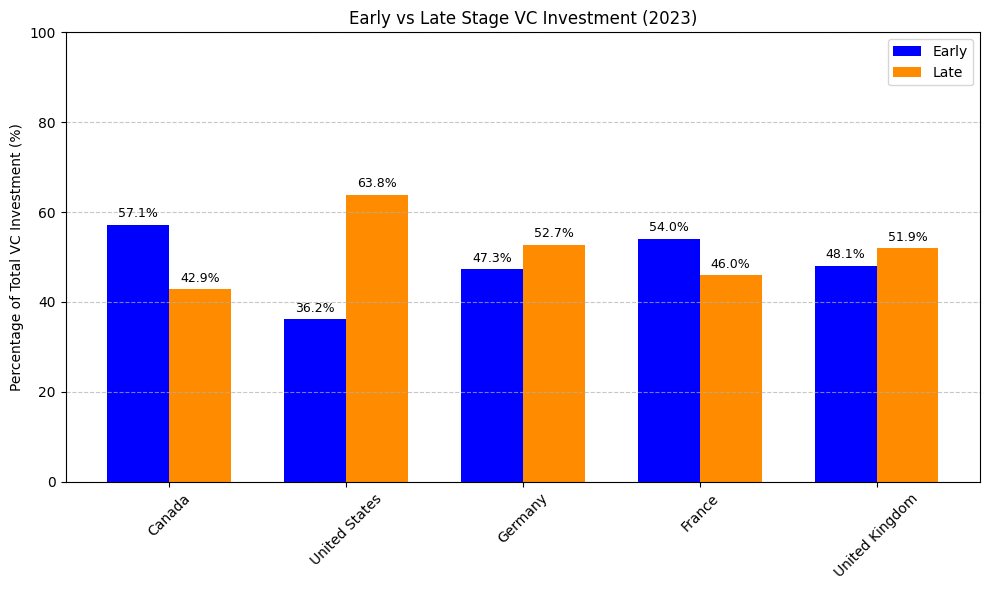

In [ ]:
# Countries that were in top 6 in both early and late stage funding
countries = ["Canada", "United States", "Germany", "France", "United Kingdom"]

# Filter 2023 data and exclude group entries
early_df = early_USD_VC_df[early_USD_VC_df["TIME_PERIOD"] == 2023]
late_df = late_USD_VC_df[late_USD_VC_df["TIME_PERIOD"] == 2023]
early_df = early_df[~early_df["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]
late_df = late_df[~late_df["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

# Collect early and late values for each country
early_vals = []
late_vals = []
for country in countries:
    early_val = early_df[early_df["Reference area"] == country]["OBS_VALUE"].sum()
    late_val = late_df[late_df["Reference area"] == country]["OBS_VALUE"].sum()
    total = early_val + late_val
    if total > 0:
        early_vals.append(early_val / total * 100)
        late_vals.append(late_val / total * 100)
    else:
        early_vals.append(0)
        late_vals.append(0)

# Plotting
x = np.arange(len(countries))
width = 0.35

plt.figure(figsize=(10, 6))
early_bars = plt.bar(x - width/2, early_vals, width, label='Early', color='blue')
late_bars = plt.bar(x + width/2, late_vals, width, label='Late', color='darkorange')

plt.ylabel("Percentage of Total VC Investment (%)")
plt.title("Early vs Late Stage VC Investment (2023)")
plt.xticks(x, countries, rotation=45)
plt.ylim(0, 100)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate bars with values
for bar in early_bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f"{height:.1f}%", ha='center', va='bottom', fontsize=9)

for bar in late_bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f"{height:.1f}%", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


High-performing countries invest a balanced share or focus more in later-stage ventures. Eventhough Canada is always a top-3 investor in innovation, by contrast to other leading nations, disproportionately emphasizes early-stage support by 15%, limiting the growth potential of its most promising firms. Canada should close the gap between early- and late-stage or follow the path that other leading countries are taking and emphasize more on late-stage funding. In summary, Canada’s problems are about taking products to market and not that of invention capacity and creating those products in the first place.

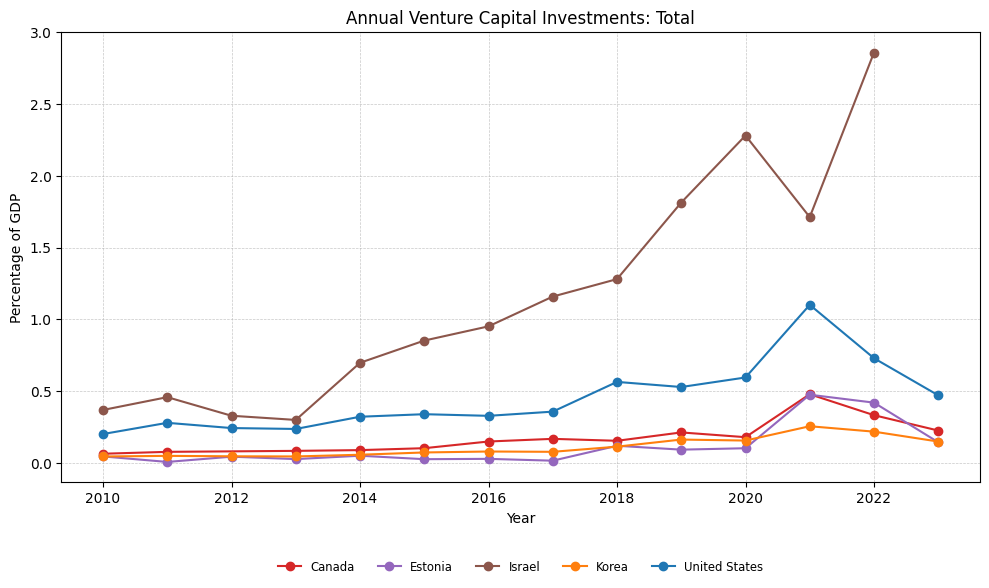

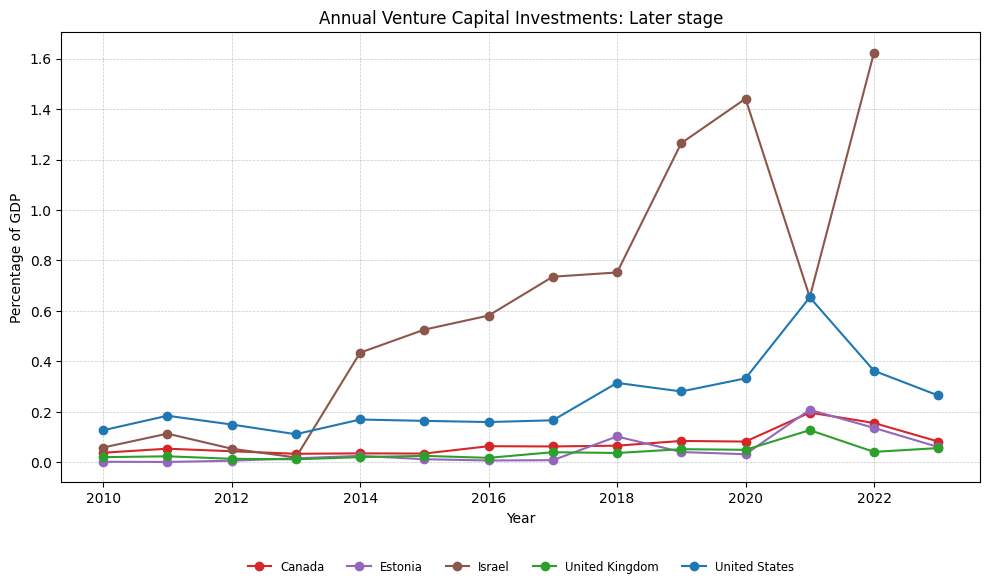

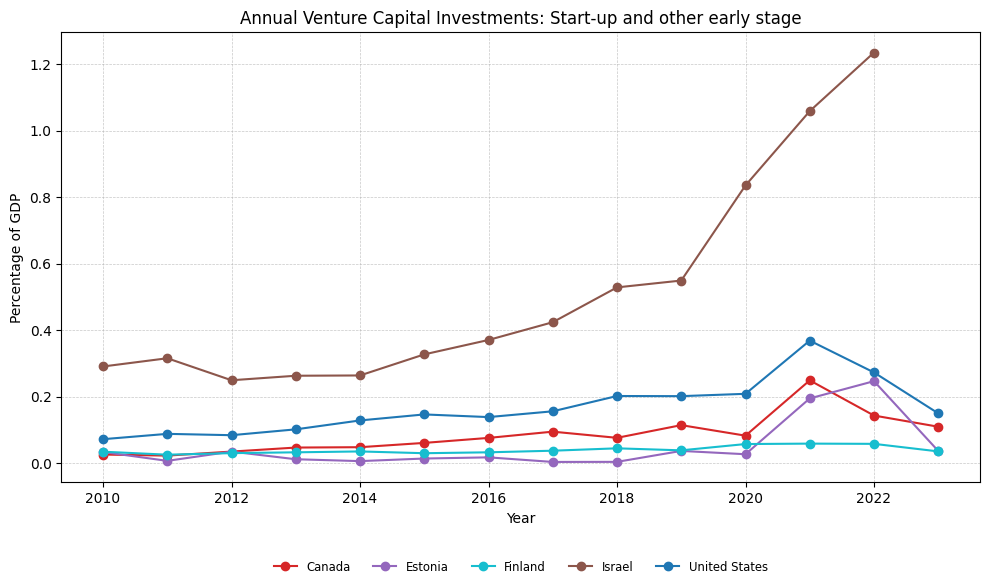

In [ ]:
# Dictionary of dataframes we are interested in
VC_dataframes = {"tot_GDP_VC_df": tot_GDP_VC_df, "late_GDP_VC_df": late_GDP_VC_df,
    "early_GDP_VC_df": early_GDP_VC_df}

for name, df in VC_dataframes.items():
    if df.empty:
        continue

    # Exclude groups of countries that are not individual nations
    df = df[~df["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Identify the top 5 countries
    averages = df.groupby("Reference area")["OBS_VALUE"].mean()
    top_countries = averages.sort_values(ascending=False).head(5).index.tolist()

    # Include Canada and US (US may sometimes be missed in "per % GDP" plots due to its high GDP)
    if "Canada" not in top_countries and "Canada" in df["Reference area"].unique():
        top_countries.append("Canada")
    if "United States" not in top_countries and "United States" in df["Reference area"].unique():
        top_countries.append("United States")

    df_filtered = df[df["Reference area"].isin(top_countries)]

    # Color mapping for consistency across all plots
    country_color_map = {"Canada": "#d62728", "United States": "#1f77b4", "United Kingdom": "#2ca02c", "Korea": "#ff7f0e", "Estonia": "#9467bd", "Israel": "#8c564b", "Germany": "#e377c2", "Denmark": "#7f7f7f", "Finland": "#17becf", "Switzerland": "#bcbd22", "Austria": "black"}

    # Plot the figures
    plt.figure(figsize=(10, 6))
    for country, group in df_filtered.groupby("Reference area"):
        group = group.sort_values("TIME_PERIOD")
        color = country_color_map.get(country, "blue")  # fallback to blue for unmapped countries
        plt.plot(group["TIME_PERIOD"], group["OBS_VALUE"],
                 marker='o', linestyle='-', label=country, color=color)

    plt.xlabel("Year")
    plt.ylabel(df["Unit of measure"].iloc[0])
    plt.title(f"Annual Venture Capital Investments: {df['Business development stage'].iloc[0]}")

    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)  # vertical + horizontal lines

    plt.legend(loc='upper center',
               bbox_to_anchor=(0.5, -0.15),
               ncol=len(df_filtered["Reference area"].unique()),
               fontsize="small",
               frameon=False)

    plt.tight_layout()
    plt.show()



Annual venture capital investments in 2022 - Total (Percentage of GDP):
1. Israel: 2.86
2. United States: 0.73
3. Estonia: 0.42
4. Canada: 0.33
5. Luxembourg: 0.28
6. Korea: 0.22
7. Sweden: 0.16
8. Finland: 0.13
9. United Kingdom: 0.12
10. France: 0.12


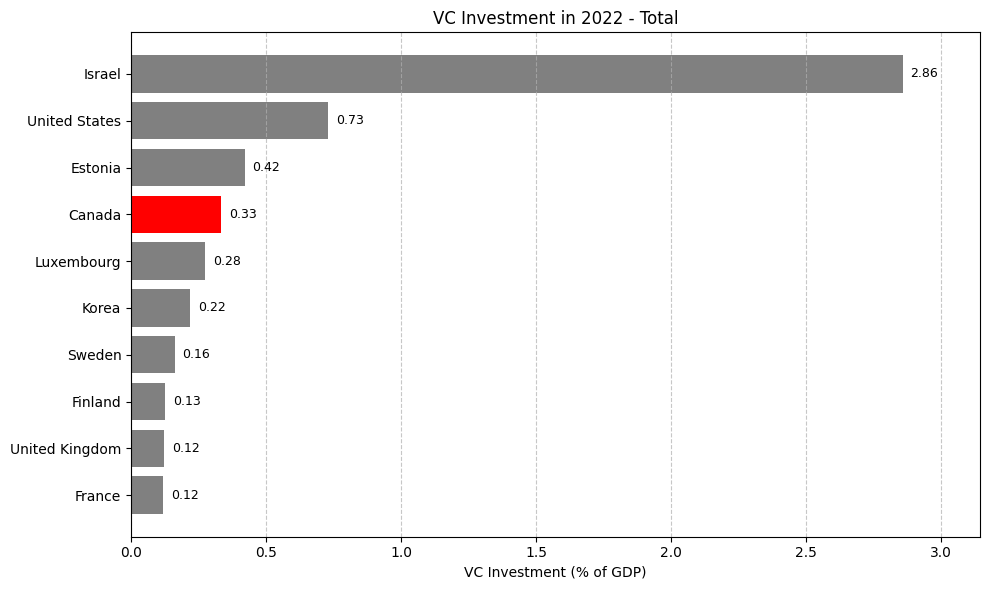


Annual venture capital investments in 2022 - Later stage (Percentage of GDP):
1. Israel: 1.62
2. United States: 0.36
3. Canada: 0.16
4. Estonia: 0.14
5. Sweden: 0.09
6. Lithuania: 0.09
7. France: 0.07
8. Switzerland: 0.04
9. Finland: 0.04
10. United Kingdom: 0.04


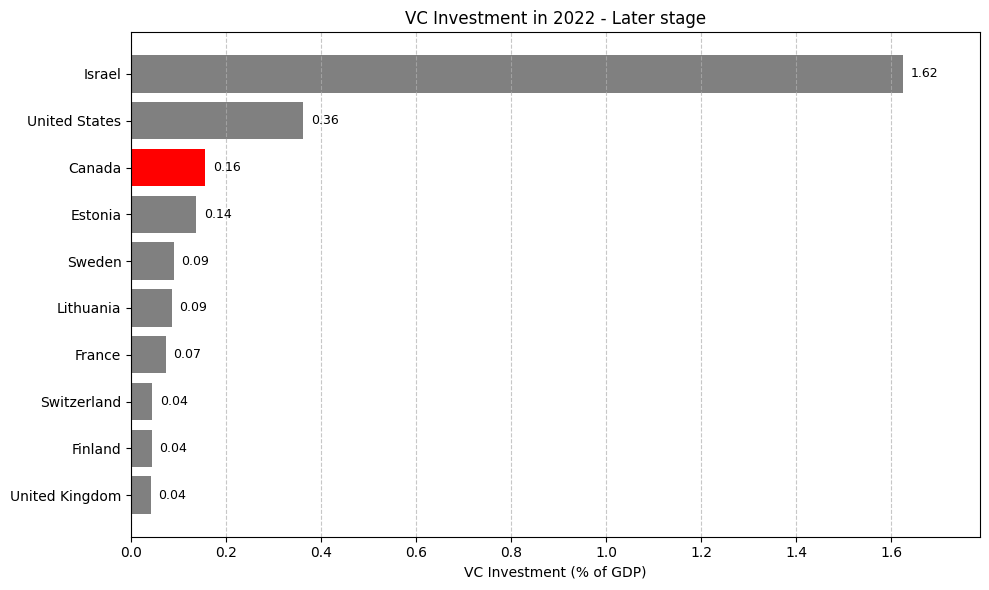


Annual venture capital investments in 2022 - Start-up and other early stage (Percentage of GDP):
1. Israel: 1.23
2. United States: 0.27
3. Luxembourg: 0.25
4. Estonia: 0.25
5. Canada: 0.14
6. United Kingdom: 0.07
7. Netherlands: 0.07
8. Sweden: 0.06
9. Finland: 0.06
10. Switzerland: 0.06


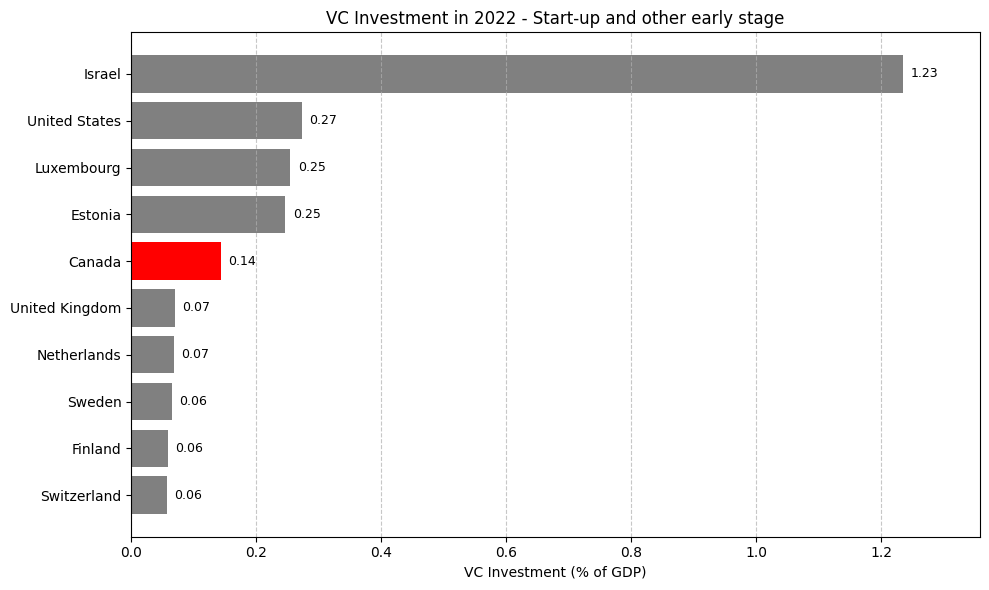

In [ ]:
# Dictionary of dataframes we are interested in
VC_dataframes = {"tot_GDP_VC_df": tot_GDP_VC_df, "late_GDP_VC_df": late_GDP_VC_df,
                 "early_GDP_VC_df": early_GDP_VC_df}

for name, df in VC_dataframes.items():
    if df.empty:
        continue

    # Filter only for 2022
    df_2022 = df[df["TIME_PERIOD"] == 2022]

    # Exclude group entries
    df_2022 = df_2022[~df_2022["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Sort countries by OBS_VALUE descending
    sorted_df = df_2022.sort_values(by="OBS_VALUE", ascending=False).reset_index(drop=True)

    # Determine how many rows to print
    if "Canada" in sorted_df["Reference area"].values:
        canada_index = sorted_df[sorted_df["Reference area"] == "Canada"].index[0]
        n_rows = max(10, canada_index + 1)
    else:
        n_rows = 10

    # Slice top n rows
    plot_df = sorted_df.head(n_rows)

    # Print section header
    print(f"\nAnnual venture capital investments in 2022 - {df['Business development stage'].iloc[0]} (Percentage of GDP):")
    for i, row in plot_df.iterrows():
        country = row["Reference area"]
        value = row["OBS_VALUE"]
        print(f"{i+1}. {country}: {value:.2f}")

    # --- Plotting ---
    plt.figure(figsize=(10, 6))
    bars = plt.barh(plot_df["Reference area"], plot_df["OBS_VALUE"],
                    color=["red" if country == "Canada" else "grey" for country in plot_df["Reference area"]])
    plt.title(f"VC Investment in 2022 - {df['Business development stage'].iloc[0]}")
    plt.xlabel("VC Investment (% of GDP)")
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Padding and label placement
    max_val = plot_df["OBS_VALUE"].max()
    plt.xlim(0, max_val * 1.1)

    for bar in bars:
        width = bar.get_width()
        plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height()/2,
                 f"{width:.2f}", va='center', fontsize=9)

    plt.tight_layout()
    plt.show()


The plots based on per percentage GDP allow a better visual understanding of the environment. Israel is the clear leader in all stages of VC investments and has a clear advantage from others. Eventhough Canada is always in the top 5, based on data from 2023 their later stage VC investments have been less than a third of the US, while in the early stage they have kept in touch with them. These all point more towards the urgency of the need for an efficient and well-planned late stage funding initiative for Canada.

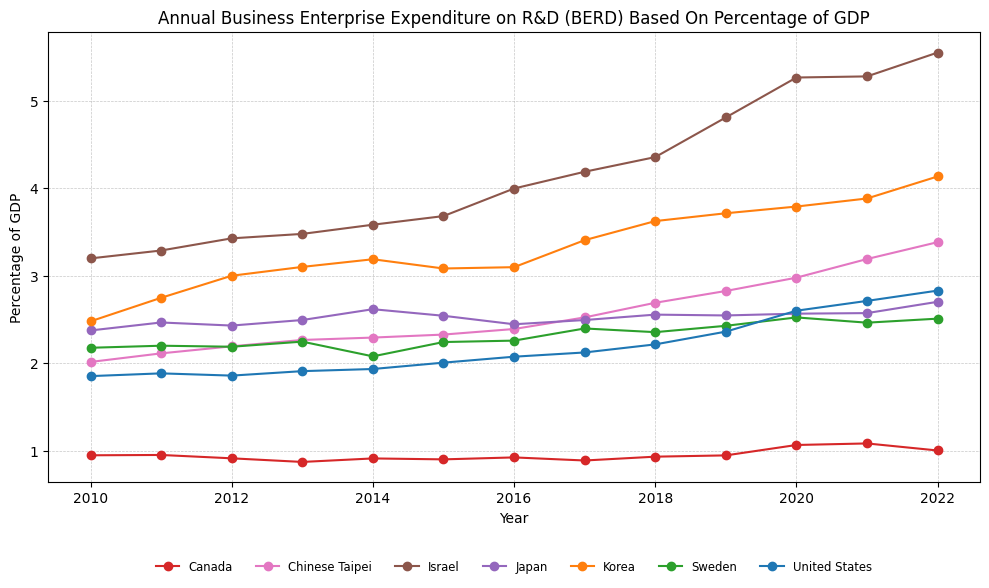

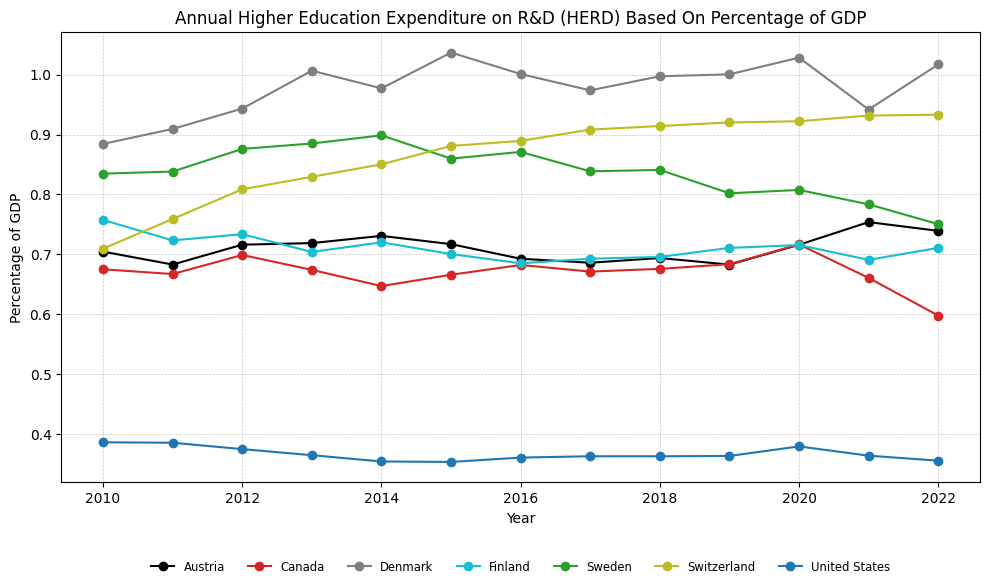

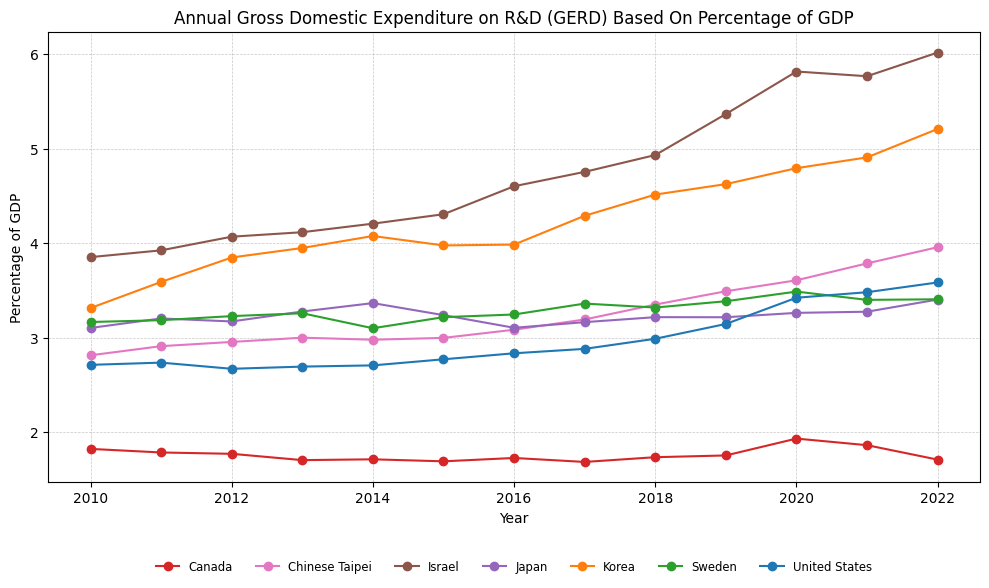

In [ ]:
# Dictionary of dataframes we are interested in
MSTI_dataframes = {"berd_pct_gdp_df": berd_pct_gdp_df, "herd_pct_gdp_df": herd_pct_gdp_df,
    "gerd_total_pct_gdp_df": gerd_total_pct_gdp_df}

for name, df in MSTI_dataframes.items():
    if df.empty:
        continue

    # Exclude non-country groupings
    df = df[~df["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Identify top 5 by average
    averages = df.groupby("Reference area")["OBS_VALUE"].mean()
    top_countries = averages.sort_values(ascending=False).head(5).index.tolist()

    # Manually ensure Canada and United States are always included
    if "Canada" not in top_countries and "Canada" in df["Reference area"].unique():
        top_countries.append("Canada")
    if "United States" not in top_countries and "United States" in df["Reference area"].unique():
        top_countries.append("United States")

    df_filtered = df[df["Reference area"].isin(top_countries)]

    # Color mapping for consistency across all plots
    country_color_map = {"Canada": "#d62728", "United States": "#1f77b4", "Sweden": "#2ca02c", "Korea": "#ff7f0e", "Japan": "#9467bd", "Israel": "#8c564b", "Chinese Taipei": "#e377c2", "Denmark": "#7f7f7f", "Finland": "#17becf", "Switzerland": "#bcbd22", "Austria": "black"}


    # Plot
    plt.figure(figsize=(10, 6))
    for country, group in df_filtered.groupby("Reference area"):
        group = group.sort_values("TIME_PERIOD")
        color = country_color_map.get(country, "blue")  # fallback to blue if country isn't mapped
        plt.plot(group["TIME_PERIOD"], group["OBS_VALUE"],
                 marker='o', linestyle='-', label=country, color=color)

    plt.xlabel("Year")
    plt.ylabel(df["Unit of measure"].iloc[0])
    plt.title(f"Annual {df['Measure'].iloc[0]} Based On {df['Unit of measure'].iloc[0]}")
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.legend(loc='upper center',
               bbox_to_anchor=(0.5, -0.15),
               ncol=len(df_filtered["Reference area"].unique()),
               fontsize="small",
               frameon=False)

    plt.tight_layout()
    plt.show()



Business Enterprise Expenditure on R&D (BERD) (Percentage of GDP) in 2022:
1. Israel: 5.55
2. Korea: 4.14
3. Chinese Taipei: 3.39
4. United States: 2.83
5. Japan: 2.70
6. Sweden: 2.51
7. Belgium: 2.51
8. Austria: 2.20
9. Germany: 2.11
10. Finland: 2.02
11. United Kingdom: 1.99
12. China (People’s Republic of): 1.98
13. Iceland: 1.88
14. Denmark: 1.78
15. Netherlands: 1.56
16. Slovenia: 1.48
17. France: 1.43
18. Czechia: 1.26
19. Portugal: 1.06
20. Canada: 1.00


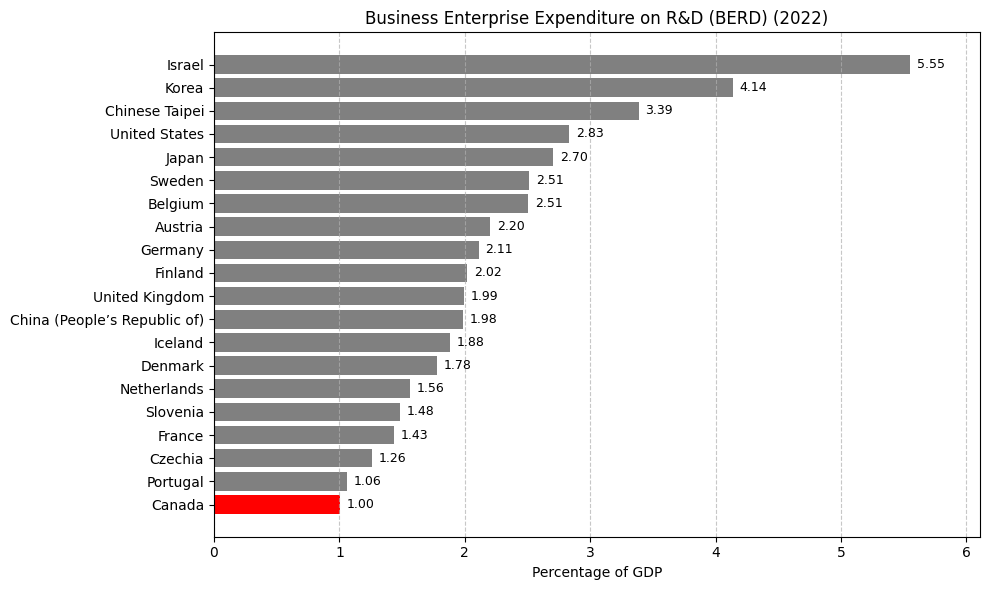


Higher Education Expenditure on R&D (HERD) (Percentage of GDP) in 2022:
1. Denmark: 1.02
2. Switzerland: 0.93
3. Sweden: 0.75
4. Austria: 0.74
5. Finland: 0.71
6. Iceland: 0.65
7. Netherlands: 0.63
8. Canada: 0.60
9. Estonia: 0.59
10. Belgium: 0.58


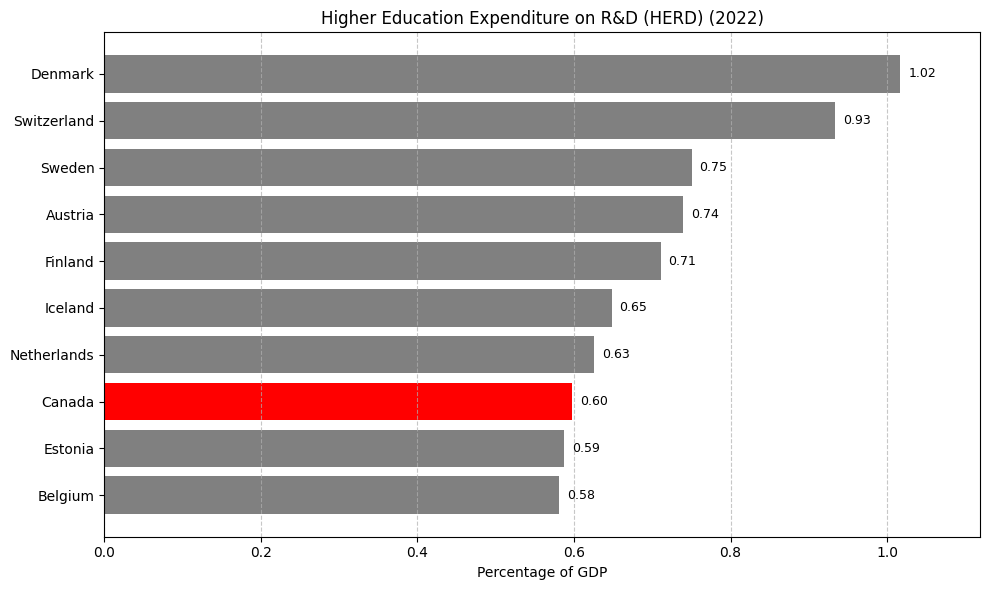


Gross Domestic Expenditure on R&D (GERD) (Percentage of GDP) in 2022:
1. Israel: 6.02
2. Korea: 5.21
3. Chinese Taipei: 3.96
4. United States: 3.59
5. Sweden: 3.41
6. Belgium: 3.41
7. Japan: 3.41
8. Austria: 3.20
9. Germany: 3.13
10. Finland: 2.96
11. Denmark: 2.89
12. Iceland: 2.60
13. China (People’s Republic of): 2.56
14. Netherlands: 2.30
15. France: 2.18
16. Slovenia: 2.11
17. Czechia: 1.96
18. Estonia: 1.78
19. Canada: 1.71


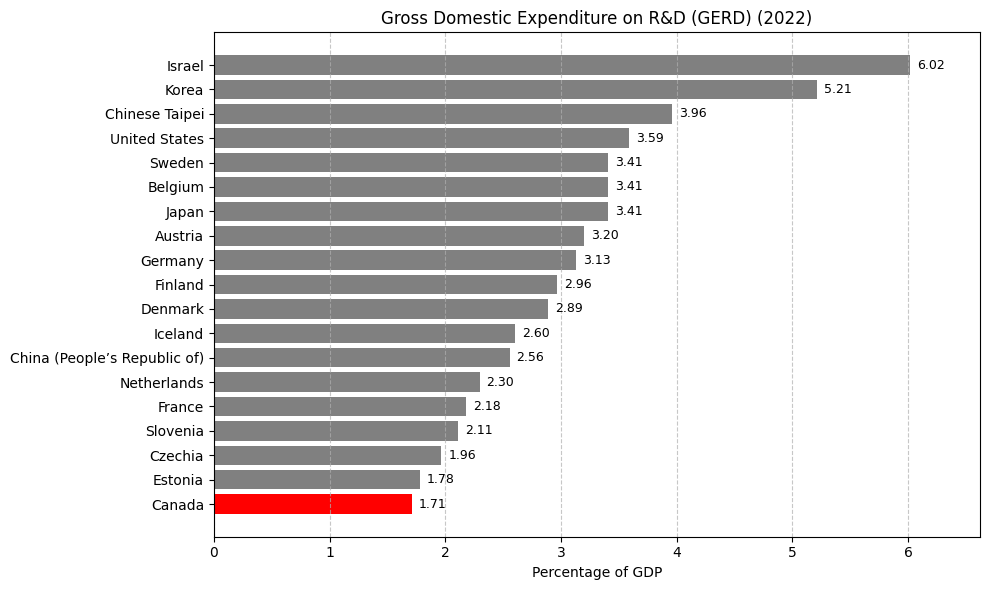

In [ ]:
# Dictionary of dataframes we are interested in
MSTI_dataframes = {
    "berd_pct_gdp_df": berd_pct_gdp_df,
    "herd_pct_gdp_df": herd_pct_gdp_df,
    "gerd_total_pct_gdp_df": gerd_total_pct_gdp_df
}

for name, df in MSTI_dataframes.items():
    if df.empty:
        continue

    # Filter only for 2022
    df_2022 = df[df["TIME_PERIOD"] == 2022]

    # Exclude group entries
    df_2022 = df_2022[~df_2022["Reference area"].isin(["European Union (27 countries from 01/02/2020)", "OECD"])]

    # Sort countries by OBS_VALUE descending
    sorted_df = df_2022.sort_values(by="OBS_VALUE", ascending=False).reset_index(drop=True)

    # Determine how many rows to print
    if "Canada" in sorted_df["Reference area"].values:
        canada_index = sorted_df[sorted_df["Reference area"] == "Canada"].index[0]
        n_rows = max(10, canada_index + 1)
    else:
        n_rows = 10

    # Slice data
    plot_df = sorted_df.head(n_rows)

    # Print section header
    print(f"\n{df['Measure'].iloc[0]} ({df['Unit of measure'].iloc[0]}) in 2022:")
    for i, row in plot_df.iterrows():
        country = row["Reference area"]
        value = row["OBS_VALUE"]
        print(f"{i+1}. {country}: {value:.2f}")

    # --- Plotting ---
    plt.figure(figsize=(10, 6))
    bars = plt.barh(plot_df["Reference area"], plot_df["OBS_VALUE"],
                    color=["red" if country == "Canada" else "grey" for country in plot_df["Reference area"]])
    plt.title(f"{df['Measure'].iloc[0]} (2022)")
    plt.xlabel(f"{df['Unit of measure'].iloc[0]}")
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Padding for value labels
    max_val = plot_df["OBS_VALUE"].max()
    plt.xlim(0, max_val * 1.1)

    # Annotate bars
    for bar in bars:
        width = bar.get_width()
        plt.text(width + max_val * 0.01, bar.get_y() + bar.get_height()/2,
                 f"{width:.2f}", va='center', fontsize=9)

    plt.tight_layout()
    plt.show()


On the other hand, in expenditures on R&D, Canada is falling behind from other countries significantly. The largest gap appears in the Business Enterprise Expenditure on R&D (BERD) category. Countries like Israel and South Korea exceed 3%. Figure 3(b) shows a clear correlation between higher private-sector R&D and stronger commercialization outcomes. Encouraging the businesses to pay more attention to R&D to improve Canada's innovation ecosystem is another stream of action, helpful in closing the gap with other countries.

To conclude, Canada excels in early-stage innovation and venture capital attraction but continues to underperform in scaling and commercialization, with one of the lowest rates of companies reaching Series B funding and a modest global patent ranking. A key issue is the federal overemphasis on early-stage support, alongside a fragmented innovation funding landscape. To close this commercialization gap, the government should reallocate funds toward later-stage ventures by consolidating programs, and increase private-sector R&D investment through targeted tax credits, matching programs where public funds match private investments, and revenue-based incentives. Additionally, public procurement should be used as a strategic tool to support scale-ups by mandating departments to allocate and prioritize contracts for innovative Canadian firms—particularly in key sectors like clean tech and biotech—thereby offering early revenue, validation, and market access.

<a name="policy-2"></a>
# **3.0 Policy 2 : Tax Breaks and Deregulations**

1.   **Definition**  
This policy consists of studying the potential benefits that Canada's innovation sector will experience if corporate taxes are lowered. The report will go into more detail about the benefits of deregulations as finding concrete data on the matter was not easy. This section analyses the relationship between corporate tax rates and various indicators of innovation and economic growth (GDP growth, venture capital investment, startup success).

2.   **Data sourcing**
*   Corporate taxes (from 2019 to 2023) :
  *   Author : OECD
  *   Dataset name in notebook : OECD_Corporate_Taxes.csv
  *   URL :  https://data-explorer.oecd.org/vis?fs[0]=Topic%2C1%7CTaxation%23TAX%23%7CCorporate%20tax%23TAX_CPT%23&pg=0&fc=Topic&bp=true&snb=16&vw=tb&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_TAX_CIT%40DF_CIT&df[ag]=OECD.CTP.TPS&df[vs]=1.0&dq=.A..ST..S13%2BS1311%2BS13M..&lom=LASTNPERIODS&lo=1&to[TIME_PERIOD]=false

*   Venture capital Ivestments (from 2007 to 2023) :
  *   Author : OECD
  *   Dataset name in notebook : OECD_Venture_Capital_Investments.csv
  *   URL : https://data-explorer.oecd.org/vis?lc=en&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_VC%40DF_VC_INV&df[ag]=OECD.SDD.TPS&dq=...USD_EXC.A&pd=2007%2C&to[TIME_PERIOD]=false&vw=tb

*   GDP growth (from 1961 to 2023) :
  *   Author : World Bank
  *   Dataset name in notebook : GDP_Growth.csv
  *   URL : https://data.worldbank.org/indicator/NY.GDP.MKTP.KD.ZG

*   Global Startup Success Dataset (from 2000 to 2022) :
  *   Author : Kaggle user
  *   Dataset name in notebook : global_startup_success_dataset.csv
  *   URL : https://www.kaggle.com/datasets/hamnakaleemds/global-startup-success-dataset?resource=download















In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

<a name="policy-2-cleaning"></a>
## **3.1 Data loading and cleaning**

Before performing any analysis, it is essential to load, explore, and clean the datasets to ensure consistency and readiness for merging. This section outlines how the data was imported, inspected, and cleaned.  
Prior to loading the dataset and cleaning it, we took a quick look at the datasets on Excel to verify their features and screen for redundant or useless columns.  
Firstly, the OECD corporate tax rates dataset had redunant columns like abreviated and long forms of the same fields (like type of tax, country name, etc.) or fields that didn't interest us like frequency of tax payments or action (they were the same for every entry). All those columns were manually deleted from the csv in Excel to facilitate further cleaning in this section.  Secondly, the same was done for the OECD Venture capital investments dataset.
*   Step 1 : Load the datasets and visualize them
*   Step 2 : Ensure consistency betwen the `Country` and `Year` fields of each dataset that will be later used for merging them together
*   Step 3 : The **GDP dataset** was initially in wide format, with each year as a separate column. Using `pandas.melt()`, we reshaped it into long format with columns `Country`, `Year`, and `GDP_Growth`, which facilitates merging and time-series analysis.
*   Step 4 : We convert the `Year` column to numeric using `pd.to_numeric()` to ensure proper filtering, grouping, and merging. Invalid or non-numeric entries are safely coerced to `NaN`.  
*   Step 5 : For the **Corportate taxes dataset**, only the combined corporate tax rates were preserved to only consider provincial + federal taxes where applicable (done right before merging)
>After these steps, all datasets are cleaned, standardized, and ready to be merged for further analysis.

In [ ]:
# Load the datasets
taxes = pd.read_csv(policy2_path + "/OECD_Corporate_Taxes.csv")
venture_capital = pd.read_csv(policy2_path +"/OECD_Venture_Capital_Investments.csv")
startup_success = pd.read_csv(policy2_path +"/global_startup_success_dataset.csv")
gdp_growth = pd.read_csv(policy2_path +"/GDP_Growth.csv")

# Display first few rows of each dataset
print("Corporate Taxes Data:\n", taxes.head(), "\n")
print("Venture Capital Investments Data:\n", venture_capital.head(), "\n")
print("Startup Success Data:\n", startup_success.head(), "\n")
print("GDP Growth Data:\n", gdp_growth.head(), "\n")


Corporate Taxes Data:
                             Country               CORP_TAX  \
0  Democratic Republic of the Congo  CIT_RATE_LESS_SUB_NAT   
1                             India               CIT_RATE   
2                             Malta               CIT_RATE   
3                           Senegal          COMB_CIT_RATE   
4                             Malta               CIT_RATE   

                           Corporate income tax rate  TIME_PERIOD  OBS_VALUE  
0  Corporate income tax rate less deductions for ...         2019      30.00  
1                          Corporate income tax rate         2019      40.55  
2                          Corporate income tax rate         2019      35.00  
3                 Combined corporate income tax rate         2019      30.00  
4                          Corporate income tax rate         2020      35.00   

Venture Capital Investments Data:
   REF_AREA Reference area  TIME_PERIOD  OBS_VALUE
0      AUS      Australia         2007  29.

In [ ]:
# Standardize column names across datasets
taxes.rename(columns={"Country": "Country"}, inplace=True) # Already called the right name
venture_capital.rename(columns={"Reference area": "Country"}, inplace=True)
startup_success.rename(columns={"Country": "Country"}, inplace=True) # Already called the right name
gdp_growth.rename(columns={"Country Name": "Country"}, inplace=True)

# Ensure all column names are strings
gdp_growth.columns = gdp_growth.columns.astype(str)

# Convert wide format to long format
gdp_growth_long = gdp_growth.melt(id_vars=["Country"], var_name="Year", value_name="GDP_Growth")

# Convert years to numeric (if needed)
taxes["Year"] = pd.to_numeric(taxes["TIME_PERIOD"], errors="coerce")
venture_capital["Year"] = pd.to_numeric(venture_capital["TIME_PERIOD"], errors="coerce")
startup_success["Year"] = pd.to_numeric(startup_success["Founded Year"], errors="coerce")
gdp_growth_long["Year"] = pd.to_numeric(gdp_growth_long["Year"], errors="coerce")

print("Datasets cleaned and ready for merging!")


Datasets cleaned and ready for merging!


<a name="policy-2-merging"></a>
## **3.2 Datasets merging**

The next step is to merge the datasets to be able to plot the correlation matrix between our fields and visualize other interesting relations between factors potentialy affecting Canada's innovation sector.
*   Step 1 : Filter the **Corportate taxes dataset** to only keep combined taxes
*   Step 2 : Using pandas’ merge() function, we performed inner joins between :
  *   Corporate tax data and venture capital investments
  *   Then with the startup success dataset
  *   Finally, with the GDP growth dataset
>These inner joins ensured that only countries and years present in all four datasets were retained, reducing noise and inconsistencies in downstream analysis.
*   Step 3: We then renamed technical column names like OBS_VALUE_x and OBS_VALUE_y to meaningful labels such as Corporate_Tax_Rate and Venture_Capital_Investment for better readability.
*   Step 4: To streamline the dataset, unnecessary columns like text descriptions, IDs, or metadata not used in analysis were removed.







In [ ]:
# Merge datasets on Country and Year
# Keep only combined taxes (takes into account provincial + federal taxes)
taxes = taxes[taxes["CORP_TAX"] == "COMB_CIT_RATE"]

# Now proceed to merge
df = taxes.merge(venture_capital, on=["Country", "Year"], how="inner")
df = df.merge(startup_success, on=["Country", "Year"], how="inner")
df = df.merge(gdp_growth_long, on=["Country", "Year"], how="inner")

print("Merged dataset preview:\n")
df.tail()

Merged dataset preview:



,Country,CORP_TAX,Corporate income tax rate,TIME_PERIOD_x,OBS_VALUE_x,Year,REF_AREA,TIME_PERIOD_y,OBS_VALUE_y,Startup Name,...,Number of Employees,Annual Revenue ($M),Valuation ($B),Success Score,Acquired?,IPO?,Customer Base (Millions),Tech Stack,Social Media Followers,GDP_Growth
1279,France,COMB_CIT_RATE,Combined corporate income tax rate,2022,25.825,2022,FRA,2022,104.806877,Startup_3642,...,235,171,32.33,6,No,Yes,35,"Java, Spring",4489780,2.57084
1280,France,COMB_CIT_RATE,Combined corporate income tax rate,2022,25.825,2022,FRA,2022,104.806877,Startup_4642,...,902,671,25.53,4,No,Yes,99,"Java, Spring",3800443,2.57084
1281,France,COMB_CIT_RATE,Combined corporate income tax rate,2022,25.825,2022,FRA,2022,104.806877,Startup_4674,...,4487,448,10.48,9,No,No,62,"Node.js, React",108070,2.57084
1282,France,COMB_CIT_RATE,Combined corporate income tax rate,2022,25.825,2022,FRA,2022,104.806877,Startup_4677,...,2373,719,4.99,8,No,Yes,65,"PHP, Laravel",3328754,2.57084
1283,France,COMB_CIT_RATE,Combined corporate income tax rate,2022,25.825,2022,FRA,2022,104.806877,Startup_4806,...,684,760,7.55,1,Yes,No,58,"Python, AI",2175443,2.57084


In [ ]:
# Rename the columns for clarity
df.rename(columns={
    "OBS_VALUE_x": "Corporate_Tax_Rate",
    "OBS_VALUE_y": "Venture_Capital_Investment"
}, inplace=True)

# Drop useless columns
df.drop(columns=["CORP_TAX", "Corporate income tax rate", "TIME_PERIOD_x", "TIME_PERIOD_y", "REF_AREA",
                 "Startup Name", "Number of Employees", "Annual Revenue ($M)", "Valuation ($B)", "Acquired?", "IPO?", "Customer Base (Millions)",
                 "Tech Stack", "Social Media Followers"], inplace=True)

# Convert relevant columns to numeric before grouping
for col in ["Corporate_Tax_Rate", "Venture_Capital_Investment", "Success Score", "GDP_Growth"]:
    # Add the following line to force conversion and handle errors
    df[col] = pd.to_numeric(df[col], errors="coerce").fillna(0)


# Display the first few rows to confirm changes
df.head()

,Country,Corporate_Tax_Rate,Year,Venture_Capital_Investment,Founded Year,Industry,Funding Stage,Total Funding ($M),Success Score,GDP_Growth
0,Australia,30.0,2019,44.490587,2019,Gaming,Seed,15,9,2.171545
1,Australia,30.0,2019,44.490587,2019,EdTech,Series B,389,9,2.171545
2,Australia,30.0,2019,44.490587,2019,EdTech,Series A,252,1,2.171545
3,Australia,30.0,2019,44.490587,2019,AI,Series C,473,8,2.171545
4,Australia,30.0,2019,44.490587,2019,FinTech,Series A,64,9,2.171545


<a name="policy-2-analysis"></a>
## **3.3 Analysis of correlations between Tax Rates, GDP Growth and Venture Capital Investments**

The goal of this section is to investigate how corporate tax rates relate to innovation and economic growth. We explore this relationship using three main indicators: Venture Capital Investment (VCI), Startup Success Score, and GDP Growth. Three plots are used to present our findings.
*   Plot 1 : Correlation matrix between corporate tax rates, VC investments and GDP growth
*   Plot 2 : GDP growth vs Corporate tax rates
*   Plot 3 : Venture capital investments vs Corporate tax rates

To go beyond visual interpretation, we apply statistical hypothesis testing to examine whether the observed relationships are statistically significant. This includes:
- A t-test comparing GDP growth and venture capital investment between high-tax and low-tax countries.
- Pearson correlation significance tests for continuous associations.






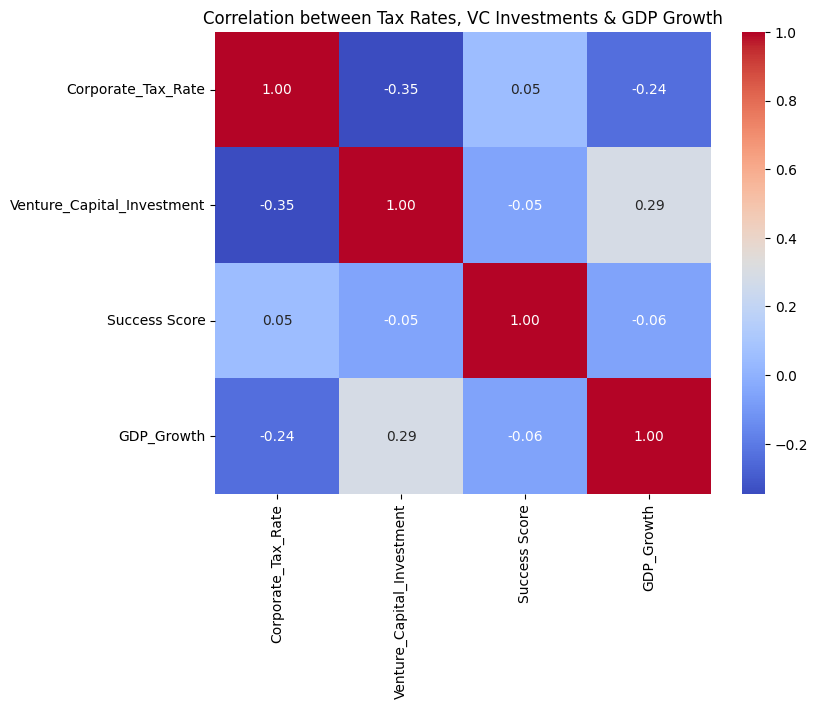

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns
correlation_df = df[["Corporate_Tax_Rate", "Venture_Capital_Investment", "Success Score", "GDP_Growth"]]

# Compute correlation matrix
correlation_matrix = correlation_df.corr()

# Visualize with heatmap
plt.figure(figsize=(8,6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation between Tax Rates, VC Investments & GDP Growth")
plt.show()

### Correlation Matrix Interpretation

To understand the linear relationships between the variables in our merged dataset, we computed a correlation matrix between:
- **Corporate Tax Rate**
- **Venture Capital Investment (VCI)**
- **Startup Success Score**
- **GDP Growth**

Key observations:
- **Corporate Tax Rate** is moderately **negatively correlated with VCI** (`r = -0.35`). This suggests that higher corporate taxes may discourage venture capital activity.
- **Corporate Tax Rate** is also moderately **negatively correlated with **GDP Growth** (`r = -0.24`), indicating that higher corporate taxes might slightly hinder economic growth.
- **VCI** and **GDP Growth** are moderately **negatively correlated (`r = -0.24`)
- The **Startup Success Score** seems largely uncorrelated with other variables in this dataset.

The results support the general economic intuition that higher corporate taxes can be a barrier to innovation and growth. Heavier tax burdens may deter venture capitalists, particularly in economies where startups already face profitability challenges. Since entrepreneurship and business creation are key engines of growth, this relationship helps explain why GDP growth is also negatively associated with higher tax rates.

The lack of correlation with Startup Success Score was unexpected. One explanation could be the nature of the variable: the success score is a subjective, discrete rating from 1 to 10, assigned differently across companies or evaluators. Moreover, the dataset was the most viable option available, given the limited public data on global startup performance.


In [ ]:
# Combined taxes and GDP growth datasets for plotting
taxes_GDP = pd.read_csv(policy2_path +"/CIT_GDP_Summary.csv")

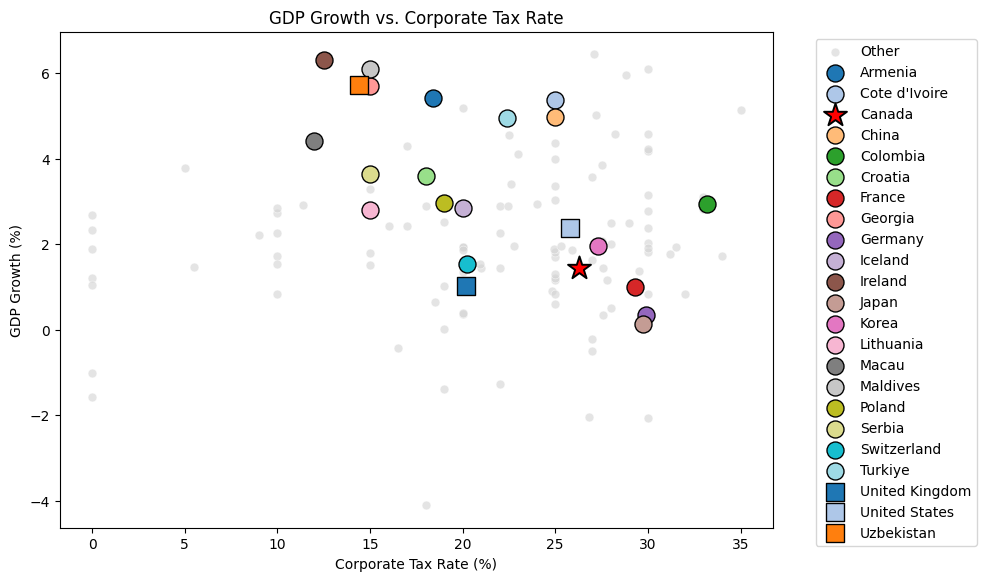

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# List of countries to highlight
highlight_countries = [
    "United States", "Canada", "China", "United Kingdom", "France", "Germany",
    "Japan", "Ireland", "Turkiye", "Maldives", "Uzbekistan", "Georgia",
    "Switzerland", "Colombia", "Armenia", "Korea", "Cote d'Ivoire", "Serbia",
    "Croatia", "Poland", "Iceland", "Lithuania", "Macau"
]

# Label others
taxes_GDP["category"] = taxes_GDP["Country"].apply(
    lambda x: x if x in highlight_countries else "Other"
)

# Prepare data
highlighted = taxes_GDP[taxes_GDP["Country"].isin(highlight_countries)]
other = taxes_GDP[~taxes_GDP["Country"].isin(highlight_countries)]

# Use seaborn palette to assign colors
palette = sns.color_palette("tab20", len(highlighted["Country"].unique()))
country_colors = dict(zip(highlighted["Country"].unique(), palette))

# Track used colors to avoid duplicates
used_colors = defaultdict(list)
marker_cycle = ['o', 's', 'D', 'P', '^', 'v', '<', '>']  # Default shape, fallback shapes

# Plot background (others)
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=other,
    x="CIT",
    y="GDP_Growth",
    color="lightgray",
    alpha=0.6,
    s=40,
    label="Other"
)

# Plot each highlighted country
for country in highlighted["Country"].unique():
    subset = highlighted[highlighted["Country"] == country]
    color = country_colors[country]

    # Count how many times a color has been used
    color_key = tuple(color)
    used_count = len(used_colors[color_key])

    # Choose marker based on usage of the color
    marker = marker_cycle[used_count] if used_count < len(marker_cycle) else 'X'
    used_colors[color_key].append(country)

    # Canada with red triangle
    if country == "Canada":
        sns.scatterplot(
            data=subset,
            x="CIT",
            y="GDP_Growth",
            color="red",
            marker="*",
            s=300,
            edgecolor="black",
            label="Canada"
        )
    else:
        sns.scatterplot(
            data=subset,
            x="CIT",
            y="GDP_Growth",
            color=color,
            marker=marker,
            s=150,
            edgecolor="black",
            label=country
        )

# Final touches
plt.title("GDP Growth vs. Corporate Tax Rate")
plt.xlabel("Corporate Tax Rate (%)")
plt.ylabel("GDP Growth (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### GDP Growth vs Corporate Tax Rate Interpretation

This scatter plot illustrates the relationship between GDP growth and corporate tax rates across countries. We can clearly observe the negative correlation identified in the earlier correlation matrix:

>Countries with higher corporate tax rates tend to exhibit weaker GDP growth.

One notable example is Ireland, which maintains a low corporate tax rate (12%) and demonstrates one of the highest GDP growth rates (over 6%) in the sample. On the other hand, Canada, marked with a red star, sits on the higher end of the tax spectrum (26%) but shows modest GDP growth (1.5%), reinforcing the inverse relationship.

This visual insight supports the hypothesis that reducing corporate tax rates could create a more favorable environment for economic expansion. While tax policy is only one of many factors affecting growth, the trend shown here suggests that Canada may benefit from reconsidering its corporate tax strategy to better stimulate innovation and competitiveness.

In [ ]:
# Group dataframe by Country & Year for Corporate Tax Rate vs Venture Capital Investment
df_tax_vci = df.groupby(['Country', 'Year']).agg({
    'Corporate_Tax_Rate': 'mean',
    'Venture_Capital_Investment': 'mean'
}).reset_index()

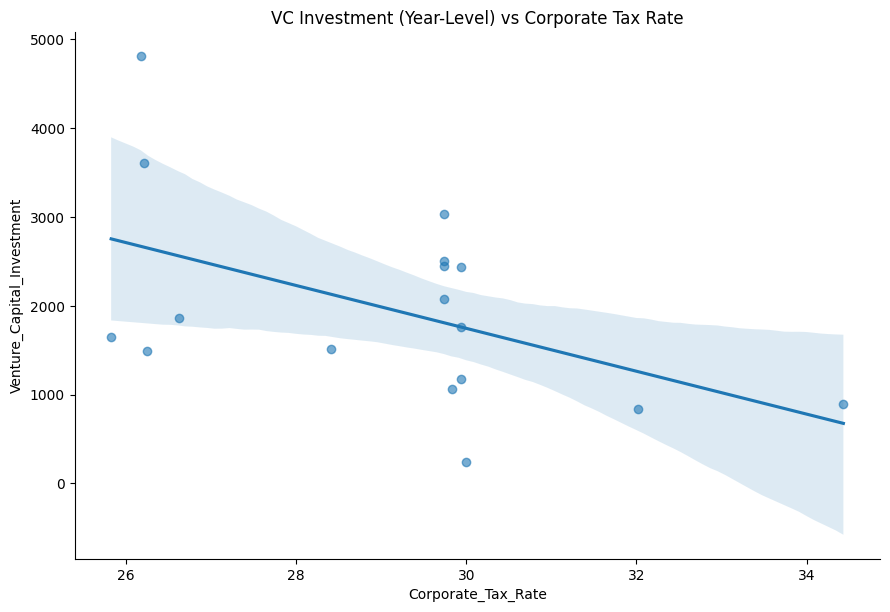

In [ ]:
# Corporate Tax Rate vs Venture Capital Investment plot
sns.lmplot(
    data=df_tax_vci,
    x="Corporate_Tax_Rate",
    y="Venture_Capital_Investment",
    height=6,
    aspect=1.5,
    scatter_kws={"alpha": 0.6}
)
plt.title("VC Investment (Year-Level) vs Corporate Tax Rate")
plt.show()

### VCI vs Corporate Tax Rate Interpretation

This regression plot explores the relationship between corporate tax rates and venture capital investment (VCI) across countries. The downward-sloping trendline confirms the negative correlation previously observed in the correlation matrix.

>Higher corporate tax rates are associated with lower levels of venture capital investment.

This makes intuitive sense: when companies face heavier tax burdens, they may have less capital available for innovation or expansion, making them less attractive to venture capitalists.

This visual reinforces the idea that lowering corporate taxes could stimulate greater venture capital activity, especially important for fostering innovation ecosystems. For Canada, currently sitting on the higher end of the tax spectrum, this insight suggests there is untapped potential in making the environment more VC-friendly.



### Statistical Testing: Do Tax Rates Significantly Affect GDP Growth and VC Investment?

To strengthen the validity of our insights, we performed statistical significance tests. First, we ran two independent t-tests to compare the means of GDP growth and venture capital investment between countries with low vs. high corporate tax rates, using the median tax rate as the threshold. This helps assess whether observed differences between the two groups are statistically significant.

Additionally, we calculated Pearson correlation coefficients along with p-values to measure the strength and significance of linear relationships between corporate tax rates and both GDP growth and venture capital investment. These tests allow us to go beyond visual patterns and validate whether the relationships are meaningful or could be due to random chance.

Very low p-values (≪ 0.05) from both tests indicate that the relationships we observed are statistically significant, adding confidence to our findings.

In [ ]:
from scipy.stats import ttest_ind, pearsonr

# Define threshold as the median tax rate
median_tax = df['Corporate_Tax_Rate'].median()

# Split into groups
low_tax = df[df['Corporate_Tax_Rate'] < median_tax]
high_tax = df[df['Corporate_Tax_Rate'] >= median_tax]

# T-test: GDP Growth
tstat_gdp, pval_gdp = ttest_ind(low_tax['GDP_Growth'], high_tax['GDP_Growth'], equal_var=False)

# T-test: Venture Capital Investment
tstat_vc, pval_vc = ttest_ind(low_tax['Venture_Capital_Investment'], high_tax['Venture_Capital_Investment'], equal_var=False)

print("T-Test Results:")
print(f"GDP Growth (Low vs. High Tax): t = {tstat_gdp:.2f}, p = {pval_gdp:.2e}")
print(f"VC Investment (Low vs. High Tax): t = {tstat_vc:.2f}, p = {pval_vc:.2e}")

T-Test Results:
GDP Growth (Low vs. High Tax): t = 10.11, p = 3.50e-23
VC Investment (Low vs. High Tax): t = 13.13, p = 2.01e-36


In [ ]:
# Pearson correlation significance
corr_gdp, p_gdp = pearsonr(df['Corporate_Tax_Rate'], df['GDP_Growth'])
corr_vc, p_vc = pearsonr(df['Corporate_Tax_Rate'], df['Venture_Capital_Investment'])

print("Correlation Significance Tests:")
print(f"Corporate Tax vs. GDP Growth: r = {corr_gdp:.2f}, p = {p_gdp:.2e}")
print(f"Corporate Tax vs. VC Investment: r = {corr_vc:.2f}, p = {p_vc:.2e}")

Correlation Significance Tests:
Corporate Tax vs. GDP Growth: r = -0.24, p = 3.91e-18
Corporate Tax vs. VC Investment: r = -0.35, p = 1.87e-37


### Interpretation of Statistical Tests

- **T-Test (GDP Growth)**: The difference in GDP growth between low-tax and high-tax countries was statistically significant (p <<< 0.05), indicating that corporate tax rate levels may play a role in economic performance.
- **T-Test (VC Investment)**: We also observed a significant difference in venture capital investment (p <<< 0.05) between low- and high-tax countries, supporting our earlier visual insight.

> Note : The large t-values obtained (10.1 for GDP growth, 13.1 for venture capital investment) indicate strong, statistically significant differences between the low-tax and high-tax country groups.

- **Pearson Correlation**:
  - Corporate Tax Rate and GDP Growth showed a **moderate negative correlation** (r ≈ -0.24, p <<< 0.05), confirming our heatmap result.
  - Corporate Tax Rate and VC Investment showed a **stronger negative correlation** (r ≈ -0.35, p <<< 0.05), reinforcing the hypothesis that lower taxes attract VC funding.
  
These findings strengthen our claim that corporate tax policy may impact innovation outcomes such as startup investment and broader economic growth.


## **3.4 Final Insights and Implications**

Overall, our analysis shows consistent trends:
- Lower corporate taxes are **associated with** higher venture capital investment and faster GDP growth.
- Canada’s tax rate places it in a **middle-performing tier**, behind more competitive innovation hubs.

These findings support the idea that **tax breaks could incentivize innovation**, but should be paired with broader innovation strategies (e.g., support for startups, R&D funding, talent attraction).

<a name="policy-3"></a>
# **4.0 Policy 3: Canada's Brain Drain**

In [ ]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import os
import scipy.stats as stats

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1.   **Definition:**
This policy consists of exploring why canada is losing its workforce and where they are going. The aim is to understand the factors and build a policy which will combat these factors in order to retain our people.
2.   **Data Sources**:
  - OECD migration data by country: [SOURCE](https://webfs.oecd.org/Els-com/Migration/Databases/Database%20on%20Immigrants%20in%20OECD%20and%20non-OECD%20Countries%20DIOC/DIOC%20database%20-%20click%20here/)
  - OECD yearly Housing Price by country: [SOURCE](https://data-explorer.oecd.org/vis?lc=en&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_AN_HOUSE_PRICES%40DF_HOUSE_PRICES&df[ag]=OECD.ECO.MPD&dq=.A.HPI_YDH%2BHPI_RPI%2BHPI_YDH_AVG%2BHPI_RPI_AVG%2BRPI.&lom=LASTNPERIODS&lo=20&to[TIME_PERIOD]=false&vw=tb)
  - OECD yearly Average Wage by country: [SOURCE](https://data-explorer.oecd.org/vis?lc=en&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_EARNINGS%40AV_AN_WAGE&df[ag]=OECD.ELS.SAE&dq=......&pd=2000%2C&to[TIME_PERIOD]=false&vw=tb)
  - OECD Unemployment Rate by country: [SOURCE](https://data-explorer.oecd.org/vis?df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_LFS%40DF_IALFS_INDIC&df[ag]=OECD.SDD.TPS&df[vs]=1.0&pd=1983%2C2024&dq=JPN%2BCHE%2BSWE%2BUSA%2BCAN.UNE_LF_M.PT_LF_SUB..Y._T.Y_GE25..A&ly[rw]=REF_AREA&ly[cl]=TIME_PERIOD&to[TIME_PERIOD]=false&vw=tl&lb=nm)
  - Stats Canada yearly emigration data: [SOURCE](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1710000801&pickMembers%5B0%5D=1.1&cubeTimeFrame.startYear=1998+%2F+1999&cubeTimeFrame.endYear=2023+%2F+2024&referencePeriods=19980101%2C20230101)





The migration datasets is from the OECD from 2020-2021 ([SOURCE](https://webfs.oecd.org/Els-com/Migration/Databases/Database%20on%20Immigrants%20in%20OECD%20and%20non-OECD%20Countries%20DIOC/DIOC%20database%20-%20click%20here/)). This is the provisional datset, so it need some cleaning, for example to map industries number to actual industries, cleaning some of the columns to rename the categories. It should be noted that OECD only collects data for individual who are 15+, thus we can confidently day most of the data are mostly about adults. All the files in the datasets countains 4 common columns:
- coub -> the country people are born in,
- country -> the country people are currently living in,
- edu_lfs -> education level of the people,
- number-> the amount of people

The 3 files we are interested in is the age data, the time of stay data and the industry data, each of which contains one extra column we are interested in. The age_data, contains the age of the labour force, the time_stay data contains the amount of time people have stayed in a country, and the industry data contains the industry people are in.

To clean the data, we first isolate for "coub" (the birth country) to canada since we are interested in knowing where canadian are leaving to. Each column values are then mapped to values which makes sense for our analysis.

<a name="policy-3-cleaning"></a>
## **4.1 Cleaning Migration Data**

In [ ]:
##Path
migration_dataset = os.path.join(main_path, policy3_path + "/migration_raw")

In [ ]:
age_data = pd.read_excel(os.path.join(migration_dataset, "t1_TOP100.xlsx"))
time_stay_data = pd.read_excel(os.path.join(migration_dataset, "t3_TOP100.xlsx"))
ind_data = pd.read_excel(os.path.join(migration_dataset, "t6_TOP100.xlsx"))

In [ ]:
print(age_data.columns.tolist())
print(time_stay_data.columns.tolist())
print(ind_data.columns.tolist())

['country', 'coub', 'sex', 'age_lfs', 'fborn', 'oecd', 'oecdb', 'edu_lfs', 'number']
['coub', 'sex', 'dos_cen', 'country', 'oecd', 'fborn', 'edu_lfs', 'oecdb', 'number']
['coub', 'sex', 'ind_2d', 'ind_1d', 'country', 'oecd', 'fborn', 'ind_oth', 'edu_lfs', 'oecdb', 'number']


In [ ]:
#mappings for specific columns
edu_lfs_mapping = {'ISCED 0/1/2':'low', 'ISCED 3/4':'med', 'ISCED 5/6/7/8':'high', 'Unknown':'unknown', '6':'high', '7':'high'} #high >=bachelors, med >=secondary + college, low = primary
stay_mapping = {'≤ 1 years': '0-1', '> 1 & ≤ 5 years': '1-5', '> 5 & ≤ 10 years':'5-10', '> 10 & ≤ 20 years': '10-20', '> 20 years': '20+',
                'zero to five years': '1-5', 'ten years or more':'10+', 'Unknown': 'unknown', 'five years or more': '5-10', 'native-born':'-1'}

#industry mappings
naics_mapping = pd.read_excel(os.path.join(migration_dataset, "migration_ind_can.xlsx"))
isic_mapping = pd.read_excel(os.path.join(migration_dataset, "migration_ind_isic.xlsx"))
naics_dict = dict(zip(naics_mapping['Code'], naics_mapping['Industry Classification']))
isic_dict = dict(zip(isic_mapping['Code'], isic_mapping['Industry Classification']))

def map_industry(row):
    if row['country'] in ['CAN', 'USA']:
        return naics_dict.get(row['ind_2d'], "Unknown")
    else:
        return isic_dict.get(row['ind_2d'], "Unknown")

In [ ]:
#simiplify industry mapping further:
industry_mapping = {
    # Agriculture and related
    'Agriculture, forestry, and fishing': 'Agriculture, forestry, fishing and hunting',
    'Agriculture, forestry, fishing and hunting': 'Agriculture, forestry, fishing and hunting',

    # Mining
    'Mining and extraction of energy-producing products': 'Mining, quarrying, and oil and gas extraction',
    'Mining and quarrying, non-energy producing products': 'Mining, quarrying, and oil and gas extraction',
    'Mining, quarrying, and oil and gas extraction': 'Mining, quarrying, and oil and gas extraction',

    # Utilities
    'Electricity, gas, steam, and air conditioning supply': 'Utilities',
    'Water collection, treatment, and supply': 'Utilities',
    'Sewerage': 'Utilities',
    'Waste collection, treatment, and disposal activities; materials recovery': 'Utilities',
    'Remediation activities and other waste management services': 'Utilities',

    # Construction
    'Construction': 'Construction',

    # Manufacturing
    'Manufacturing': 'Manufacturing',
    'Food products, beverages, and tobacco': 'Manufacturing',
    'Manufacture of tobacco products': 'Manufacturing',
    'Textiles, wearing apparel, leather, and related products': 'Manufacturing',
    'Wood and products of wood and cork': 'Manufacturing',
    'Paper products and printing': 'Manufacturing',
    'Coke and refined petroleum products': 'Manufacturing',
    'Rubber and plastic products': 'Manufacturing',
    'Basic metals': 'Manufacturing',
    'Computer, electronic, and optical products': 'Manufacturing',
    'Electrical equipment': 'Manufacturing',
    'Machinery and equipment n.e.c.': 'Manufacturing',
    'Motor vehicles, trailers, and semi-trailers': 'Manufacturing',
    'Other transport equipment': 'Manufacturing',
    'Furniture; other manufacturing': 'Manufacturing',
    'Repair and installation of machinery and equipment': 'Manufacturing',

    # Wholesale Trade
    'Wholesale trade, except of motor vehicles and motorcycles': 'Wholesale Trade',
    'Wholesale trade': 'Wholesale Trade',

    # Retail Trade
    'Retail trade, except of motor vehicles and motorcycles': 'Retail Trade',
    'Retail Trade': 'Retail Trade',

    # Transportation and Warehousing
    'Land transport and transport via pipelines': 'Transportation and Warehousing',
    'Water transport': 'Transportation and Warehousing',
    'Air transport': 'Transportation and Warehousing',
    'Warehousing and support activities for transportation': 'Transportation and Warehousing',
    'Transportation and Warehousing': 'Transportation and Warehousing',
    'Postal and courier activities': 'Transportation and Warehousing',

    # Information and cultural industries
    'Information and communication': 'Information and cultural industries',
    'Publishing activities': 'Information and cultural industries',
    'Motion picture, video, and television program production, sound recording, and music publishing activities': 'Information and cultural industries',
    'Programming and broadcasting activities': 'Information and cultural industries',
    'Telecommunications': 'Information and cultural industries',
    'Computer programming, consultancy, and related activities': 'Information and cultural industries',
    'Information and cultural industries': 'Information and cultural industries',

    # Finance and insurance
    'Financial service activities, except insurance and pension funding': 'Finance and insurance',
    'Insurance, reinsurance, and pension funding, except compulsory social security': 'Finance and insurance',
    'Activities auxiliary to financial services and insurance activities': 'Finance and insurance',
    'Finance and insurance': 'Finance and insurance',

    # Real Estate and Rental and Leasing
    'Real estate activities': 'Real Estate and Rental and Leasing',
    'Real Estate and Rental and Leasing': 'Real Estate and Rental and Leasing',

    # Professional, Scientific, and Technical Services
    'Professional, scientific, and technical activities': 'Professional, Scientific, and Technical Services',
    'Scientific research and development': 'Professional, Scientific, and Technical Services',
    'Veterinary activities': 'Professional, Scientific, and Technical Services',
    'Legal and accounting activities': 'Professional, Scientific, and Technical Services',
    'Activities of head offices; management consultancy activities': 'Professional, Scientific, and Technical Services',
    'Professional, Scientific, and Technical Services': 'Professional, Scientific, and Technical Services',

    # Administrative and Support
    'Administrative and support service activities': 'Administrative and Support and Waste Management and Remediation Services',
    'Office administrative, office support, and other business support activities': 'Administrative and Support and Waste Management and Remediation Services',
    'Administrative and Support and Waste Management and Remediation Services': 'Administrative and Support and Waste Management and Remediation Services',

    # Educational services
    'Education': 'Educational services',
    'Educational services': 'Educational services',

    # Health care and social assistance
    'Human health and social work activities': 'Health care and social assistance',
    'Health care and social assistance': 'Health care and social assistance',

    # Arts, Entertainment, and Recreation
    'Arts, entertainment, and recreation': 'Arts, Entertainment, and Recreation',
    'Creative, arts, and entertainment activities': 'Arts, Entertainment, and Recreation',
    'Gambling and betting activities': 'Arts, Entertainment, and Recreation',
    'Libraries, archives, museums, and other cultural activities': 'Arts, Entertainment, and Recreation',
    'Arts, Entertainment, and Recreation': 'Arts, Entertainment, and Recreation',

    # Accommodation and food services
    'Food and beverage service activities': 'Accommodation and food services',
    'Accommodation': 'Accommodation and food services',
    'Accommodation and food services': 'Accommodation and food services',

    # Other Services
    'Other service activities': 'Other Services (except Public Administration)',
    'Other personal service activities': 'Other Services (except Public Administration)',
    'Other Services (except Public Administration)': 'Other Services (except Public Administration)',

    # Public administration
    'Public administration and defense; compulsory social security': 'Public administration',
    'Public administration': 'Public administration',

    # Management of companies
    'Management of companies and enterprises': 'Management of companies and enterprises',

    # Default for unmapped or missing
    None: 'Unknown',
    'Unknown': 'Unknown'
}


In [ ]:
#filtering for only people that are canadian born
age_data = age_data[age_data['coub'] == "CAN"]
time_stay_data = time_stay_data[time_stay_data['coub'] == "CAN"]
ind_data = ind_data[ind_data['coub'] == "CAN"]

time_stay_data.loc[:, 'dos_cen'] = time_stay_data['dos_cen'].map(stay_mapping)
ind_data.loc[:, 'mapped_industry'] = ind_data.apply(map_industry, axis=1)

<ipython-input-8-c0de6ff01a2e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ind_data.loc[:, 'mapped_industry'] = ind_data.apply(map_industry, axis=1)


In [ ]:
age_data.loc[:, 'edu_lfs'] = age_data['edu_lfs'].map(edu_lfs_mapping)
time_stay_data.loc[:, 'edu_lfs'] = time_stay_data['edu_lfs'].map(edu_lfs_mapping)
ind_data.loc[:, 'edu_lfs'] = ind_data['edu_lfs'].map(edu_lfs_mapping)
ind_data.loc[:, 'mapped_industry'] = ind_data['mapped_industry'].map(industry_mapping)

In [ ]:
print(age_data['age_lfs'].unique())
print(time_stay_data['dos_cen'].unique())
print(ind_data['mapped_industry'].unique())
print(age_data['edu_lfs'].unique())
print(time_stay_data['edu_lfs'].unique())

['15-24' '25-64' '65+']
['-1' '0-1' '1-5' '5-10' '10-20' '20+' '10+' 'unknown']
['Utilities' 'Construction' 'Wholesale Trade'
 'Transportation and Warehousing' 'Accommodation and food services'
 'Health care and social assistance' 'Arts, Entertainment, and Recreation'
 'Other Services (except Public Administration)' nan
 'Agriculture, forestry, fishing and hunting'
 'Mining, quarrying, and oil and gas extraction' 'Manufacturing'
 'Retail Trade' 'Information and cultural industries'
 'Finance and insurance'
 'Professional, Scientific, and Technical Services'
 'Real Estate and Rental and Leasing'
 'Administrative and Support and Waste Management and Remediation Services'
 'Public administration' 'Educational services'
 'Management of companies and enterprises' 'Unknown']
['low' 'med' 'high' 'unknown']
['low' 'med' 'high' 'unknown']


In [ ]:
age_group = age_data.groupby(['country', 'age_lfs', 'edu_lfs'])['number'].sum()
stay_group = time_stay_data.groupby(['country', 'dos_cen', 'edu_lfs'])['number'].sum()
ind_group = ind_data.groupby(['country', 'mapped_industry', 'edu_lfs'])['number'].sum()

age_group.to_csv(os.path.join(main_path, "migration_age_group.csv"))
stay_group.to_csv(os.path.join(main_path, "migration_stay_length_group.csv"))
ind_group.to_csv(os.path.join(main_path, "migration_industry_group.csv"))

In [ ]:
age_group = age_group.reset_index()
stay_group = stay_group.reset_index()
ind_group = ind_group.reset_index()

In [ ]:
age_USA = age_group[age_group['country'] != 'CAN']
stay_USA = stay_group[stay_group['country'] != 'CAN']
ind_USA = ind_group[ind_group['country'] != 'CAN']

print(age_USA['number'].sum())
print(stay_USA['number'].sum())
print(ind_USA['number'].sum()) # the number here is lower than in the stay group but that's ok because a lot of poeple are older, so they might not be working anymore

1078744.9198656082
1060707.9259324074
584280.5100290775


Some notes:
- The number in the age dataset and the time of stay dataset are about the same, but different in the industry dataset. This is expected since there are people who have reached the retirement age.
- This OECD migration dataset is only looking at people that are canadian born not those that are canadian citizen.

<a name="policy-3-analysis"></a>
## **4.2 Quick Migration Data Analysis**

The OECD migration dataset contains a lot of interesting information, so we want to look at some of the distribution using this data. Mainly we will look at which industries Canadian Born people are working in the US, and we will look at how long these Canadian Born people are staying in the US. We isolated for the US specifically, since based on the OECD dataset, 86% of Canadian living abroad are living in the US.

In [ ]:
migration_age = pd.read_csv(os.path.join(main_path, "policy3_dataset/migration_age_group.csv"))
migration_stay = pd.read_csv(os.path.join(main_path, "policy3_dataset/migration_stay_length_group.csv"))
migration_ind = pd.read_csv(os.path.join(main_path, "policy3_dataset/migration_industry_group.csv"))

Looking at all the canadians living abroad, we find that 86 % of canadian living abroad are living in the USA.

In [ ]:
migration_stay_group = migration_stay.groupby(['country'])['number'].sum().reset_index()
migration_stay_group = migration_stay_group[migration_stay_group['country'] != 'CAN']
migration_stay_group = migration_stay_group.sort_values(by='number', ascending=False)
can_abroad = migration_stay_group['number'].sum()
migration_stay_group['%_of_Abroad'] = (migration_stay_group['number'] / migration_stay_group['number'].sum())*100
migration_stay_group

,country,number,%_of_Abroad
19,USA,916071.000000,86.364114
0,AUS,46528.000000,4.386504
9,ITA,23112.000000,2.178922
6,FRA,22782.566914,2.147864
7,GRC,11926.000000,1.124343
2,CHE,11346.359018,1.069697
15,PRT,6958.000000,0.655977
5,ESP,6847.000000,0.645512
18,SWE,3855.000000,0.363437
13,NOR,3152.000000,0.297160


In [ ]:
migration_ind['percent_can'] = (migration_ind['number'] / can_abroad)*100
migration_stay['percent_can'] = (migration_stay['number'] / can_abroad)*100
ind = migration_ind[migration_ind['country'] == 'USA']
stay = migration_stay[migration_stay['country'] == 'USA']
ind = ind.sort_values(by='percent_can', ascending=False)


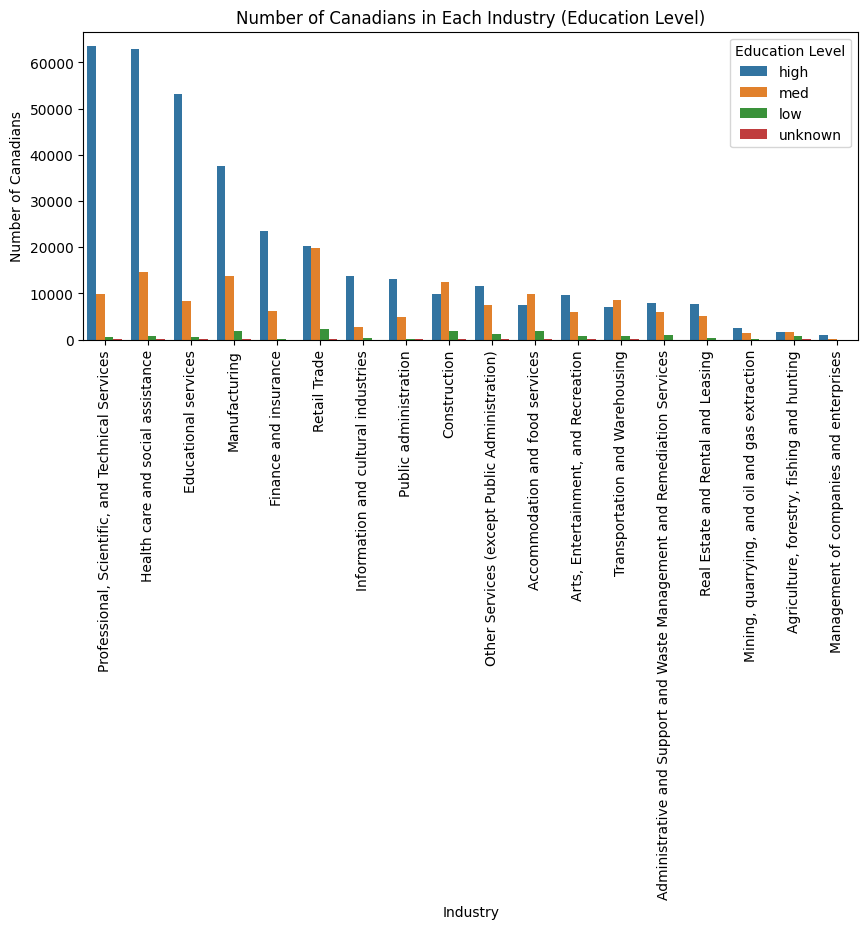

In [ ]:
#looking at what industry canadian are working in the US
plt.figure(figsize=(10, 4))
sns.barplot(x='mapped_industry', y='number', hue='edu_lfs', data=ind)
plt.xticks(rotation=90)
plt.title('Number of Canadians in Each Industry (Education Level)')
plt.xlabel('Industry')
plt.ylabel('Number of Canadians')
plt.legend(title='Education Level')
plt.show()


Interpretation: Looking at all the Canadians borns living in the USA, the top 5 industries they are working in are Professional/Scientific/Technical Services, Health care associations, Educational Services, Manufacturing, and Financial Services. These industries are also mainly dominated by people with post-secondary education.

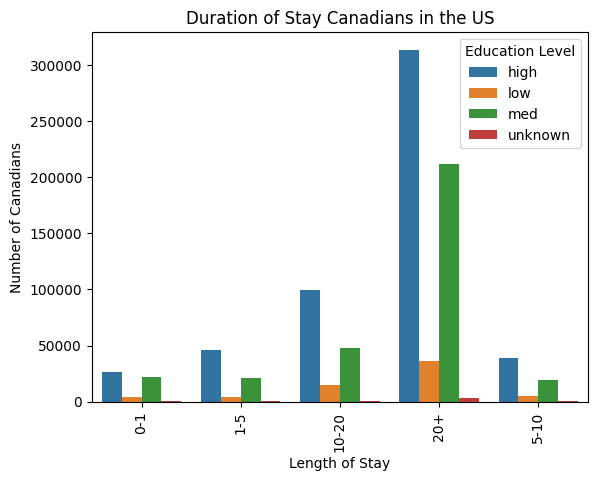

In [ ]:
#Looking at how long candians are staying in the US
plt.figure()
sns.barplot(x='dos_cen', y='number', hue='edu_lfs', data=stay)
plt.xticks(rotation=90)
plt.title('Duration of Stay Canadians in the US')
plt.xlabel('Length of Stay')
plt.ylabel('Number of Canadians')
#plt.ylabel('%Canadians Living Abroad')
plt.legend(title='Education Level')
plt.show()


Interpretation: A lot of Canadians who are going to the USA remains there. This is evident by the 300,000 canadian born people with post secondary education who are still in the USA for 20+ years. These are people who emigrated in the before 2000.

<a name = 'policy3-cm'></a>
## **4.3 Correlation Matrix of Emigration and Factors Affecting Emigration**

We hypothesize that the factors contributing to emigration are unemployment rate, avgerage wage converted to USD, housing price and personal income tax rate. Emigration usually lag behind changes in factors affecting it by 1-2 years, thus, we correlate the OECD emigration data from 2020-2021 to values of housing price, wage, tax and unemployment from 2019. Since we are only looking at factors from 2019, we filter our emigration data for people who have been Abroad for 0-5 years only. We then build a correlation matrix based on these factors and the amount of people living abroad to see if a correlation does indeed exists.

In [ ]:
migration_age = pd.read_csv(os.path.join(main_path, policy3_path +"/migration_age_group.csv"))
migration_stay = pd.read_csv(os.path.join(main_path, policy3_path +"/migration_stay_length_group.csv"))
migration_ind = pd.read_csv(os.path.join(main_path, policy3_path +"/migration_industry_group.csv"))
housing_price = pd.read_csv(os.path.join(main_path, policy3_path +"/house pricing indicators.csv"))
unemployment = pd.read_csv(os.path.join(main_path, policy3_path +"/unemployment rates 2019_2024.csv"))
tax = pd.read_excel(os.path.join(main_path, policy3_path +"/tax_rate_bad.xlsx"))
tax = tax.drop(columns=['Previous', "Reference", "Unit"])
avg_wage = pd.read_csv(os.path.join(main_path, policy3_path +"/avg_wage_OECD.csv"))

In [ ]:
def plotScatterCoer (df, x_col, y_col, x_label="", y_label="", title=""):
  plt.figure()
  scatter_plot = sns.scatterplot(x=x_col, y=y_col, data=df)

  # Annotate the top 20 countries by 'number'
  top_20 = df.nlargest(10, 'number')
  for _, row in top_20.iterrows():
    plt.annotate(row['country'], (row[x_col], row[y_col]), fontsize=8)

  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.title(title)
  plt.show()

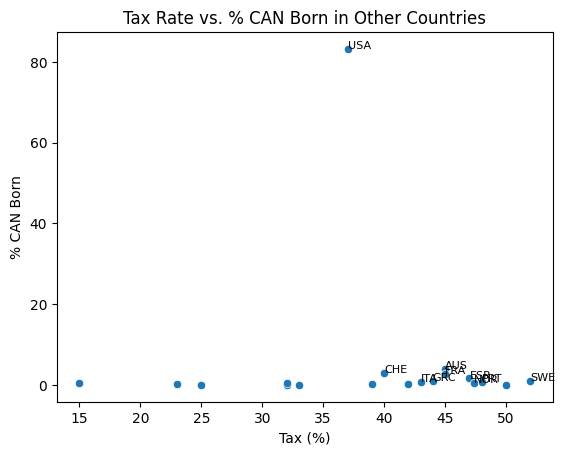

In [ ]:
migration_stay = migration_stay[(migration_stay['dos_cen'] == '0-1') | (migration_stay['dos_cen'] == '1-5')] #only choosing those that were been in the country 1-5 years because they will be more affected by recent changes
all_can_abroad = migration_stay['number'].sum()

country_amount = (migration_stay.groupby(["country"])["number"].sum()).reset_index()
merge_df = pd.merge(country_amount, tax, how="left", left_on='country', right_on="OECD")

merge_df["percent_can"] = (merge_df['number'] / all_can_abroad )*100 #getting percentage of all canadian abroad
merge_df["percent_us"] = (merge_df['number']/ merge_df[merge_df['country'] == 'USA']['number'].values[0])*100

merge_df = merge_df[merge_df['country'] != 'CAN'] #isolating for countries beside Canada
#merge_df = merge_df[merge_df['country'] != 'USA']
plotScatterCoer(merge_df, 'Last', 'percent_can', 'Tax (%)', '% CAN Born', "Tax Rate vs. % CAN Born in Other Countries")


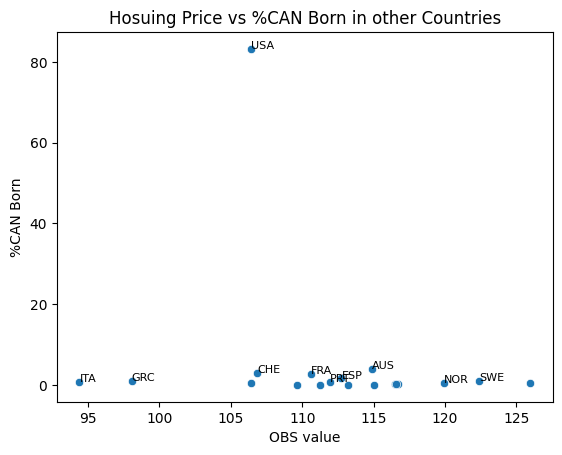

In [ ]:
housing_price = housing_price[["TIME_PERIOD", "OBS_VALUE", "REF_AREA"]]
hp = housing_price.copy()
hp = hp[hp["TIME_PERIOD"] == 2019]
hp = (hp.groupby(["REF_AREA"])["OBS_VALUE"].mean()).reset_index()

md = merge_df.copy()
md = pd.merge(md, hp, how="left", left_on='country', right_on="REF_AREA")

plotScatterCoer(md, 'OBS_VALUE', "percent_can", "OBS value", "%CAN Born", "Hosuing Price vs %CAN Born in other Countries")

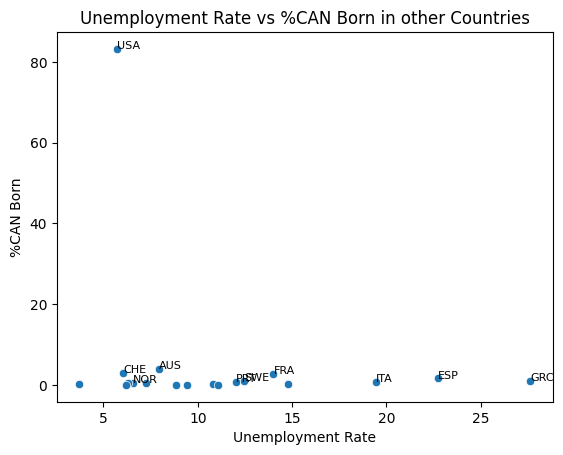

In [ ]:
unemployment = unemployment[["TIME_PERIOD", "OBS_VALUE", "REF_AREA", "AGE"]]
un_df = unemployment.copy()
un_df = un_df.rename(columns={'OBS_VALUE': "unemployment_rate"})
un_df = un_df[un_df["TIME_PERIOD"] == 2019]
unemployment_group = (un_df.groupby(["REF_AREA"])["unemployment_rate"].mean()).reset_index()

md3 = md.copy()
md3 = pd.merge(md3, unemployment_group, how="left", left_on='country', right_on="REF_AREA")
plotScatterCoer(md3, 'unemployment_rate', "percent_can", "Unemployment Rate", "%CAN Born", "Unemployment Rate vs %CAN Born in other Countries")

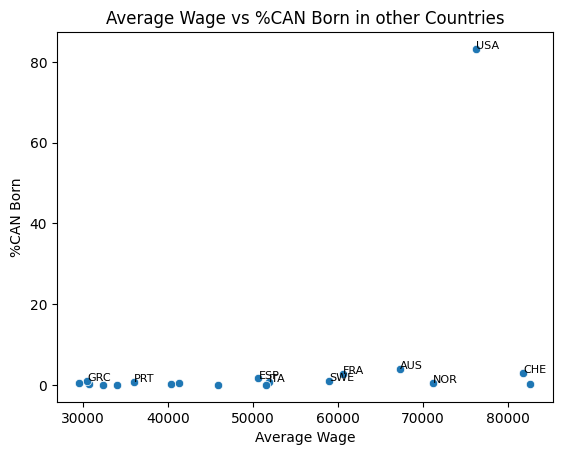

In [ ]:
avg_wage = avg_wage[["TIME_PERIOD", "UNIT_MEASURE", "REF_AREA", "OBS_VALUE"]]
wage = avg_wage.copy()

wage = wage[wage["TIME_PERIOD"] == 2019]
wage = wage[wage["UNIT_MEASURE"] == "USD_PPP"]
wage = (wage.groupby(["REF_AREA"])["OBS_VALUE"].mean()).reset_index()
wage = wage.rename(columns={'OBS_VALUE': "avg_wage"})
md4 = md3.copy()
md4 = pd.merge(md4, wage, how="left", left_on='country', right_on="REF_AREA")
plotScatterCoer(md4, 'avg_wage', "percent_can", "Average Wage", "%CAN Born", "Average Wage vs %CAN Born in other Countries")

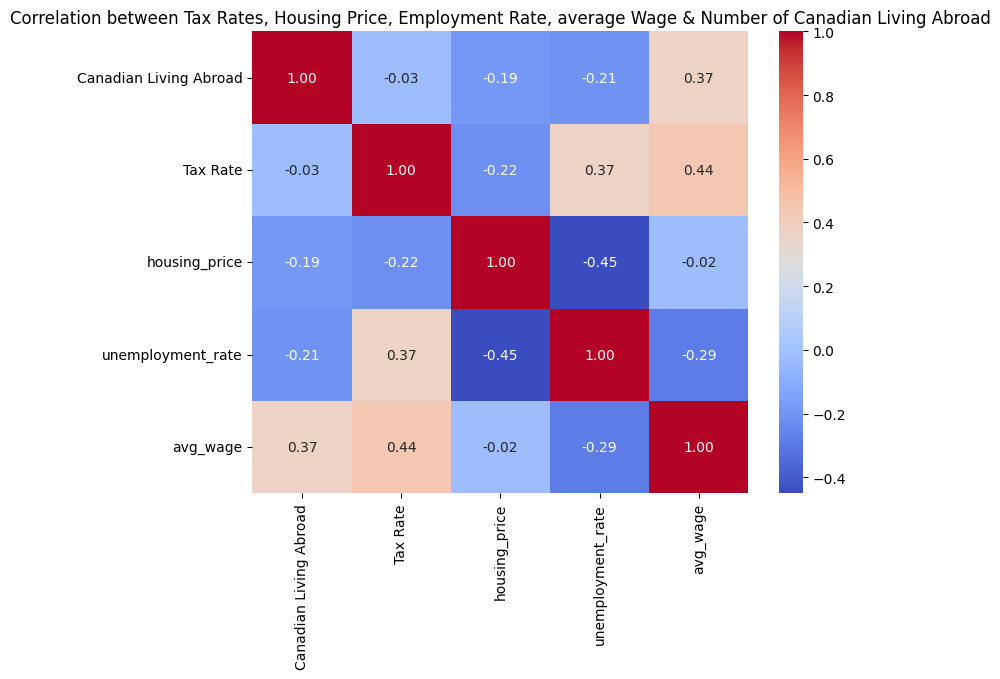

In [ ]:
corr_df = md4.copy()
corr_df = corr_df[['number', 'Last', 'OBS_VALUE', 'unemployment_rate', 'avg_wage']]
corr_df = corr_df.rename(columns={'OBS_VALUE': "housing_price", "Last": "Tax Rate", "number":"Canadian Living Abroad"})

# Compute correlation matrix
correlation_matrix = corr_df.corr()

# Visualize with heatmap
plt.figure(figsize=(8,6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation between Tax Rates, Housing Price, Employment Rate, average Wage & Number of Canadian Living Abroad")
plt.show()

Interpretation: From the correlation matrix we notice that there is a negative correlation between Canadians living abroad and unemployment rate and housing price. This indicates that higher housing price and higher unemployment rate leads to higher number of Canadians living abroad. We also see that the amount of Canadian living abroad is positively correlated with average wage, indicating that the higher the wage offered abroad, the more Canadian will immigrate there. However, the tax rate of the countries has barely any correlation with emigrants and is thus not a significant factor affecting people's decision.

Adidtionally, we also see some factors interacting with each other. Higher tax rate is positively correlated with unemployment rate and average wage, but negatively correlated with housing price. We also see housing price being negatively correlated with unemployment rate, tax rate.

<a name='policy3-sre'></a>
## **4.4 Simple Regression of Factors Affecting Emigration**

From the correlation matrix above, we know factors to investigate are housing price, average wage and unemployment rate. Using Stats Canada information on emigrants ([SOURCE](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1710000801&pickMembers%5B0%5D=1.1&cubeTimeFrame.startYear=1998+%2F+1999&cubeTimeFrame.endYear=2023+%2F+2024&referencePeriods=19980101%2C20230101)) we can draw relationships between emigrants from Canada and the factors values in Canada.

Since 86% of Canadian living abroad are living in the USA, we compare the values of housing, wage and unemployment to those of the USA, in the form of a ratio (Canada/USA). This ratio represents how Canada compares to the USA. A ratio > 1 means Canadian Values are higher than USA, while a ratio < 1 means the values are less than the USA.

Similar to the previous part, we say that emigration lags behind changes in factors by 1-2 years. Thus we analyse the relationship between emigration to housing price, average wage and unemploymnet from 2 year prior.

In [ ]:
emigrant = pd.read_excel(os.path.join(main_path, policy3_path +"/emigrants.xlsx"))
housing = pd.read_csv(os.path.join(main_path, policy3_path +"/house pricing indicators.csv"))
avg_wage = pd.read_csv(os.path.join(main_path, policy3_path +"/avg_wage_OECD.csv"))
unemployment = pd.read_csv(os.path.join(main_path, policy3_path +"/unempployment_all.csv"))

In [ ]:
def cleanLR (data, time=2001, wage=False, name=""):
  '''
  cleaning  the data to set up for the simple regression later

  '''
  data = data.copy()
  data = data[data['TIME_PERIOD'] > time]
  if wage:
    data = data[data['UNIT_MEASURE'] == 'USD_PPP']

  data_us = data[data['REF_AREA'] == 'USA']
  data_can = data[data['REF_AREA'] == 'CAN']
  data_us = (data_us.groupby(['TIME_PERIOD'])[['OBS_VALUE']].mean()).reset_index()
  data_can = (data_can.groupby(['TIME_PERIOD'])[['OBS_VALUE']].mean()).reset_index()
  data_lr = pd.merge(data_us, data_can, how="left", left_on='TIME_PERIOD', right_on="TIME_PERIOD", suffixes=("_us", "_can")).reset_index()
  data_lr["OBS_VALUE_RATIO"] = data_lr["OBS_VALUE_can"] / data_lr["OBS_VALUE_us"]
  data_lr = data_lr.drop(columns=['OBS_VALUE_us'])

  #data_lr = (data.groupby(['TIME_PERIOD'])[['OBS_VALUE_RATIO', 'OBS_VALUE']].mean()).reset_index()
  data_lr = data_lr.rename(columns={'OBS_VALUE_RATIO': f"{name}_ratio", 'OBS_VALUE_can':name})
  data_lr['year_plus_1'] = data_lr['TIME_PERIOD'] + 1
  data_lr['year_plus_2'] = data_lr['TIME_PERIOD'] + 2
  return data_lr


In [ ]:
housing_lr = cleanLR(housing, 2001, False, "housing_price")
wage_lr = cleanLR(avg_wage, 2001, True, "avg_wage")
unemployment_lr = cleanLR(unemployment, 2001, False, "unemployment_rate")
emigrant = emigrant[emigrant["Year"] > 2004]

In [ ]:
merge_df = pd.merge(emigrant, housing_lr, how="left", left_on='Year', right_on="year_plus_1")
merge_df = pd.merge(merge_df, wage_lr, how="left", left_on="Year", right_on='year_plus_1')
merge_df = pd.merge(merge_df, unemployment_lr, how="left", left_on="Year", right_on='year_plus_1')
merge_df = merge_df[['Year', "year_plus_1_x", 'emigrant', 'net_emigrant', 'returning_emigrant', 'housing_price', 'avg_wage', 'unemployment_rate', "housing_price_ratio", 'avg_wage_ratio', 'unemployment_rate_ratio']]
merge_df = merge_df.dropna()
#print(merge_df.head())

In [ ]:
def plotScatter (df, y_col, x_col, y_label="", x_label="", title=""):
  slope, intercept, r_value, p_value, std_err = stats.linregress(df[x_col], df[y_col])
  r_squared = r_value**2

  plt.figure()
  scatter_plot = sns.regplot(x=x_col, y=y_col, data=df)
  plt.text(0.1, 0.9, f"R^2 = {r_squared:.3f}, p = {p_value:.3f}",
           transform=plt.gca().transAxes)
  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.title(title)
  plt.grid()
  plt.show()

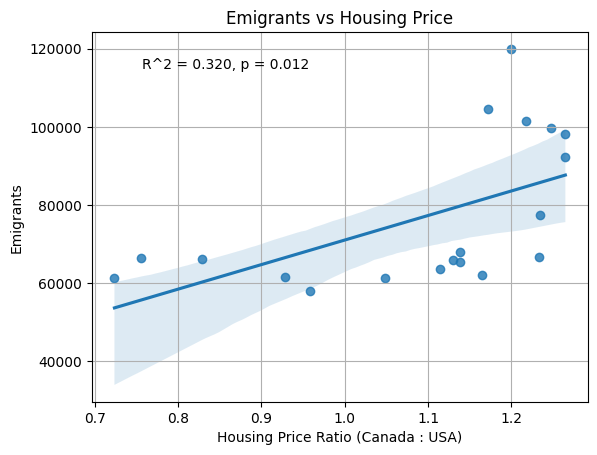

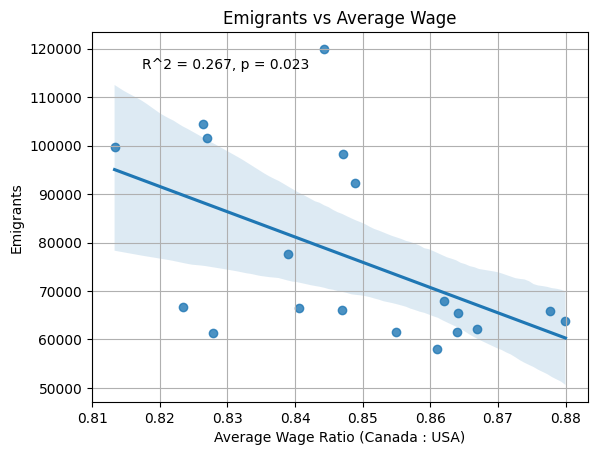

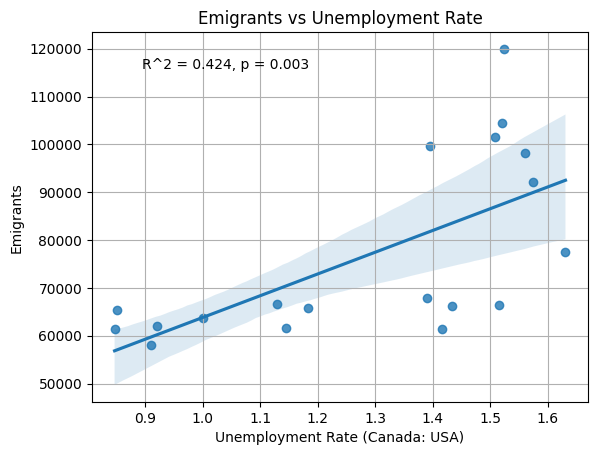

In [ ]:
plotScatter(merge_df, "emigrant", "housing_price_ratio", "Emigrants", "Housing Price Ratio (Canada : USA)", "Emigrants vs Housing Price")
plotScatter(merge_df, "emigrant", "avg_wage_ratio", "Emigrants", "Average Wage Ratio (Canada : USA)", "Emigrants vs Average Wage")
plotScatter(merge_df, "emigrant", "unemployment_rate_ratio", "Emigrants", "Unemployment Rate (Canada: USA)", "Emigrants vs Unemployment Rate")

Interpretation:
We say that the null hypothesis is that non of the factors have any effect on emigration, and the alternative hypothesis is that they have a non-negligible effect on emigration
- In the emigrant VS housing price we see a positive correlation and a P-value of 0.01, which indicates that when the housing price in Canada are higher in Canada than in the US, emmigrants increases
- Similarly in the emigrant vs unemployment graph we see a similar effect, where higher unemployment rate compared to the US leads to higher emigration. With a p-value of 0.003, it indicates that this relationship is even more significant in unemployment rate than in housing price
- Lastly in the emigrants vs average wage, we see than negative correlation, where as the average wage in Canada approaches that of the USA, the number of emigrant decreases.

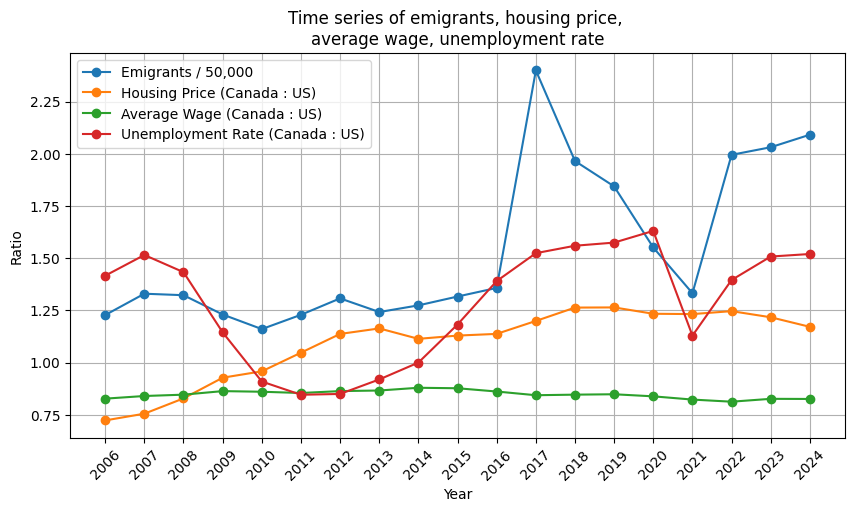

In [ ]:
import matplotlib.dates as mdates
merge_df['Year'] = merge_df['Year'].astype(int)
merge_df['Year'] = pd.to_datetime(merge_df['Year'], format='%Y')

plt.figure(figsize=(10,5))
plt.plot (merge_df['Year'], merge_df['emigrant']/5e4, label="Emigrants / 50,000", marker='o')
plt.plot (merge_df['Year'], merge_df['housing_price_ratio'], label="Housing Price (Canada : US)", marker='o')
plt.plot (merge_df['Year'], merge_df['avg_wage_ratio'], label="Average Wage (Canada : US)", marker='o')
plt.plot (merge_df['Year'], merge_df['unemployment_rate_ratio'], label="Unemployment Rate (Canada : US)", marker='o')
plt.ylabel ("Ratio")
plt.xlabel("Year")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format as years ('%Y')
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.xticks(rotation=45)
plt.title("Time series of emigrants, housing price, \naverage wage, unemployment rate")
plt.legend()
plt.grid(True)
plt.show()

Interpretation: On average the canadian housing is higher than in the US, and so is the unemploymnet rate, with both these factors showing an upward trend. The average canadian wage continues to be lower than the US and shows no intention of increase, an even has a slight downwards trend. The emigration on the other shows an upward trend, with the amounts of emigrant exploding from 2015 to 2024 (with the covid years having the expected lower values of emigration due to travel limitation). With the current trend of higher unemployment rate, higher housing price and lower wages, we can expect the emigration to continue increasing and canada to continue having a brain drain issue.

Additonal Notes:
- It would be good to build a linear regression between emigrants and the factors for prediction purposes, but with the limited data points we were able to find (19 data points), a linear regression will most likely be overfitted and hard to tune
- This section presents a resoning behing canada's brain drain. Most of Canadian's are leaving for the USA, thus, the goal to prevent Canadian brain drain is to present them with similar hopes as the USA.

<a name="policy-4"></a>
# **5.0 Policy 4 : Analysis of Energy Consumption and Innovation Linkages (G7+ China, Israel and South Korea)**

This notebook analyzes the relationship between energy consumption and various indicators of national innovation (patents, R&D expenditure, scientific output). It performs:

1.  **Data Collection:** Fetches relevant indicators from World Bank APIs for countries of analysis.
2.  **Exploratory Data Analysis (EDA):** Visualizes trends and compares countries.
3.  **Correlation Analysis:** Examines relationships between energy and innovation metrics, focusing on Canada.
4.  **Comparative Analysis:** Compares Canada's performance against the United States.
5.  **Regression Modeling:** Models the statistical relationship between electricity consumption and innovation in Canada. (simple and multivariate)
6.  **Policy Simulation:** Projects potential impacts of different energy policy scenarios on Canadian innovation and estimates related economic effects.

**Policy Notebook Structure:**
1.  Setup & Configuration
2.  Data Collection Classes & Execution
3.  Helper Function Definitions
4.  Data Loading & Preparation
5.  Exploratory Data Analysis (G7+China)
-   5a.  Composite Innovation Index
6.  Simple Correlation Analysis
7.  Multivariate Regression Analysis
8.  Canada Deep Dive & US Comparison (Gaps)
9.  Policy Simulation (Canada)
10.  Limitations



In [ ]:
#Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.stattools import grangercausalitytests
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.holtwinters import Holt
from pathlib import Path
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from typing import List, Dict, Tuple, Optional, Union, Callable
import warnings
warnings.filterwarnings("ignore")

from scipy import stats
import requests
import io
import os
import time
import datetime
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry
import types
import traceback
from google.colab import drive

In [ ]:
#mounting drive & directory config
drive.mount('/content/drive')
#base_dir = Path('/content/drive/MyDrive/MIE1624 Group Project/Group Project')
base_dir = Path(policy4_path)
#cache_dir = base_dir / "worldbank_data"
cache_dir = base_dir
output_dir = base_dir / "energy_output"
cache_dir.mkdir(exist_ok=True)
output_dir.mkdir(exist_ok=True)

plt.style.use('fivethirtyeight')
sns.set_palette("viridis")
plt.rcParams.update({
    'figure.figsize': (12, 8),
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12
})

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<a name="policy-4-cleaning"></a>
## **5.1 Data Collection**

### Analysis Helper Functions

In [ ]:
#Data Loading and Validation Functions
print("-- Data Loading & Validation Functions --")
def load_data(filename: str) -> pd.DataFrame:
    """Loads data from cache, handling dates and validation."""
    filepath = cache_dir / filename
    if not filepath.exists():
        raise FileNotFoundError(f"Data file not found in cache: {filepath}")
    try:
        df = pd.read_csv(filepath)
        if 'REF_DATE' in df.columns:
            df['REF_DATE'] = pd.to_datetime(df['REF_DATE'], errors='coerce')
            original_len = len(df)
            df = df.dropna(subset=['REF_DATE'])
            if len(df) < original_len:
                print(f"Warning: Dropped {original_len - len(df)} rows from {filename} due to invalid dates.")
        if 'VALUE' not in df.columns:
            raise ValueError(f"File {filename} is missing the required 'VALUE' column")
        missing_values = df['VALUE'].isna().sum()
        if missing_values > 0:
            warnings.warn(f"File {filename} contains {missing_values} missing 'VALUE' entries.")
        df['VALUE'] = pd.to_numeric(df['VALUE'], errors='coerce')
        df = df.dropna(subset=['VALUE'])
        return df
    except Exception as e:
        print(f"Error loading data from {filepath}: {e}")
        raise

def validate_date_range(df: pd.DataFrame, min_year: int = 1960, max_year: int = datetime.datetime.now().year) -> bool:
    """Checks if the DataFrame's date range is reasonable."""
    if 'REF_DATE' not in df.columns or df['REF_DATE'].isnull().all():
        return False
    try:
        years = df['REF_DATE'].dt.year
        return (years.min() <= max_year) and (years.max() >= min_year)
    except:
        return False

def check_stationarity(series: pd.Series, series_name: str, significance_level=0.05):
    """Performs ADF test and prints results."""
    if series is None or series.empty:
        print(f"Cannot test stationarity for '{series_name}': Series is empty or None.")
        return False, np.nan

    series_clean = pd.to_numeric(series, errors='coerce').dropna()
    if len(series_clean) < 10:
        print(f"Cannot test stationarity for '{series_name}': Too few non-NaN observations ({len(series_clean)}).")
        return False, np.nan

    try:
        result = adfuller(series_clean)
        p_value = result[1]
        is_stationary = p_value < significance_level
        print(f"ADF Test for '{series_name}':")
        print(f"  Test Statistic: {result[0]:.4f}")
        print(f"  P-value: {p_value:.4f}")
        print(f"  Result: {'Likely Stationary' if is_stationary else 'Likely Non-Stationary'} (at alpha={significance_level})")
        return is_stationary, p_value
    except Exception as e:
        print(f"Error running ADF test for '{series_name}': {e}")
        return False, np.nan

def convert_pct_gdp_to_value(pct_gdp_df: pd.DataFrame,
                              gdp_df: pd.DataFrame,
                              pct_metric_name: str = "Metric (% GDP)",
                              gdp_metric_name: str = "GDP (Current USD)") -> Optional[pd.DataFrame]:
    """
    Converts a metric expressed as a percentage of GDP to its absolute value.
    """
    required_cols = ['REF_DATE', 'COUNTRY', 'VALUE']
    if pct_gdp_df is None or pct_gdp_df.empty:
        warnings.warn(f"Input DataFrame '{pct_metric_name}' is None or empty. Cannot calculate absolute value.")
        return None
    if gdp_df is None or gdp_df.empty:
        warnings.warn(f"Input DataFrame '{gdp_metric_name}' is None or empty. Cannot calculate absolute value.")
        return None
    if not all(col in pct_gdp_df.columns for col in required_cols):
        warnings.warn(f"Input DataFrame '{pct_metric_name}' is missing required columns: {required_cols}.")
        return None
    if not all(col in gdp_df.columns for col in required_cols):
        warnings.warn(f"Input DataFrame '{gdp_metric_name}' is missing required columns: {required_cols}.")
        return None
    try:
        pct_df = pct_gdp_df.copy()
        gdp_val_df = gdp_df.copy()
        pct_df['REF_DATE'] = pd.to_datetime(pct_df['REF_DATE'], errors='coerce')
        gdp_val_df['REF_DATE'] = pd.to_datetime(gdp_val_df['REF_DATE'], errors='coerce')
        pct_df['VALUE'] = pd.to_numeric(pct_df['VALUE'], errors='coerce')
        gdp_val_df['VALUE'] = pd.to_numeric(gdp_val_df['VALUE'], errors='coerce')
        pct_df = pct_df.dropna(subset=['REF_DATE', 'COUNTRY', 'VALUE'])
        gdp_val_df = gdp_val_df.dropna(subset=['REF_DATE', 'COUNTRY', 'VALUE'])

        if pct_df.empty:
             warnings.warn(f"DataFrame '{pct_metric_name}' is empty after cleaning NAs.")
             return None
        if gdp_val_df.empty:
             warnings.warn(f"DataFrame '{gdp_metric_name}' is empty after cleaning NAs.")
             return None
        pct_df = pct_df.rename(columns={'VALUE': 'VALUE_pct'})
        gdp_val_df = gdp_val_df.rename(columns={'VALUE': 'VALUE_gdp'})
        pct_cols = ['REF_DATE', 'COUNTRY', 'VALUE_pct']
        gdp_cols = ['REF_DATE', 'COUNTRY', 'VALUE_gdp']
        if 'COUNTRY_CODE' in pct_df.columns:
            pct_cols.append('COUNTRY_CODE')
        if 'COUNTRY_CODE' in gdp_val_df.columns and 'COUNTRY_CODE' not in pct_cols:
             gdp_cols.append('COUNTRY_CODE')

        merged_df = pd.merge(
            pct_df[pct_cols],
            gdp_val_df[gdp_cols],
            on=['REF_DATE', 'COUNTRY'],
            how='inner'
        )
        if merged_df.empty:
            warnings.warn(f"No matching Country/Year data found between '{pct_metric_name}' and '{gdp_metric_name}'. Cannot calculate absolute value.")
            return None

        merged_df['VALUE'] = (merged_df['VALUE_pct'] / 100.0) * merged_df['VALUE_gdp']
        merged_df = merged_df.dropna(subset=['VALUE'])
        merged_df = merged_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['VALUE'])
        output_cols = ['REF_DATE', 'COUNTRY', 'VALUE']
        if 'COUNTRY_CODE_x' in merged_df.columns:
             merged_df = merged_df.rename(columns={'COUNTRY_CODE_x':'COUNTRY_CODE'})
             output_cols.append('COUNTRY_CODE')
        elif 'COUNTRY_CODE' in merged_df.columns:
             output_cols.append('COUNTRY_CODE')

        if 'VALUE' not in merged_df.columns:
             warnings.warn("Calculation failed to produce 'VALUE' column.")
             return None

        result_df = merged_df[output_cols].copy()
        result_df = result_df.sort_values(['COUNTRY', 'REF_DATE']).reset_index(drop=True)
        print(f"Successfully calculated absolutes for '{pct_metric_name}'. Has {len(result_df)} records.")
        return result_df

    except Exception as e:
        print(f"Error converting {pct_metric_name} to absolute value: {e}")
        traceback.print_exc()
        return None

-- Data Loading & Validation Functions --


In [ ]:
#Data Preparation and Transformation Functions
print("-- Data Preparation & Transformation Functions --")
def get_common_years(dataframes: List[pd.DataFrame]) -> List[int]:
    """Finds sorted list of common years across multiple DataFrames."""
    if not dataframes:
        return []
    valid_dfs = [df for df in dataframes if df is not None and not df.empty and 'REF_DATE' in df.columns and not df['REF_DATE'].isnull().all()]
    if not valid_dfs:
        return []
    try:
        year_sets = []
        for df in valid_dfs:
            years = df.dropna(subset=['REF_DATE'])['REF_DATE'].dt.year
            if not years.empty:
                year_sets.append(set(years))
        if not year_sets:
            return []
        common_years = year_sets[0]
        for years in year_sets[1:]:
            common_years &= years
        return sorted(list(common_years))
    except Exception as e:
        print(f"Error finding common years: {e}")
        return []


def normalize_by_population(df: pd.DataFrame, population_df: pd.DataFrame,
                           country: Optional[str] = None) -> pd.DataFrame:
    """Calculates per capita values (per mill people)."""
    result_df = df.copy()
    pop_data = population_df.copy()
    if country and 'COUNTRY' in pop_data.columns:
        pop_data = pop_data[pop_data['COUNTRY'] == country]
    if country and 'COUNTRY' in result_df.columns:
         result_df = result_df[result_df['COUNTRY'] == country]
    if 'VALUE' not in result_df.columns or 'VALUE' not in pop_data.columns:
         raise ValueError("Missing 'VALUE' column in input dataframes for normalization.")
    if 'REF_DATE' not in result_df.columns or 'REF_DATE' not in pop_data.columns:
         raise ValueError("Missing 'REF_DATE' column in input dataframes for normalization.")

    merge_cols = ['REF_DATE']
    if 'COUNTRY' in result_df.columns and 'COUNTRY' in pop_data.columns:
        merge_cols.append('COUNTRY')
    elif 'COUNTRY' in result_df.columns and len(result_df['COUNTRY'].unique()) > 1:
        warnings.warn("Indicator DF has multiple countries but Population DF does not; normalization may be incorrect if not pre-filtered.")
    elif 'COUNTRY' in pop_data.columns and len(pop_data['COUNTRY'].unique()) > 1:
         warnings.warn("Population DF has multiple countries but Indicator DF does not; normalization may be incorrect if not pre-filtered.")

    result_df = result_df.rename(columns={'VALUE': 'VALUE_indicator'})
    pop_data = pop_data.rename(columns={'VALUE': 'VALUE_pop'})
    for col in merge_cols:
        if col not in result_df.columns or col not in pop_data.columns:
            raise ValueError(f"Missing merge column '{col}' in one of the dataframes.")

    merged = pd.merge(result_df, pop_data[merge_cols + ['VALUE_pop']], on=merge_cols, how='inner')
    if merged.empty:
        warnings.warn("Normalization by population resulted in empty DataFrame (no matching dates/countries).")
        output_cols = list(df.columns)
        if 'VALUE' not in output_cols:
            output_cols.append('VALUE')
        return pd.DataFrame(columns=output_cols)

    merged['VALUE_indicator'] = pd.to_numeric(merged['VALUE_indicator'], errors='coerce')
    merged['VALUE_pop'] = pd.to_numeric(merged['VALUE_pop'], errors='coerce')
    merged = merged.dropna(subset=['VALUE_indicator', 'VALUE_pop'])
    merged = merged[merged['VALUE_pop'].abs() > 1e-6] #div by 0 handle
    merged['VALUE'] = merged['VALUE_indicator'] / merged['VALUE_pop']
    #reconst. org cols + val
    cols_to_keep = [col for col in df.columns if col != 'VALUE'] + ['VALUE']
    final_cols = [col for col in cols_to_keep if col in merged.columns]
    return merged[final_cols].reset_index(drop=True)


def normalize_by_gdp(indicator_df: pd.DataFrame, gdp_df: pd.DataFrame,
                    countries: Optional[List[str]] = None) -> pd.DataFrame:
    """Normalizes an indicator by GDP."""
    if indicator_df.empty or gdp_df.empty:
         warnings.warn("One or both input dataframes for GDP normalization are empty.")
         return pd.DataFrame(columns=['REF_DATE', 'COUNTRY', 'VALUE'] if 'COUNTRY' in indicator_df.columns else ['REF_DATE', 'VALUE'])

    indicator_df = indicator_df.rename(columns={'VALUE': 'VALUE_indicator'})
    gdp_df = gdp_df.rename(columns={'VALUE': 'VALUE_gdp'})

    merge_cols = ['REF_DATE']
    has_country_ind = 'COUNTRY' in indicator_df.columns
    has_country_gdp = 'COUNTRY' in gdp_df.columns

    if has_country_ind and has_country_gdp:
        merge_cols.append('COUNTRY')
    elif has_country_ind and not has_country_gdp and len(indicator_df['COUNTRY'].unique())==1:
         warnings.warn("GDP data missing COUNTRY column, assuming it matches the single country in indicator data.")
    elif not has_country_ind and has_country_gdp and len(gdp_df['COUNTRY'].unique())==1:
         warnings.warn("Indicator data missing COUNTRY column, assuming it matches the single country in GDP data.")
    elif has_country_ind != has_country_gdp:
         raise ValueError("Cannot merge for GDP normalization: COUNTRY column mismatch between dataframes.")

    for col in merge_cols:
        if col not in indicator_df.columns or col not in gdp_df.columns:
             raise ValueError(f"Missing merge column '{col}' for GDP normalization.")

    merged_df = pd.merge(
        indicator_df,
        gdp_df[merge_cols + ['VALUE_gdp']],
        on=merge_cols,
        how='inner'
    )
    if merged_df.empty:
        warnings.warn("No matching data found when normalizing by GDP.")
        return pd.DataFrame(columns=['REF_DATE', 'COUNTRY', 'VALUE'] if has_country_ind else ['REF_DATE', 'VALUE'])

    merged_df['VALUE_indicator'] = pd.to_numeric(merged_df['VALUE_indicator'], errors='coerce')
    merged_df['VALUE_gdp'] = pd.to_numeric(merged_df['VALUE_gdp'], errors='coerce')
    merged_df = merged_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['VALUE_indicator', 'VALUE_gdp'])

    merged_df = merged_df[merged_df['VALUE_gdp'].abs() > 1e-9]
    merged_df['VALUE'] = merged_df['VALUE_indicator'] / merged_df['VALUE_gdp']

    if countries and 'COUNTRY' in merged_df.columns:
        merged_df = merged_df[merged_df['COUNTRY'].isin(countries)]

    if 'COUNTRY' in merged_df.columns:
        return merged_df[['REF_DATE', 'COUNTRY', 'VALUE']].copy().reset_index(drop=True)
    else:
        return merged_df[['REF_DATE', 'VALUE']].copy().reset_index(drop=True)


def extend_time_series(df: pd.DataFrame, target_year: int = 2023,
                     method: str = 'holt',
                     country_col: Optional[str] = 'COUNTRY') -> pd.DataFrame:
    """
    Extends time series data up to target_year using simple forecasting methods.
    Handles NaNs and potential forecast failures more robustly.
    """
    if df is None or df.empty:
         warnings.warn("Input DataFrame for extension is empty or None.")
         return pd.DataFrame(columns=list(df.columns if df is not None else []) + ['DATA_TYPE'])

    if 'REF_DATE' not in df.columns or 'VALUE' not in df.columns:
        raise ValueError("DataFrame must contain 'REF_DATE' and 'VALUE' columns.")

    result_dfs = []
    df['REF_DATE'] = pd.to_datetime(df['REF_DATE'], errors='coerce')
    df = df.dropna(subset=['REF_DATE'])
    df['VALUE'] = pd.to_numeric(df['VALUE'], errors='coerce')
    original_cols = list(df.columns)

    has_country_col = country_col is not None and country_col in df.columns
    group_keys = [None]
    if has_country_col:
        df_grouped = df.dropna(subset=[country_col])
        if df_grouped.empty:
             warnings.warn(f"DataFrame empty after dropping NaN in country column '{country_col}'.")
             return pd.DataFrame(columns=original_cols + ['DATA_TYPE'])
        grouped = df_grouped.groupby(country_col)
        group_keys = list(grouped.groups.keys())
    else:
        grouped = [(None, df)]

    for group_key in group_keys:
        country_data = grouped.get_group(group_key) if group_key is not None and has_country_col else df
        country_data_clean = country_data.sort_values('REF_DATE').dropna(subset=['REF_DATE', 'VALUE'])

        if country_data_clean.empty:
            empty_df_group = pd.DataFrame(columns=original_cols + ['DATA_TYPE'])
            if group_key is not None and has_country_col:
                 empty_df_group[country_col] = group_key
            result_dfs.append(empty_df_group)
            continue

        last_date = country_data_clean['REF_DATE'].max()
        last_year = last_date.year
        country_data_clean['DATA_TYPE'] = 'Actual'

        if last_year >= target_year:
            result_dfs.append(country_data_clean)
            continue

        years_to_forecast = target_year - last_year
        forecast_dates = pd.to_datetime([f'{last_year + i + 1}-01-01' for i in range(years_to_forecast)])
        forecast_df = pd.DataFrame({'REF_DATE': forecast_dates})
        if group_key is not None and has_country_col:
            forecast_df[country_col] = group_key

        historical_years_count = min(15, len(country_data_clean))
        forecast_base_data = country_data_clean.iloc[-historical_years_count:]
        forecast_values = np.full(years_to_forecast, np.nan)
        applied_method = method
        forecast_successful = False
        if len(forecast_base_data) < 3 and applied_method == 'holt':
            print(f"Warning: Not enough data points ({len(forecast_base_data)}) for Holt method for group {group_key}. Trying linear.")
            applied_method = 'linear'
        if len(forecast_base_data) < 2 and applied_method in ['linear', 'growth_rate']:
            print(f"Warning: Less than 2 data points for group {group_key} for {applied_method}. Using mean forecast.")
            applied_method = 'mean'
        if len(forecast_base_data) < 1:
             print(f"Warning: Less than 1 data point for group {group_key}. Cannot forecast.")
             result_dfs.append(country_data_clean)
             continue
        current_method_try = applied_method
        temp_forecast_values = np.full(years_to_forecast, np.nan)
        try:
            if current_method_try == 'holt' and len(forecast_base_data) >= 3:
                try:
                    holt_series = forecast_base_data.set_index('REF_DATE')['VALUE'].asfreq('AS-JAN', method='pad')
                    if len(holt_series.dropna()) >= 3:
                        holt_model = Holt(holt_series, initialization_method="estimated").fit(optimized=True)
                        temp_forecast_values = holt_model.forecast(steps=years_to_forecast).values # Get numpy array
                        if not np.all(np.isfinite(temp_forecast_values)):
                             warnings.warn(f"Holt produced non-finite values for group {group_key}. Trying linear.")
                             temp_forecast_values = np.full(years_to_forecast, np.nan) # Reset
                             current_method_try = 'linear'
                        else:
                             forecast_successful = True
                    else:
                         print(f"  -> Warning: Not enough valid data points after frequency alignment for Holt on group {group_key}. Trying linear.")
                         current_method_try = 'linear'
                except Exception as holt_err:
                    current_method_try = 'linear'
            # LINEAR
            if not forecast_successful and current_method_try == 'linear' and len(forecast_base_data) >= 2:
                try:
                    X_ord = forecast_base_data['REF_DATE'].map(datetime.datetime.toordinal).values.reshape(-1, 1)
                    y = forecast_base_data['VALUE'].values
                    model = LinearRegression()
                    model.fit(X_ord, y)
                    X_forecast_ord = forecast_df['REF_DATE'].map(datetime.datetime.toordinal).values.reshape(-1, 1)
                    temp_forecast_values = model.predict(X_forecast_ord)
                    if not np.all(np.isfinite(temp_forecast_values)):
                        warnings.warn(f"Linear produced non-finite values for group {group_key}. Trying growth rate.")
                        temp_forecast_values = np.full(years_to_forecast, np.nan)
                        current_method_try = 'growth_rate' if len(forecast_base_data) >= 2 else 'mean'
                    else:
                        forecast_successful = True
                        print(f"  -> Linear forecast successful for group {group_key}.")
                except Exception as linear_err:
                    print(f"  -> Warning: Linear forecast failed for group {group_key}: {linear_err}. Trying growth rate.")
                    current_method_try = 'growth_rate' if len(forecast_base_data) >= 2 else 'mean'

            # GROWTH RATE
            if not forecast_successful and current_method_try == 'growth_rate' and len(forecast_base_data) >= 2:
                try:
                    pct_change = forecast_base_data['VALUE'].pct_change().dropna()
                    avg_growth_rate = 0
                    if not pct_change.empty:
                        pct_change = pct_change.replace([np.inf, -np.inf], np.nan).dropna()
                        if not pct_change.empty:
                            valid_growth = pct_change + 1
                            if (valid_growth > 1e-9).all():
                                avg_growth_rate = (np.prod(valid_growth) ** (1/len(valid_growth))) - 1
                            else:
                                avg_growth_rate = pct_change.mean() #arith mean fallback
                    if not np.isfinite(avg_growth_rate):
                         avg_growth_rate = 0

                    last_value = forecast_base_data['VALUE'].iloc[-1]
                    forecast_values_list = [last_value * ((1 + avg_growth_rate) ** (i+1)) for i in range(years_to_forecast)]
                    temp_forecast_values = np.array(forecast_values_list)

                    if not np.all(np.isfinite(temp_forecast_values)):
                         warnings.warn(f"Growth rate produced non-finite values for group {group_key}. Using mean.")
                         temp_forecast_values = np.full(years_to_forecast, np.nan) # Reset
                         current_method_try = 'mean'
                    else:
                         forecast_successful = True
                         print(f"  -> Growth rate forecast successful for group {group_key}.")
                except Exception as growth_err:
                    print(f"  -> Warning: Growth rate forecast failed for group {group_key}: {growth_err}. Using mean.")
                    current_method_try = 'mean'
            if not forecast_successful or current_method_try == 'mean':
                 if not forecast_successful:
                     print(f"  -> Warning: Method '{applied_method}' failed or skipped for group {group_key}, falling back to mean.")
                 mean_value = forecast_base_data['VALUE'].mean()
                 if not np.isfinite(mean_value):
                     last_known_val = forecast_base_data['VALUE'].iloc[-1] if not forecast_base_data.empty else 0
                     mean_value = last_known_val if np.isfinite(last_known_val) else 0
                     warnings.warn(f"Mean calculation resulted in non-finite value for group {group_key}. Using {mean_value:.2f} instead.")

                 temp_forecast_values = np.full(years_to_forecast, mean_value)
                 print(f"  -> Mean forecast applied for group {group_key}.")
                 applied_method = 'mean'

            forecast_values = temp_forecast_values
            if np.isnan(forecast_values).any():
                 last_actual_val = country_data_clean['VALUE'].iloc[-1]
                 fill_value = last_actual_val if np.isfinite(last_actual_val) else 0
                 warnings.warn(f"NaNs still present in final forecast for group {group_key} (method: {applied_method}). Filling with last known value: {fill_value:.2f}")
                 forecast_values = np.nan_to_num(forecast_values, nan=fill_value)
            forecast_df['VALUE'] = forecast_values
            forecast_df['DATA_TYPE'] = 'Forecast'
            valid_original_cols = [col for col in original_cols if col in country_data_clean.columns]
            other_cols = [col for col in valid_original_cols if col not in ['REF_DATE', 'VALUE', 'DATA_TYPE'] + ([country_col] if has_country_col else [])]

            if other_cols and not country_data_clean.empty:
                 last_row = country_data_clean.iloc[-1]
                 cols_in_last_row = [col for col in other_cols if col in last_row.index]
                 if cols_in_last_row:
                     last_row_values = last_row[cols_in_last_row]
                     for col in cols_in_last_row:
                         value_to_fill = last_row_values[col]
                         if pd.api.types.is_scalar(value_to_fill):
                             forecast_df[col] = value_to_fill
                         else:
                             warnings.warn(f"Skipping non-scalar value for column '{col}' during forecast fill for group {group_key}.")
                             forecast_df[col] = np.nan
                 missing_other_cols = [col for col in other_cols if col not in cols_in_last_row]
                 for col in missing_other_cols:
                     forecast_df[col] = np.nan
            elif other_cols:
                 for col in other_cols:
                     forecast_df[col] = np.nan
            final_cols_order = original_cols + ['DATA_TYPE']
            for col in final_cols_order:
                if col not in forecast_df.columns:
                    if col == 'VALUE':
                        forecast_df[col] = np.nan
                    elif col == 'DATA_TYPE':
                         forecast_df[col] = 'Forecast'
                    elif col in original_cols:
                         forecast_df[col] = np.nan
            forecast_df = forecast_df.reindex(columns=final_cols_order, fill_value=np.nan)
            extended_country = pd.concat([country_data_clean.reindex(columns=final_cols_order),
                                          forecast_df],
                                         ignore_index=True)
            result_dfs.append(extended_country)
        except Exception as e:
             print(f"Critical error extending time series for group {group_key}: {e}. Appending original cleaned data only.")
             traceback.print_exc()
             result_dfs.append(country_data_clean.reindex(columns=original_cols + ['DATA_TYPE'], fill_value=np.nan))
    if not result_dfs:
         return pd.DataFrame(columns=original_cols + ['DATA_TYPE'])

    final_df = pd.concat(result_dfs, ignore_index=True)
    final_cols_ordered = original_cols + ['DATA_TYPE']
    final_df = final_df.reindex(columns=final_cols_ordered)
    final_df['REF_DATE'] = pd.to_datetime(final_df['REF_DATE'])
    final_df['VALUE'] = pd.to_numeric(final_df['VALUE'], errors='coerce')
    return final_df


def create_composite_innovation_index(dataframes: List[pd.DataFrame],
                                   weights: Optional[List[float]] = None,
                                   country_col: str = 'COUNTRY') -> pd.DataFrame:
    """Creates a composite index, normalizing metrics per country first."""
    if not dataframes:
        raise ValueError("No dataframes provided")
    n_metrics = len(dataframes)
    if weights is None:
        weights = [1.0 / n_metrics] * n_metrics
    if len(weights) != n_metrics:
        raise ValueError("Number of weights must match number of dataframes")
    if abs(sum(weights) - 1.0) > 1e-6:
        warnings.warn("Weights do not sum to 1.")

    required_cols = ['REF_DATE', 'VALUE', country_col]
    valid_dataframes = []
    valid_weights = []
    for i, df in enumerate(dataframes):
         if df is None or df.empty:
              print(f"Warning: Skipping DataFrame at index {i} as it is None or empty.")
              continue
         if not all(col in df.columns for col in required_cols):
              print(f"Warning: Skipping DataFrame at index {i} - missing one or more required columns: {required_cols}.")
              continue
         valid_dataframes.append(df)
         valid_weights.append(weights[i])

    dataframes = valid_dataframes
    weights = valid_weights
    n_metrics = len(dataframes)
    if n_metrics < 1:
         print("Warning: No valid DataFrames remaining for composite index after initial checks.")
         return pd.DataFrame(columns=['REF_DATE', country_col, 'VALUE'])
    if abs(sum(weights) - 1.0) > 1e-6 and sum(weights) > 1e-9:
         print("Renormalizing weights for valid metrics.")
         weights = [w / sum(weights) for w in weights]

    has_country = all(country_col in df.columns for df in dataframes)
    if not has_country:
        raise ValueError(f"Err: Not all valid dfs have '{country_col}' col")
    common_years = get_common_years(dataframes)
    if not common_years:
        print("Warning: No common yrs found for composite index across valid dfs")
        return pd.DataFrame(columns=['REF_DATE', country_col, 'VALUE'])

    #common countries find
    common_countries = None
    for df in dataframes:
        df_clean = df.dropna(subset=[country_col])
        if not df_clean.empty:
             current_countries = set(df_clean[country_col].unique())
             if common_countries is None:
                 common_countries = current_countries
             else:
                 common_countries &= current_countries
    if common_countries is None or not common_countries:
        print("Warning: No common countries found for composite index.")
        return pd.DataFrame(columns=['REF_DATE', country_col, 'VALUE'])

    all_indices = []
    for country in common_countries:
        country_metric_dfs = [] #norm series/df
        valid_metric_indices = []

        for i, df in enumerate(dataframes):
            # country & common yr filter
            filtered = df[
                (df[country_col] == country) &
                (df['REF_DATE'].dt.year.isin(common_years))
            ].copy()
            if 'VALUE' not in filtered.columns:
                 print(f"Warning: Skipping metric {i} for {country} - missing VALUE column before NaN drop.")
                 continue
            filtered = filtered.dropna(subset=['REF_DATE', 'VALUE'])
            filtered['VALUE'] = pd.to_numeric(filtered['VALUE'], errors='coerce')
            filtered = filtered.replace([np.inf, -np.inf], np.nan).dropna(subset=['VALUE'])

            if filtered.empty:
                print(f"Debug: No valid numeric data for metric {i} in {country} after coercion.")
                continue
            min_val = filtered['VALUE'].min()
            max_val = filtered['VALUE'].max()
            if not np.isfinite(min_val) or not np.isfinite(max_val):
                 print(f"Warning: Skipping metric {i} for {country} due to non-finite min/max value ({min_val}, {max_val}).")
                 continue

            #normalization
            if not np.isclose(max_val, min_val):
                filtered['VALUE_norm'] = (filtered['VALUE'] - min_val) / (max_val - min_val)
            else:
                 filtered['VALUE_norm'] = 0.5

            # Ensure VALUE_norm column exists and has no NaNs
            if 'VALUE_norm' in filtered.columns and not filtered[['VALUE_norm']].isnull().any().any():
                 filtered_dedup = filtered.drop_duplicates(subset=['REF_DATE'], keep='last')
                 norm_series = filtered_dedup.set_index('REF_DATE')['VALUE_norm']
                 if not norm_series.empty: # Ensure nonempty
                    norm_series.name = f"metric_{i}"
                    country_metric_dfs.append(norm_series)
                    valid_metric_indices.append(i)
                 else:
                    print(f"Warning: Normalized series empty for metric {i}, country {country} after deduplication. Skipping.")
            else:
                 print(f"Warning: VALUE_norm column missing or contains NaNs for metric {i}, country {country}. Skipping.")
        if not country_metric_dfs:
            print(f"Debug: No valid metrics found for {country}")
            continue

        combined_metrics = pd.concat(country_metric_dfs, axis=1, join='outer')
        # NaNs from outer joined, filled 0.
        combined_metrics = combined_metrics.fillna(0)
        if combined_metrics.empty:
            print(f"Warning: combined_metrics empty for {country} after concat/fillna.")
            continue

        #org weight corresponding to val metric
        current_weights = np.array([weights[idx] for idx in valid_metric_indices])
        sum_weights = current_weights.sum()
        # Renorm weights
        if sum_weights > 1e-9:
             renormalized_weights = current_weights / sum_weights
        elif len(current_weights) > 0:
             print(f"Warning: Sum of weights for valid metrics in {country} is near zero. Using equal weights.")
             renormalized_weights = np.ones(len(current_weights)) / len(current_weights)
        else:
             print(f"Warning: No valid weights for {country}. Skipping final calculation.")
             continue
        weighted_avg_values = None
        try:
            #shapes, weights check
            if combined_metrics.shape[1] == len(renormalized_weights) and len(renormalized_weights) > 0:
                weighted_avg_values = np.average(combined_metrics.values, axis=1, weights=renormalized_weights)
            #mean fallback
            elif combined_metrics.shape[1] > 0:
                 print(f"Warning for {country}: Weight/Metric mismatch or zero weight sum ({len(renormalized_weights)} weights, {combined_metrics.shape[1]} metrics). Using simple mean.")
                 weighted_avg_values = np.mean(combined_metrics.values, axis=1)
            else:
                print(f"Warning for {country}: combined_metrics has zero columns. Skipping.")
                continue
        except Exception as e:
             print(f"Error during final average calculation for {country}: {e}. Skipping country.")
             continue

        if weighted_avg_values is None or not isinstance(weighted_avg_values, np.ndarray):
            print(f"Warning for {country}: weighted_avg_values invalid after calculation block. Skipping country.")
            continue
        combined = pd.DataFrame({'VALUE': weighted_avg_values}, index=combined_metrics.index)
        combined = combined.reset_index()
        combined[country_col] = country
        all_indices.append(combined[['REF_DATE', country_col, 'VALUE']])
    if not all_indices:
        print("Warning: Composite index is empty after processing all countries.")
        return pd.DataFrame(columns=['REF_DATE', country_col, 'VALUE'])
    try:
        final_index = pd.concat(all_indices, ignore_index=True).sort_values([country_col, 'REF_DATE'])
        return final_index
    except Exception as e:
        print(f"Error during final concatenation of composite index: {e}")
        return pd.DataFrame(columns=['REF_DATE', country_col, 'VALUE'])

-- Data Preparation & Transformation Functions --


In [ ]:
#Statistical Analysis and Modeling Helper Functions
print("-- Stats Analysis & Modeling Functions --")
def robust_correlation_analysis(dataframes: List[pd.DataFrame],
                               names: List[str],
                               min_periods: int = 5,
                               year_range: Optional[Tuple[int, int]] = None) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """Calculate correlation matrix with robust handling of missing data and year range."""
    if len(dataframes) != len(names):
        raise ValueError("Number of dataframes and names must match")
    if len(dataframes) < 2:
        raise ValueError("Need at least two dataframes for correlations")

    processed_dfs = []
    for i, df in enumerate(dataframes):
        if df is None or df.empty:
            print(f"Warning: DataFrame for '{names[i]}' is empty or None, skipping.")
            continue
        if 'REF_DATE' not in df.columns or 'VALUE' not in df.columns:
            print(f"Warning: DataFrame for '{names[i]}' missing required columns, skipping.")
            continue

        df = df.copy()
        df = df.dropna(subset=['REF_DATE', 'VALUE'])
        df['VALUE'] = pd.to_numeric(df['VALUE'], errors='coerce')
        df = df.dropna(subset=['VALUE'])
        if df.empty:
            print(f"Warning: DataFrame for '{names[i]}' is empty after cleaning, skipping.")
            continue
        if year_range:
            start_year, end_year = year_range
            df = df[(df['REF_DATE'].dt.year >= start_year) & (df['REF_DATE'].dt.year <= end_year)]
        if not df.empty:
             #yr groupby, mean multi vals per yr
             df['Year'] = df['REF_DATE'].dt.year
             yearly_data = df.groupby('Year')['VALUE'].mean().reset_index()
             yearly_data = yearly_data.rename(columns={'VALUE': names[i]})
             processed_dfs.append(yearly_data.set_index('Year'))
        else:
             print(f"Warning: DataFrame for '{names[i]}' has no data within the specified year range, skipping.")

    if len(processed_dfs) < 2:
        raise ValueError("Less than two valid datasets remain after processing for correlation.")
    combined_df = pd.concat(processed_dfs, axis=1, join='outer') #comb. dfs w/ outer join, calc pairwise corr
    correlation_matrix = combined_df.corr(method='pearson', min_periods=min_periods) #calc corr matrx

    return correlation_matrix, combined_df


def test_granger_causality(df1: pd.DataFrame, df2: pd.DataFrame, max_lag: int = 5) -> Optional[Dict]:
    """Test for Granger causality between two time series."""
    if df1 is None or df1.empty or df2 is None or df2.empty:
         print("Warning: Granger test requires non-empty input dataframes.")
         return None
    if 'VALUE' not in df1.columns or 'VALUE' not in df2.columns:
         print("Warning: Granger test requires 'VALUE' column in both dataframes.")
         return None
    if 'REF_DATE' not in df1.columns or 'REF_DATE' not in df2.columns:
         print("Warning: Granger test requires 'REF_DATE' column in both dataframes.")
         return None

    try:
        df1_clean = df1[['REF_DATE', 'VALUE']].copy()
        df1_clean['VALUE'] = pd.to_numeric(df1_clean['VALUE'], errors='coerce')
        df1_clean = df1_clean.dropna()
        df2_clean = df2[['REF_DATE', 'VALUE']].copy()
        df2_clean['VALUE'] = pd.to_numeric(df2_clean['VALUE'], errors='coerce')
        df2_clean = df2_clean.dropna()

        if df1_clean.empty or df2_clean.empty:
             print("Warning: Granger test - one or both series empty after cleaning.")
             return None

        merged = pd.merge(
            df1_clean.rename(columns={'VALUE':'VALUE_1'}),
            df2_clean.rename(columns={'VALUE':'VALUE_2'}),
            on='REF_DATE',
            how='inner'
        ).sort_values('REF_DATE')
        merged = merged.dropna()
        if len(merged) < max_lag + 3:
            print(f"Warning: Not enough overlapping observations ({len(merged)}) for Granger test with lag {max_lag}.")
            return None

        values = merged[['VALUE_1', 'VALUE_2']].values
        #stationarity check
        adf_test1 = sm.tsa.stattools.adfuller(values[:, 0])
        adf_test2 = sm.tsa.stattools.adfuller(values[:, 1])
        print(f"ADF p-value (Series 1): {adf_test1[1]}, (Series 2): {adf_test2[1]}")
        if adf_test1[1] > 0.05 or adf_test2[1] > 0.05:
            warnings.warn("One or both series may be non-stationary. Granger results might be spurious.")
        result = grangercausalitytests(values, maxlag=max_lag, verbose=False)
        return result
    except Exception as e:
        warnings.warn(f"Granger causality test failed: {str(e)}")
        return None


def create_regression_model(X_df: pd.DataFrame, y_df: pd.DataFrame,
                         control_dfs: Optional[List[pd.DataFrame]] = None,
                         control_names: Optional[List[str]] = None,
                         lag_years: int = 0,
                         min_observations: int = 15) -> Tuple[Optional[sm.regression.linear_model.RegressionResultsWrapper], pd.DataFrame]:
    """
    Create an OLS regression model (Y ~ X + Controls) with optional lag for X.
    """
    if X_df is None or X_df.empty or y_df is None or y_df.empty:
        print("Warning: Input X or Y dataframe is empty or None.")
        return None, pd.DataFrame()
    if 'VALUE' not in X_df.columns or 'VALUE' not in y_df.columns:
        raise ValueError("Input dataframes must contain a 'VALUE' column")
    if 'REF_DATE' not in X_df.columns or 'REF_DATE' not in y_df.columns:
        raise ValueError("Input dataframes must contain a 'REF_DATE' column")

    # Prepare X data
    X_data = X_df[['REF_DATE', 'VALUE']].copy()
    X_data['VALUE'] = pd.to_numeric(X_data['VALUE'], errors='coerce')
    X_data = X_data.replace([np.inf, -np.inf], np.nan).dropna().rename(columns={'VALUE': 'VALUE_X'})

    # Prepare Y data
    y_data = y_df[['REF_DATE', 'VALUE']].copy()
    y_data['VALUE'] = pd.to_numeric(y_data['VALUE'], errors='coerce')
    y_data = y_data.replace([np.inf, -np.inf], np.nan).dropna().rename(columns={'VALUE': 'VALUE_y'})

    if X_data.empty or y_data.empty:
        print("Warning: X or Y dataframe is empty after initial cleaning.")
        return None, pd.DataFrame()
    if lag_years > 0:
        X_data['REF_DATE_merge'] = X_data['REF_DATE'] + pd.DateOffset(years=lag_years)
    elif lag_years < 0:
         warnings.warn(f"Negative lag ({lag_years}) applied to Y variable. Ensure interpretation is correct.")
         y_data['REF_DATE_merge'] = y_data['REF_DATE'] + pd.DateOffset(years=abs(lag_years))
         X_data['REF_DATE_merge'] = X_data['REF_DATE']
    else:
        X_data['REF_DATE_merge'] = X_data['REF_DATE']

    if 'REF_DATE_merge' not in y_data.columns:
        y_data['REF_DATE_merge'] = y_data['REF_DATE']

    merged = pd.merge(X_data[['REF_DATE_merge', 'VALUE_X']],
                      y_data[['REF_DATE_merge', 'VALUE_y']],
                      on='REF_DATE_merge', how='inner')
    all_control_names = []
    if control_dfs and control_names and len(control_dfs) == len(control_names):
        for i, (ctrl_df, ctrl_name) in enumerate(zip(control_dfs, control_names)):
            if ctrl_df is None or ctrl_df.empty:
                 print(f"Warning: Control DataFrame '{ctrl_name}' is empty or None, skipping.")
                 continue
            if 'VALUE' not in ctrl_df.columns or 'REF_DATE' not in ctrl_df.columns:
                 print(f"Warning: Control DataFrame '{ctrl_name}' missing required columns, skipping.")
                 continue

            ctrl_data = ctrl_df[['REF_DATE', 'VALUE']].copy()
            ctrl_data['VALUE'] = pd.to_numeric(ctrl_data['VALUE'], errors='coerce')
            ctrl_data = ctrl_data.replace([np.inf, -np.inf], np.nan).dropna()
            if ctrl_data.empty:
                print(f"Warning: Control DataFrame '{ctrl_name}' empty after cleaning, skipping.")
                continue
            ctrl_data = ctrl_data.rename(columns={'VALUE': ctrl_name, 'REF_DATE': 'REF_DATE_merge'})
            all_control_names.append(ctrl_name)
            merged = pd.merge(merged, ctrl_data, on='REF_DATE_merge', how='inner')
    merged = merged.dropna()
    merged = merged.rename(columns={'REF_DATE_merge': 'REF_DATE'})

    if merged.empty:
        print(f"Warning: No overlapping data points found for regression (lag={lag_years}, controls included).")
        return None, pd.DataFrame()
    if len(merged) < min_observations:
        print(f"Warning: Only {len(merged)} overlapping data points after merging. Regression may be unreliable (Min required: {min_observations}).")
        return None, pd.DataFrame()
    y = merged['VALUE_y']
    X_vars = ['VALUE_X'] + all_control_names
    X = merged[X_vars]
    X = sm.add_constant(X, has_constant='add')
    try:
        model = sm.OLS(y, X).fit()
        vif = pd.DataFrame()
        if X.shape[1] > 1:
             from statsmodels.stats.outliers_influence import variance_inflation_factor
             X_vif = X.drop(columns=['const'], errors='ignore')
             if not X_vif.empty:
                try:
                    vif["VIF Factor"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
                    vif["features"] = X_vif.columns
                    high_vif = vif[vif["VIF Factor"] > 10]
                    if not high_vif.empty:
                        warnings.warn(f"Potential multicollinearity detected (VIF > 10): \n{high_vif}")
                except Exception as vif_err:
                     warnings.warn(f"Could not calculate VIF: {vif_err}")

        return model, merged.reset_index(drop=True)
    except Exception as e:
        print(f"Error fitting OLS model: {e}")
        traceback.print_exc()
        return None, merged.reset_index(drop=True)

-- Stats Analysis & Modeling Functions --


In [ ]:
#Visualization and Specific Analysis Tasks Functions
print("-- Visualization & Specific Analysis Tasks Functions --")
def plot_trend(df: pd.DataFrame, title: str, y_label: str,
               countries: Optional[List[str]] = None,
               save_filename: Optional[str] = None,
               add_ci: bool = False,
               trend_line: bool = False) -> None:
    """Generates and saves/shows a trend plot for one or more countries"""
    if df is None or df.empty:
        print(f"Warning: Skipping plot '{title}' due to empty or None DataFrame.")
        return
    #req cols check
    if 'REF_DATE' not in df.columns or 'VALUE' not in df.columns:
        print(f"Warning: Skipping plot '{title}'. Missing 'REF_DATE' or 'VALUE' column.")
        return
    df_cleaned = df.dropna(subset=['REF_DATE', 'VALUE'])
    if df_cleaned.empty:
        print(f"Warning: Skipping plot '{title}' due to no valid data after dropping NaNs.")
        return

    fig, ax = plt.subplots(figsize=(14, 8))
    cmap = plt.get_cmap('tab10')
    distinct_colors = cmap(np.linspace(0, 1, 10))
    markers = ['o', 's', '^', 'D', 'v', '<', '>', 'p', '*', 'h']
    legend_handles = []
    legend_labels = []
    if 'COUNTRY' in df_cleaned.columns and countries:
        plotted_countries = []
        for i, country in enumerate(countries):
            country_data = df_cleaned[df_cleaned['COUNTRY'] == country].sort_values('REF_DATE').copy()

            if country_data.empty or len(country_data) < 2:
                print(f"Debug: Skipping {country} - not enough data points ({len(country_data)})")
                continue
            color_idx = i % len(distinct_colors)
            marker_idx = i % len(markers)
            line = ax.plot(country_data['REF_DATE'], country_data['VALUE'],
                           marker=markers[marker_idx], linewidth=2,
                           color=distinct_colors[color_idx], markersize=3)
            legend_handles.append(line[0])
            legend_labels.append(country)
            plotted_countries.append(country)

            #trend calc
            if trend_line and len(country_data) > 1:
                try:
                    x_ord = country_data['REF_DATE'].map(datetime.datetime.toordinal).values
                    y = country_data['VALUE'].values
                    #dims check
                    if x_ord.ndim == 1 and y.ndim == 1 and len(x_ord) == len(y):
                        z = np.polyfit(x_ord, y, 1)
                        p = np.poly1d(z)
                        trend_y = p(x_ord) #calc trend
                        ax.plot(country_data['REF_DATE'], trend_y, linestyle='--',
                                color=distinct_colors[color_idx], alpha=0.7, linewidth=1.3,
                                label='_nolegend_')
                    else:
                         print(f"Warning: Trend line skipped for {country} due to unexpected data dimensions after cleaning.")
                except Exception as e:
                    print(f"Could not compute trend line for {country}: {e}")
            if add_ci and len(country_data) >= 3:
                 try:
                     y_series_numeric = pd.to_numeric(country_data['VALUE'], errors='coerce').dropna()
                     if len(y_series_numeric) >= 3:
                          y_series_interp = country_data.set_index('REF_DATE')['VALUE'].interpolate(method='linear').ffill().bfill()

                          if not y_series_interp.empty:
                              window = min(5, max(3, len(y_series_interp) // 3))
                              y_mean = y_series_interp.rolling(window=window, center=True, min_periods=1).mean()
                              y_std = y_series_interp.rolling(window=window, center=True, min_periods=1).std().fillna(0)
                              lower_bound = (y_mean - y_std).clip(lower=0) #non-neg handle
                              upper_bound = y_mean + y_std
                              x_dates = country_data['REF_DATE'].values
                              y1 = lower_bound.reindex(country_data['REF_DATE']).values
                              y2 = upper_bound.reindex(country_data['REF_DATE']).values
                              if x_dates.ndim == 1 and y1.ndim == 1 and y2.ndim == 1 and len(x_dates) == len(y1) and not np.isnan(y1).all() and not np.isnan(y2).all():
                                  ax.fill_between(x_dates, y1, y2,
                                                  alpha=0.15, color=distinct_colors[color_idx],
                                                  label='_nolegend_')
                              else:
                                   print(f"Warning: CI band skipped for {country} due to dimension/length/NaN mismatch.")
                          else:
                               print(f"Warning: CI band skipped for {country}, no data after interpolation.")
                     else:
                          print(f"Warning: CI band skipped for {country}, less than 3 numeric data points.")
                 except Exception as e:
                    print(f"Could not compute CI band for {country}: {e}")
        if not plotted_countries:
             print(f"Warning: No countries found with sufficient data in the provided list for plot '{title}'.")
             plt.close(fig)
             return

    elif not df_cleaned.empty:
         df_sorted = df_cleaned.sort_values('REF_DATE')
         if len(df_sorted) > 1:
             ax.plot(df_sorted['REF_DATE'], df_sorted['VALUE'], marker='o', linewidth=1.8)
         elif len(df_sorted) == 1:
              ax.scatter(df_sorted['REF_DATE'], df_sorted['VALUE'], marker='o', s=50)
         else:
             print(f"Warning: No data points to plot for '{title}' after cleaning.")
             plt.close(fig)
             return
    ax.set_title(title, fontsize=18)
    ax.set_ylabel(y_label, fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.6)
    if legend_handles:
        ax.legend(handles=legend_handles, labels=legend_labels, fontsize=13, framealpha=0.75, edgecolor='grey', loc='best')
    plt.tight_layout()
    if save_filename:
        save_path = output_dir / save_filename
        try:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        except Exception as e:
            print(f"Failed to save plot {save_path}: {e}")
    plt.show()


def analyze_innovation_gaps(can_df: pd.DataFrame, us_df: pd.DataFrame, metric_name: str,
                           time_period: Optional[Tuple[int, int]] = None,
                           save_filename_base: str = "canada_us_gap") -> pd.DataFrame:
    """Analyzes and plots the percentage gap between US and Canada for a metric."""
    if can_df is None or can_df.empty or us_df is None or us_df.empty:
         print(f"Warning: Skipping gap analysis for {metric_name}. Input data missing or empty.")
         return pd.DataFrame()
    if 'VALUE' not in can_df.columns or 'VALUE' not in us_df.columns:
         raise ValueError("Both dataframes must contain a 'VALUE' column for gap analysis.")
    if 'REF_DATE' not in can_df.columns or 'REF_DATE' not in us_df.columns:
         raise ValueError("Both dataframes must contain a 'REF_DATE' column for gap analysis.")

    can_df_clean = can_df[['REF_DATE', 'VALUE']].copy()
    can_df_clean['VALUE'] = pd.to_numeric(can_df_clean['VALUE'], errors='coerce')
    can_df_clean = can_df_clean.replace([np.inf, -np.inf], np.nan).dropna().rename(columns={'VALUE': 'VALUE_CAN'})
    us_df_clean = us_df[['REF_DATE', 'VALUE']].copy()
    us_df_clean['VALUE'] = pd.to_numeric(us_df_clean['VALUE'], errors='coerce')
    us_df_clean = us_df_clean.replace([np.inf, -np.inf], np.nan).dropna().rename(columns={'VALUE': 'VALUE_US'})

    if can_df_clean.empty or us_df_clean.empty:
         print(f"Warning: Skipping gap analysis for {metric_name}. No valid numeric data after cleaning.")
         return pd.DataFrame()

    gap_df = pd.merge(
        can_df_clean,
        us_df_clean,
        on='REF_DATE',
        how='inner'
    ).sort_values('REF_DATE')
    if time_period:
        start_year, end_year = time_period
        gap_df = gap_df[(gap_df['REF_DATE'].dt.year >= start_year) & (gap_df['REF_DATE'].dt.year <= end_year)]
    if gap_df.empty:
        print(f"Warning: No overlapping data for {metric_name} gap analysis in the specified period.")
        return pd.DataFrame()

    gap_df['GAP'] = np.where(
        np.abs(gap_df['VALUE_CAN']) > 1e-9,
        (gap_df['VALUE_US'] / gap_df['VALUE_CAN'] - 1) * 100,
        np.nan
    )
    gap_df['GAP'] = np.where(
         (np.abs(gap_df['VALUE_CAN']) < 1e-9) & (np.abs(gap_df['VALUE_US']) < 1e-9),
         0.0,
         gap_df['GAP']
    )
    gap_df = gap_df.dropna(subset=['GAP'])
    if gap_df.empty:
        print(f"Warning: Gap calculation resulted in empty dataframe for {metric_name}.")
        return pd.DataFrame()

    plt.figure(figsize=(14, 7))
    plt.plot(gap_df['REF_DATE'], gap_df['GAP'], marker='.', linestyle='-', linewidth=1.5, label=f'{metric_name} Gap', color='#1f77b4', markersize=8)
    plt.axhline(y=0, linestyle='--', color='black', alpha=0.6, linewidth=1, label='Parity (No Gap)')
    trend_label = "No Trend Calculated"
    trend_slope = np.nan
    #trend line (linear)
    if len(gap_df) > 2:
        try:
            x_num = gap_df['REF_DATE'].map(datetime.datetime.toordinal)
            y = gap_df['GAP'].values
            if x_num.ndim == 1 and y.ndim == 1 and len(x_num) == len(y):
                 z = np.polyfit(x_num, y, 1)
                 p = np.poly1d(z)
                 trend_slope = z[0] * 365.25
                 trend_label = "Widening US Lead" if trend_slope > 0 else "Narrowing US Lead"
                 plt.plot(gap_df['REF_DATE'], p(x_num), linestyle=':', color='red', alpha=0.8, linewidth=2, label=f'Trend ({trend_slope:.2f}% pts/year)')
            else:
                 print(f"Trend line skipped for {metric_name} gap: dimension mismatch.")
        except Exception as e:
            print(f"Could not compute trend line for {metric_name} gap: {e}")

    #rolling avg
    window = min(7, max(3, len(gap_df) // 3))
    if len(gap_df) >= window and window >= 1:
         gap_df['ROLLING_MEAN'] = gap_df['GAP'].rolling(window=window, center=True, min_periods=1).mean()
         plt.plot(gap_df['REF_DATE'], gap_df['ROLLING_MEAN'], color='darkorange', linestyle='--', linewidth=2.0, alpha=0.8, label=f'{window}-Year Avg.')

    plt.title(f'US vs Canada: {metric_name} Gap (% US Advantage)', fontsize=16)
    plt.ylabel('US Advantage (%)', fontsize=14)
    plt.xlabel('Year', fontsize=14)
    plt.grid(True, linestyle=':', alpha=0.4)
    plt.legend(fontsize=11, frameon=True, facecolor='white', framealpha=0.8, loc='best')
    plt.tight_layout()
    safe_metric_name = metric_name.lower().replace(' ', '_').replace('/', '_').replace('(', '').replace(')', '').replace('%', 'pct')
    save_path = output_dir / f"{save_filename_base}_{safe_metric_name}.png"
    try:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    except Exception as e:
        print(f"Failed to save gap plot {save_path}: {e}")
    plt.show()

    mean_gap = gap_df['GAP'].mean()
    median_gap = gap_df['GAP'].median()
    last_5_years = gap_df.sort_values('REF_DATE').iloc[-5:]
    recent_gap = last_5_years['GAP'].mean() if len(last_5_years) > 0 else np.nan
    print(f"\n--- {metric_name} Gap Analysis Summary ---")
    if not gap_df.empty:
        print(f"Time Period Analyzed: {gap_df['REF_DATE'].min().year}-{gap_df['REF_DATE'].max().year}")
        print(f"Average US Advantage: {mean_gap:.2f}%")
        print(f"Median US Advantage: {median_gap:.2f}%")
        if not np.isnan(recent_gap):
            print(f"Recent US Advantage (avg last <=5yr): {recent_gap:.2f}%")
        if not np.isnan(trend_slope):
            print(f"Linear Trend: {trend_label} ({trend_slope:.2f} percentage points per year)")
    else:
         print("No data available for summary statistics.")
    print("-"*(len(metric_name)+24))
    return gap_df


def create_visualize_regression_models(X_df: pd.DataFrame, X_name: str,
                                      y_dfs: List[pd.DataFrame], y_names: List[str],
                                      control_dfs: Optional[List[pd.DataFrame]] = None,
                                      control_names: Optional[List[str]] = None,
                                      lag_years: int = 0,
                                      save_filename_base: str = "regression_analysis",
                                      min_observations_plot: int = 10) -> pd.DataFrame:
    """
    Creates, visualizes (scatter of Y vs primary X), & summarizes multiple regression models (Y ~ X + Controls).
    """
    if len(y_dfs) != len(y_names):
        raise ValueError("Number of y dfs & names must match")
    regression_summary_results = []
    valid_y_count = sum(1 for y_df in y_dfs if y_df is not None and not y_df.empty)
    if valid_y_count == 0:
        print("No valid Y dataframes provided for regression.")
        return pd.DataFrame()
    num_plots = valid_y_count
    n_cols = 2
    n_rows = (num_plots + n_cols - 1) // n_cols
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows), squeeze=False)
    axs = axs.flatten()
    plot_idx = 0
    print("\n--- Regression Analysis ---")
    print(f"Independent Variable (X): {X_name}")
    if control_names:
        print(f"Control Variables: {', '.join(control_names)}")
    print(f"Lag applied to {X_name}: {lag_years} years")
    print("-" * (len(X_name) + 30))

    all_model_outputs = {}
    for i, (y_df, y_name) in enumerate(zip(y_dfs, y_names)):
        if y_df is None or y_df.empty:
            print(f"Skipping regression for {y_name}: Input Y dataframe is None or empty.")
            continue
        ax = axs[plot_idx]
        model_results_dict = {
            'Independent': X_name,
            'Dependent': y_name,
            'Lag (Years)': lag_years,
            'Controls': ', '.join(control_names) if control_names else 'None',
            'R-squared': np.nan, 'Adj R-squared': np.nan, 'F-test p-value': np.nan,
            'Observations': 0, 'X_Coefficient': np.nan, 'X_StdErr': np.nan,
            'X_t_value': np.nan, 'X_p_value': np.nan
        }
        try:
            model, data = create_regression_model(
                X_df=X_df, y_df=y_df,
                control_dfs=control_dfs, control_names=control_names,
                lag_years=lag_years,
                min_observations=min_observations_plot
            )
            if model is None or data.empty:
                 print(f"Skipping results for {y_name}: No valid model or data after merge/lag.")
                 ax.text(0.5, 0.5, "Regression Failed\n(Insufficient overlapping data)",
                         horizontalalignment='center', verticalalignment='center',
                         transform=ax.transAxes, fontsize=12, color='red')
                 ax.set_title(f'{X_name} vs. {y_name} (Lag={lag_years} yr)', fontsize=15)
                 regression_summary_results.append(model_results_dict)
                 plot_idx += 1
                 continue
            all_model_outputs[y_name] = model.summary()
            print(f"Model Summary for {y_name}:")

            model_results_dict['R-squared'] = model.rsquared
            model_results_dict['Adj R-squared'] = model.rsquared_adj
            model_results_dict['F-test p-value'] = model.f_pvalue
            model_results_dict['Observations'] = int(model.nobs)
            if 'VALUE_X' in model.params.index:
                model_results_dict['X_Coefficient'] = model.params['VALUE_X']
                model_results_dict['X_StdErr'] = model.bse['VALUE_X']
                model_results_dict['X_t_value'] = model.tvalues['VALUE_X']
                model_results_dict['X_p_value'] = model.pvalues['VALUE_X']
            else:
                 print(f"Warning: Primary predictor 'VALUE_X' not found in model results for {y_name}.")
            r_squared = model_results_dict['R-squared']
            adj_r_squared = model_results_dict['Adj R-squared']
            f_p_value = model_results_dict['F-test p-value']
            coef = model_results_dict['X_Coefficient']
            p_value_coef = model_results_dict['X_p_value']
            n_obs = model_results_dict['Observations']
            stars = "***" if p_value_coef < 0.001 else "**" if p_value_coef < 0.01 else "*" if p_value_coef < 0.05 else "." if p_value_coef < 0.10 else ""
            if pd.isna(p_value_coef): stars = " (N/A)"
            print(f"  Observations: {n_obs}")
            print(f"  Model Fit: R²={r_squared:.3f}, Adj. R²={adj_r_squared:.3f}, F-test p={f_p_value:.3g}")
            if not pd.isna(coef):
                print(f"  Effect of '{X_name}': Coef={coef:.4f}{stars} (p={p_value_coef:.3f})")
            else:
                 print(f"  Effect of '{X_name}': Not found in model results.")
            if hasattr(model, 'condition_number') and model.condition_number > 1000: #threshold
                 print(f"  Note: High Condition Number ({model.condition_number:.2e}), check multicollinearity.")
            print("-" * 40)

            ax.scatter(data['VALUE_X'], data['VALUE_y'], alpha=0.6, s=60, color='#1f77b4', edgecolor='k', linewidth=0.5, label='Data Points')
            try:
                simple_X = sm.add_constant(data['VALUE_X'])
                simple_model = sm.OLS(data['VALUE_y'], simple_X).fit()
                x_pred_min, x_pred_max = data['VALUE_X'].min(), data['VALUE_X'].max()
                x_range_pad = (x_pred_max - x_pred_min) * 0.05
                x_pred = np.linspace(x_pred_min - x_range_pad, x_pred_max + x_range_pad, 100)
                x_pred_const = sm.add_constant(x_pred)
                y_pred_simple = simple_model.predict(x_pred_const)
                ax.plot(x_pred, y_pred_simple, color='darkorange', linestyle=':', linewidth=1.5, label='Simple Fit (Visual Only)')
            except Exception as plot_err:
                print(f"Warning: Could not add simple fit line for {y_name}: {plot_err}")
            r_squared = model_results_dict['R-squared']
            adj_r_squared = model_results_dict['Adj R-squared']
            coef = model_results_dict['X_Coefficient']
            p_value_coef = model_results_dict['X_p_value']
            n_obs = model_results_dict['Observations']
            stars = "***" if p_value_coef < 0.001 else "**" if p_value_coef < 0.01 else "*" if p_value_coef < 0.05 else "" if p_value_coef < 0.10 else "."
            if pd.isna(p_value_coef): stars = "N/A"

            stats_text = (f"***Multivariate Model Stats***\n"
                          f"R² = {r_squared:.3f}, Adj R² = {adj_r_squared:.3f}\n"
                          f"***{X_name} Effect***\n"
                          f"Coef = {coef:.3f}{stars} (p={p_value_coef:.3f})\n"
                          f"N = {n_obs}")
            ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
                    bbox=dict(facecolor='white', alpha=0.85, boxstyle='round,pad=0.5'),
                    verticalalignment='top')

            ax.set_title(f'{y_name} vs. {X_name} (Lag={lag_years} yr)', fontsize=15)
            ax.set_xlabel(X_name, fontsize=12)
            ax.set_ylabel(y_name, fontsize=12)
            ax.grid(True, linestyle=':', alpha=0.4)
            ax.legend(fontsize=9, loc='lower right')
            plot_idx += 1

        except Exception as e:
            print(f"Error during regression or plotting for {X_name} -> {y_name}: {str(e)}")
            traceback.print_exc()
            ax.text(0.5, 0.5, f"Error:\n{str(e)[:100]}...", horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, color='red', fontsize=10)
            ax.set_title(f'Regression Failed: {X_name} vs. {y_name}', fontsize=15)
            plot_idx += 1
        finally:
            regression_summary_results.append(model_results_dict)

    for i in range(plot_idx, len(axs)):
        fig.delaxes(axs[i])
    plt.tight_layout(pad=2.0, h_pad=3.0)
    save_path = output_dir / f"{save_filename_base}_lag{lag_years}.png"
    try:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    except Exception as e:
        print(f"Failed to save regression plots {save_path}: {e}")
    plt.show()
    summary_file_path = output_dir / f"{save_filename_base}_lag{lag_years}_full_summaries.txt"
    try:
        with open(summary_file_path, 'w') as f:
            f.write(f"Regression Analysis: {X_name} (Lag={lag_years}) + Controls ({', '.join(control_names) if control_names else 'None'})\n")
            f.write("="*80 + "\n")
            for y_name, summary in all_model_outputs.items():
                f.write(f"\n--- Dependent Variable: {y_name} ---\n")
                f.write(str(summary))
                f.write("\n" + "="*80 + "\n")
        print(f"Full regression summaries saved to: {summary_file_path}")
    except Exception as e:
        print(f"Failed to save full regression summaries: {e}")
    return pd.DataFrame(regression_summary_results)


def plot_multivariate_effect_heatmap(results_df: pd.DataFrame,
                                     x_name: str,
                                     controls_list: Optional[List[str]],
                                     lag: int,
                                     save_filename: str,
                                     output_dir: Path,
                                     cmap: str = 'coolwarm',
                                     figsize: Tuple[int, int] = (6, 8)
                                     ):
    """
    Creates a heatmap-style plot showing the coefficient and significance
    of the primary predictor (X) from multiple multivariate regression models.
    """
    if results_df.empty or 'Dependent' not in results_df.columns or \
       'X_Coefficient' not in results_df.columns or 'X_p_value' not in results_df.columns:
        print("Skipping multivariate effect heatmap: Input DataFrame is empty or missing required columns.")
        return

    plot_data = results_df.set_index('Dependent')[['X_Coefficient', 'X_p_value']].copy()
    coeffs = plot_data[['X_Coefficient']]

    annot_labels = pd.DataFrame(index=plot_data.index, columns=[x_name], dtype=str)
    for idx, row in plot_data.iterrows():
        coef = row['X_Coefficient']
        pval = row['X_p_value']

        if pd.isna(coef) or pd.isna(pval):
            annot_labels.loc[idx, x_name] = "N/A"
        else:
            stars = "***" if pval < 0.001 else "**" if pval < 0.01 else "*" if pval < 0.05 else "." if pval < 0.10 else ""
            annot_labels.loc[idx, x_name] = f"{coef:.3f}{stars}"

    valid_coeffs = coeffs['X_Coefficient'].dropna()
    if valid_coeffs.empty:
        vmin, vmax = -1, 1 # Default if no valid data
    else:
        max_abs_coeff = valid_coeffs.abs().max()
        if max_abs_coeff == 0: max_abs_coeff = 1
        vmin = -max_abs_coeff
        vmax = max_abs_coeff

    plt.style.use('ggplot')
    plt.figure(figsize=figsize)

    sns.heatmap(coeffs,
                annot=annot_labels,
                cmap=cmap,
                vmin=vmin, vmax=vmax,
                fmt='',
                linewidths=0.5,
                linecolor='white',
                cbar_kws={"shrink": 0.8, "label": f"Coefficient of {x_name}\n(Controlling for others)"},
                annot_kws={"size": 10}) # Match correlation style

    control_str = ', '.join(controls_list) if controls_list else 'None'
    plt.title(f'Multivariate Effect of {x_name}\n(Controls: {control_str}, Lag={lag} yr)', fontsize=14) # Adjusted title size
    plt.ylabel("Dependent Variable", fontsize=12)
    plt.xlabel("")
    plt.xticks([])
    plt.yticks(rotation=0)
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    full_save_path = output_dir / f"{save_filename}_lag{lag}_effect_heatmap.png"
    try:
        plt.savefig(full_save_path, dpi=300, bbox_inches='tight')
        plt.show()
    except Exception as e:
        print(f"Failed to save multivariate effect heatmap {full_save_path}: {e}")
        plt.close()

-- Visualization & Specific Analysis Tasks Functions --


In [ ]:
# Loading Data
print("-- Loading Data --")
datasets = {}
required_files = {
    "gdp": "g7_china_gdp.csv", #gross value
    "patents": "g7_china_patents_residents.csv", # % of gdp
    "rd_expenditure": "g7_china_rd_expenditure.csv", # % of gdp
    "electricity": "g7_china_electricity_consumption.csv",
    "population": "g7_china_population.csv", #gross value
    "electricity_percentage_prod": "g7_china_electricity_production.csv", #% elec from fossil fuels
    "energy_prod": "g7_china_oil_production.csv", #energy prod (kt oil eq) (gross value)
    "scientific_articles": "g7_china_scientific_articles.csv", # gross value
    "researchers": "g7_china_researchers_in_rd.csv", # per million ppl
    "electricity_pc": "g7_china_electricity_consumption_per_capita.csv", #kWh per capita
    "gross_capital_formation": "g7_china_gross_capital_formation.csv", # % of gdp
    'trade_pct_gdp': 'g7_china_trade_pct_gdp.csv', # % of gdp
    'fdi_net_inflows': 'g7_china_fdi_net_inflows.csv', # % of gdp
    'high_tech_exports_value': 'g7_china_high_tech_exports_value.csv', # gross value
    'patents_non_residents': 'g7_china_patents_nonresidents.csv' #gross value
}
for name, filename in required_files.items():
    try:
        datasets[name] = load_data(filename)
    except FileNotFoundError:
        print(f"Error: Could not find {filename}. Analysis involving '{name}' may fail.")
        datasets[name] = pd.DataFrame()
    except Exception as e:
        print(f"Error loading {filename}: {e}")
        datasets[name] = pd.DataFrame()

-- Loading Data --


In [ ]:
print("\n-- Extending Key Datasets to 2023 --")
target_extend_year = 2023
datasets_to_extend = [
    "gdp", "patents","patents_non_residents", "rd_expenditure", "electricity", "population",
    "scientific_articles", "researchers", "gross_capital_formation",
    "trade_pct_gdp", "fdi_net_inflows", "electricity_percentage_prod",
    "electricity_pc", "energy_prod", "high_tech_exports_value"]
extended_datasets_info = {}
for name in datasets_to_extend:
    if name in datasets and datasets[name] is not None and not datasets[name].empty:
        df_to_extend = datasets[name]
        try:
            last_actual_year = df_to_extend['REF_DATE'].dt.year.max()
            if last_actual_year < target_extend_year:
                extended_df = extend_time_series(
                    df_to_extend,
                    target_year=target_extend_year,
                    method='holt',
                    country_col='COUNTRY'
                )
                datasets[name] = extended_df
                extended_datasets_info[name] = f"Extended from {last_actual_year} using 'holt'"
            else:
                if 'DATA_TYPE' not in df_to_extend.columns:
                    df_to_extend['DATA_TYPE'] = 'Actual'
                    datasets[name] = df_to_extend
                extended_datasets_info[name] = f"Ends at {last_actual_year}, no extension needed."
        except Exception as e:
            print(f"Error extending dataset '{name}': {e}")
            extended_datasets_info[name] = f"Extension failed: {e}"
    else:
        print(f"Skipping extension for '{name}': Data not loaded or empty.")
        extended_datasets_info[name] = "Not available or empty"


-- Extending Key Datasets to 2023 --
  -> Linear forecast successful for group Nigeria.
  -> Linear forecast successful for group Nigeria.


In [ ]:
gdp_base_df = datasets.get('gdp')
print("\nCalculating Absolute R&D Expenditure...")
rd_pct_df = datasets.get('rd_expenditure')
if gdp_base_df is not None and rd_pct_df is not None:
    datasets['rd_expenditure_absolute'] = convert_pct_gdp_to_value(
        pct_gdp_df=rd_pct_df,
        gdp_df=gdp_base_df,
        pct_metric_name="R&D Expenditure (% GDP)",
        gdp_metric_name="GDP (Current USD)"
    )
print("\nCalculating Absolute Gross Capital Formation...")
gcf_pct_df = datasets.get('gross_capital_formation')
if gdp_base_df is not None and gcf_pct_df is not None:
     datasets['gross_capital_formation_absolute'] = convert_pct_gdp_to_value(
        pct_gdp_df=gcf_pct_df,
        gdp_df=gdp_base_df,
        pct_metric_name="Gross Capital Formation (% GDP)",
        gdp_metric_name="GDP (Current USD)"
    )
print("\nCalculating Absolute trade...")
trade_pct_df = datasets.get('trade_pct_gdp')
if gdp_base_df is not None and trade_pct_df is not None:
     datasets['trade_pct_gdp_absolute'] = convert_pct_gdp_to_value(
        pct_gdp_df=trade_pct_df,
        gdp_df=gdp_base_df,
        pct_metric_name="Trade (% GDP)",
        gdp_metric_name="GDP (Current USD)"
    )
print("\nCalculating Absolute fdi_net inflows...")
fdi_pct_df = datasets.get('fdi_net_inflows')
if gdp_base_df is not None and fdi_pct_df is not None:
     datasets['fdi_net_inflows_absolute'] = convert_pct_gdp_to_value(
        pct_gdp_df=fdi_pct_df,
        gdp_df=gdp_base_df,
        pct_metric_name="FDI Net Inflows (% GDP)",
        gdp_metric_name="GDP (Current USD)"
    )


Calculating Absolute R&D Expenditure...
Successfully calculated absolutes for 'R&D Expenditure (% GDP)'. Has 447 records.

Calculating Absolute Gross Capital Formation...
Successfully calculated absolutes for 'Gross Capital Formation (% GDP)'. Has 1009 records.

Calculating Absolute trade...
Successfully calculated absolutes for 'Trade (% GDP)'. Has 1010 records.

Calculating Absolute fdi_net inflows...
Successfully calculated absolutes for 'FDI Net Inflows (% GDP)'. Has 929 records.


In [ ]:
print("\n-- Calculating Per-Capita Metrics for Selected Datasets & Countries --")
datasets_to_pc = [
    "gdp", "patents", "patents_non_residents",
    "scientific_articles", "researchers", "high_tech_exports_value",
    "energy_prod",'fdi_net_inflows_absolute', 'trade_pct_gdp_absolute',
    'gross_capital_formation_absolute', 'rd_expenditure_absolute'
]
countries_to_pc = ['China', 'United States',
                   'Canada', 'South Korea', 'France', 'United Kingdom',
                   'Israel', 'Italy', 'Germany', 'Japan']

population_base_df = datasets.get('population')
if population_base_df is None or population_base_df.empty:
    print("Error: Population data not found in 'datasets'. Cannot calculate per-capita metrics.")
else:
    pop_filtered_df = population_base_df[population_base_df['COUNTRY'].isin(countries_to_pc)].copy()
    if pop_filtered_df.empty:
        print(f"Warning: No population data found for the specified countries: {', '.join(countries_to_pc)}")
    else:
        for name in datasets_to_pc:
            indicator_base_df = datasets.get(name)
            if indicator_base_df is not None and not indicator_base_df.empty:
                indicator_filtered_df = indicator_base_df[indicator_base_df['COUNTRY'].isin(countries_to_pc)].copy()
                if not indicator_filtered_df.empty:
                    try:
                        pc_df = normalize_by_population(indicator_filtered_df, pop_filtered_df)
                        if pc_df is not None and not pc_df.empty:
                            pc_key = f"{name}_pc"
                            datasets[pc_key] = pc_df
                            print(f" -> Successfully created '{pc_key}' with {len(pc_df)} records for {len(pc_df['COUNTRY'].unique())} countries.")
                            try:
                                min_yr = pc_df['REF_DATE'].dt.year.min()
                                max_yr = pc_df['REF_DATE'].dt.year.max()
                                #print(f"   -> Date range for {pc_key}: {min_yr}-{max_yr}")
                            except:
                                pass
                        else:
                            print(f" -> Warning: Per-capita calculation for '{name}' resulted in an empty dataframe .")
                    except Exception as e:
                        print(f" -> Error during per-capita calculation for '{name}': {e}")
                        traceback.print_exc()
                else:
                    print(f" -> Skipping '{name}': No data found for specified countries after filtering.")
            else:
                print(f" -> Skipping '{name}': Base dataset not found or empty.")


-- Calculating Per-Capita Metrics for Selected Datasets & Countries --
 -> Successfully created 'gdp_pc' with 640 records for 10 countries.
 -> Successfully created 'patents_pc' with 414 records for 10 countries.
 -> Successfully created 'patents_non_residents_pc' with 415 records for 10 countries.
 -> Successfully created 'scientific_articles_pc' with 280 records for 10 countries.
 -> Successfully created 'researchers_pc' with 252 records for 9 countries.
 -> Successfully created 'high_tech_exports_value_pc' with 170 records for 10 countries.
 -> Successfully created 'energy_prod_pc' with 240 records for 10 countries.
 -> Successfully created 'fdi_net_inflows_absolute_pc' with 526 records for 10 countries.
 -> Successfully created 'trade_pct_gdp_absolute_pc' with 579 records for 10 countries.
 -> Successfully created 'gross_capital_formation_absolute_pc' with 579 records for 10 countries.
 -> Successfully created 'rd_expenditure_absolute_pc' with 280 records for 10 countries.


In [ ]:
print("\nValidating data timeframes")
valid_datasets_for_range = {}
for name, df in datasets.items():
    if df is not None and not df.empty and validate_date_range(df):
        try:
            min_year = df['REF_DATE'].dt.year.min()
            max_year = df['REF_DATE'].dt.year.max()
            print(f"✓ {name}: Valid range ({min_year}-{max_year})")
            valid_datasets_for_range[name] = df
        except Exception as e:
             print(f"✗ {name}: Error validating range: {e}")
    elif df is not None and not df.empty:
        print(f"✗ {name}: Data timeframe validation failed (e.g., dates outside expected range).")

key_analysis_datasets_names = ["gdp_pc",
                               "patents",
                               'patents_non_residents',
                               "scientific_articles",
                               "researchers",
                               "high_tech_exports_value",
                               "energy_prod",
                               "fdi_net_inflows_absolute",
                               "trade_pct_gdp_absolute",
                               "gross_capital_formation_absolute",
                               "rd_expenditure_absolute_pc",
                               "electricity",
                               "population"]
key_analysis_datasets = [datasets.get(name) for name in key_analysis_datasets_names]
common_years = get_common_years(key_analysis_datasets)
if common_years:
    print(f"\nCommon analysis yrs across all datasets: {min(common_years)}-{max(common_years)} ({len(common_years)} yrs)")
else:
    print(f"\nWarning: No common yrs found ({', '.join(key_analysis_datasets_names)})")


Validating data timeframes
✓ gdp: Valid range (1960-2023)
✓ patents: Valid range (1980-2023)
✓ rd_expenditure: Valid range (1996-2023)
✓ electricity: Valid range (1960-2023)
✓ population: Valid range (1960-2023)
✓ electricity_percentage_prod: Valid range (1960-2023)
✓ energy_prod: Valid range (2000-2023)
✓ scientific_articles: Valid range (1996-2023)
✓ researchers: Valid range (1996-2023)
✓ electricity_pc: Valid range (1960-2023)
✓ gross_capital_formation: Valid range (1960-2023)
✓ trade_pct_gdp: Valid range (1960-2023)
✓ fdi_net_inflows: Valid range (1970-2023)
✓ high_tech_exports_value: Valid range (2007-2023)
✓ patents_non_residents: Valid range (1980-2023)
✓ rd_expenditure_absolute: Valid range (1996-2023)
✓ gross_capital_formation_absolute: Valid range (1960-2023)
✓ trade_pct_gdp_absolute: Valid range (1960-2023)
✓ fdi_net_inflows_absolute: Valid range (1970-2023)
✓ gdp_pc: Valid range (1960-2023)
✓ patents_pc: Valid range (1980-2023)
✓ patents_non_residents_pc: Valid range (1980

In [ ]:
print("\n-- Preparing Canada & US Data --")
canada_data = {}
us_data = {}
countries_to_extract = ['Canada', 'United States']
for name, df in datasets.items():
    if df is not None and not df.empty and 'COUNTRY' in df.columns:
        if 'REF_DATE' in df.columns and not pd.api.types.is_datetime64_any_dtype(df['REF_DATE']):
             df['REF_DATE'] = pd.to_datetime(df['REF_DATE'], errors='coerce')
             df = df.dropna(subset=['REF_DATE'])
        can_df_filt = df[df['COUNTRY'] == 'Canada'].copy()
        us_df_filt = df[df['COUNTRY'] == 'United States'].copy()
        if not can_df_filt.empty and 'DATA_TYPE' not in can_df_filt.columns and 'DATA_TYPE' in df.columns:
             can_df_filt['DATA_TYPE'] = df.loc[can_df_filt.index, 'DATA_TYPE']
        if not us_df_filt.empty and 'DATA_TYPE' not in us_df_filt.columns and 'DATA_TYPE' in df.columns:
            us_df_filt['DATA_TYPE'] = df.loc[us_df_filt.index, 'DATA_TYPE']
        if not can_df_filt.empty:
            canada_data[name] = can_df_filt
        if not us_df_filt.empty:
            us_data[name] = us_df_filt
    elif df is not None and not df.empty:
         warnings.warn(f"Dataset '{name}' loaded but has no COUNTRY column. Cannot filter for CAN/USA.")

can_elec_total_df = canada_data.get('electricity_pc')
can_patents_df = canada_data.get('patents_pc')
can_articles_df = canada_data.get('scientific_articles_pc')
can_researchers_df = canada_data.get('researchers_pc')
can_gross_capital_formation_df = canada_data.get('gross_capital_formation_absolute_pc')
can_energy_prod_df = canada_data.get('energy_prod_pc')
can_gdp_df = canada_data.get('gdp_pc')

us_elec_total_df = us_data.get('electricity_pc')
us_gdp_df = us_data.get('gdp_pc')
us_patents_df = us_data.get('patents_pc')
us_energy_prod_df = us_data.get('energy_prod_pc')
us_articles_df = us_data.get('scientific_articles_pc')
us_researchers_df = us_data.get('researchers_pc')
us_gross_capital_formation_df = us_data.get('gross_capital_formation_absolute_pc')


-- Preparing Canada & US Data --


In [ ]:
# Data for Regression and Correlation analysis
canada_indicators_dict = {
    'Electricity Cons. (kWh/Cap)': canada_data.get('electricity_pc'),
    'Patents per capita': canada_data.get('patents_pc'),
    'Patents': canada_data.get('patents'),
    'R&D Expenditure per capita': canada_data.get('rd_expenditure_absolute_pc'),
    'Scientific Articles per capita' : canada_data.get('scientific_articles_pc'),
    'Researchers per capita': canada_data.get('researchers_pc'),
    'GDP per Capita': canada_data.get('gdp_pc'),
    'Capital Formation per capita': canada_data.get('gross_capital_formation_absolute_pc'),
    'Trade per capita': canada_data.get('trade_pct_gdp_absolute_pc'),
    'FDI Inflows per capita': canada_data.get('fdi_net_inflows_absolute_pc'),
    'Patents Non-Residents per capita': canada_data.get('patents_non_residents_pc')
    }
canada_indicators_dfs = []
canada_indicator_names = []
print("\nChecking available Canadian indicators for analysis:")
for name, df in canada_indicators_dict.items():
    if df is not None and not df.empty and 'VALUE' in df.columns and not df['VALUE'].isnull().all():
         if 'REF_DATE' in df.columns and not pd.api.types.is_datetime64_any_dtype(df['REF_DATE']):
              df['REF_DATE'] = pd.to_datetime(df['REF_DATE'], errors='coerce')
              df = df.dropna(subset=['REF_DATE'])
         canada_indicators_dfs.append(df)
         canada_indicator_names.append(name)
         print(f"  - Found valid data for: {name}")
    else:
         print(f"  - Note: Canadian indicator '{name}' is unavailable or empty.")
if len(canada_indicators_dfs) < 2:
     print("\nError: Less than two valid Canadian indicators available. Correlation and regression may fail.")
else:
     print(f"\nPrepared {len(canada_indicators_dfs)} valid indicators for Canadian analysis: {', '.join(canada_indicator_names)}")

In [ ]:
print("\n-- Preparing Data for Controls for Multivariate Stats Analysis --")
control_keys_needed = {
    'gross_capital_formation_absolute_pc': 'Capital Formation per capita',
    'gdp_pc': 'GDP per Capita',
}
canada_control_dfs = {}
canada_control_names_map = {}
for key, name in control_keys_needed.items():
    if key in canada_data and canada_data[key] is not None and not canada_data[key].empty:
        if 'COUNTRY' in canada_data[key].columns and len(canada_data[key]['COUNTRY'].unique()) > 1:
             canada_control_dfs[key] = canada_data[key][canada_data[key]['COUNTRY'] == 'Canada'].copy()
             print(f"Filtered control '{name}' for Canada.")
        else:
            canada_control_dfs[key] = canada_data[key].copy()
        canada_control_names_map[key] = name
    else:
        print(f"Warning: Control variable data '{name}' (key: {key}) not found or empty in canada_data.")
        canada_control_dfs[key] = pd.DataFrame()

controls_to_use_keys = ['gdp_pc', 'gross_capital_formation_absolute_pc' ]
selected_control_dfs = [canada_data.get(k, pd.DataFrame()) for k in controls_to_use_keys]
canada_control_names_map = {
     'gdp_pc': 'GDP per Capita',
     'gross_capital_formation_absolutue_pc': 'Capital Formation per capita',
}
selected_control_names = [canada_control_names_map.get(k, k) for k in controls_to_use_keys]
valid_control_indices = [i for i, df in enumerate(selected_control_dfs) if df is not None and not df.empty]
final_control_dfs = [selected_control_dfs[i] for i in valid_control_indices]
final_control_names = [selected_control_names[i] for i in valid_control_indices]

if final_control_names:
    print(f"\nControls selected for multivariate regression: {', '.join(final_control_names)}")


-- Preparing Data for Controls for Multivariate Stats Analysis --

Controls selected for multivariate regression: GDP per Capita, gross_capital_formation_absolute_pc


<a name="policy-4-EDA"></a>
## **5.2 Exploratory Data Analysis (G7 + CHN, ISR, KOR)**

This section explores the trends of key energy and innovation indicators across the G7 nations, China, Israel and South Korea.

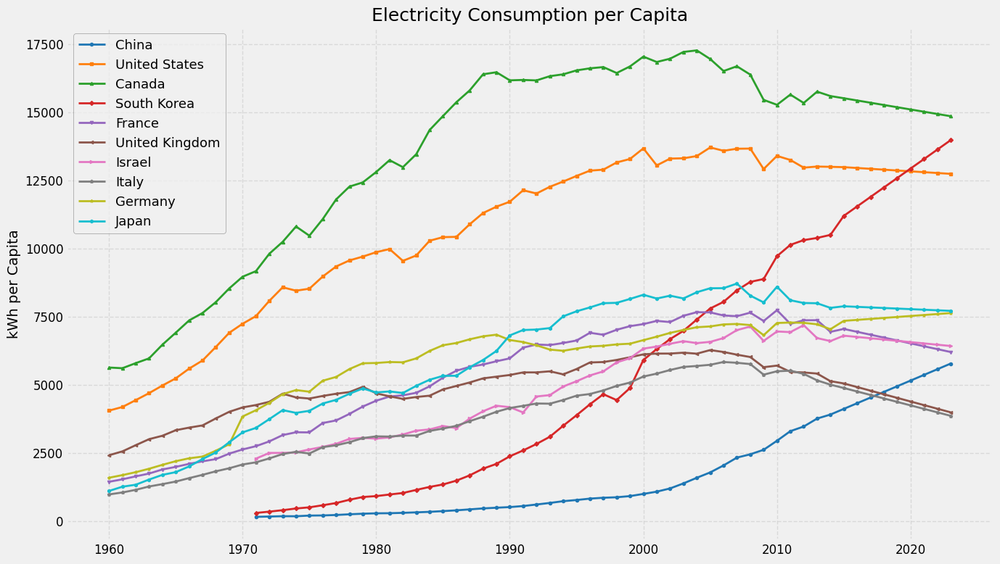

In [ ]:
# EDA - Electricity Consumption per Capita
g7_countries = countries_to_pc
electricity_total_df = datasets.get('electricity_pc')
if electricity_total_df is not None and not electricity_total_df.empty:
    elec_filt = electricity_total_df[electricity_total_df['COUNTRY'].isin(g7_countries)]
    plot_trend(
            elec_filt,
            'Electricity Consumption per Capita',
            'kWh per Capita',
            countries=g7_countries,
            save_filename="electricity_consumption_g7_china.png",
            add_ci=False,
            trend_line=False
        )

*Interpretation:* Canada and the United States maintain high historical levels of electricity consumption per capita, though recent trends suggest stabilization or decline, contrasting with the rapid growth observed in China and South Korea. European nations and Japan generally show more moderate consumption levels with varied recent trajectories.


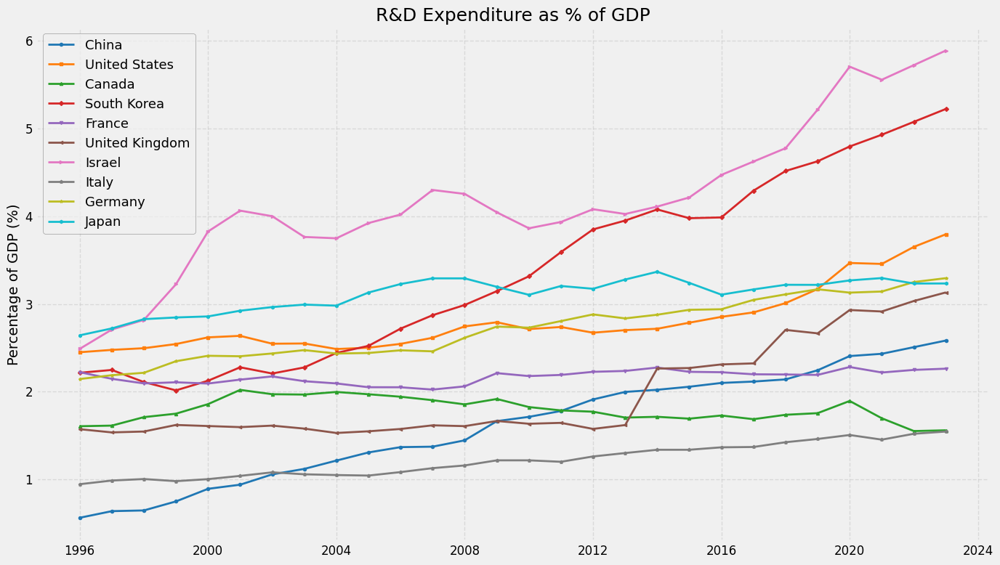

In [ ]:
# EDA - R&D Expenditure (% GDP)
rd_expenditure_df = datasets.get('rd_expenditure')
if rd_expenditure_df is not None and not rd_expenditure_df.empty:
    plot_trend(
        rd_expenditure_df[rd_expenditure_df['COUNTRY'].isin(g7_countries)],
        'R&D Expenditure as % of GDP',
        'Percentage of GDP (%)',
        countries=g7_countries,
        save_filename="rd_expenditure_g7_china.png",
        trend_line=False
    )

*Interpretation:* My analysis reveals that Israel and South Korea dedicate a significantly higher percentage of their GDP to R&D compared to other nations, showing strong upward trends. While most countries, including the rapidly growing China, have increased their R&D investment ratio, Canada's proportion has remained relatively flat or even slightly declined in recent years, lagging behind peers like the US and Germany.

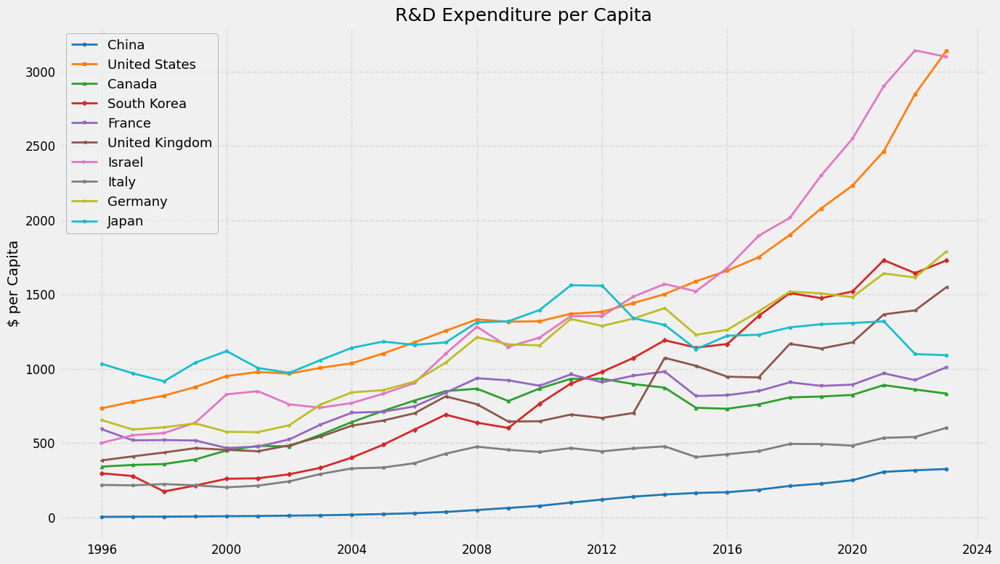

In [ ]:
# EDA - R&D Expenditure per capita
rd_expenditure_df = datasets.get('rd_expenditure_absolute_pc')
if rd_expenditure_df is not None and not rd_expenditure_df.empty:
    plot_trend(
        rd_expenditure_df[rd_expenditure_df['COUNTRY'].isin(g7_countries)],
        'R&D Expenditure per Capita',
        '$ per Capita',
        countries=g7_countries,
        save_filename="rd_expenditure_absolute_pc_g7_china.png",
        trend_line=False
    )

*Interpretation:* The United States and Israel are by far the leaders in per capita R&D expenditure with strong upward trends. This contrasts canada which is being outpaced and remains in the middle tier with less dynamic growth recently. Meanwhile, nations like South Korea and China exhibit rapid increases in their per capita R&D investment over this period.


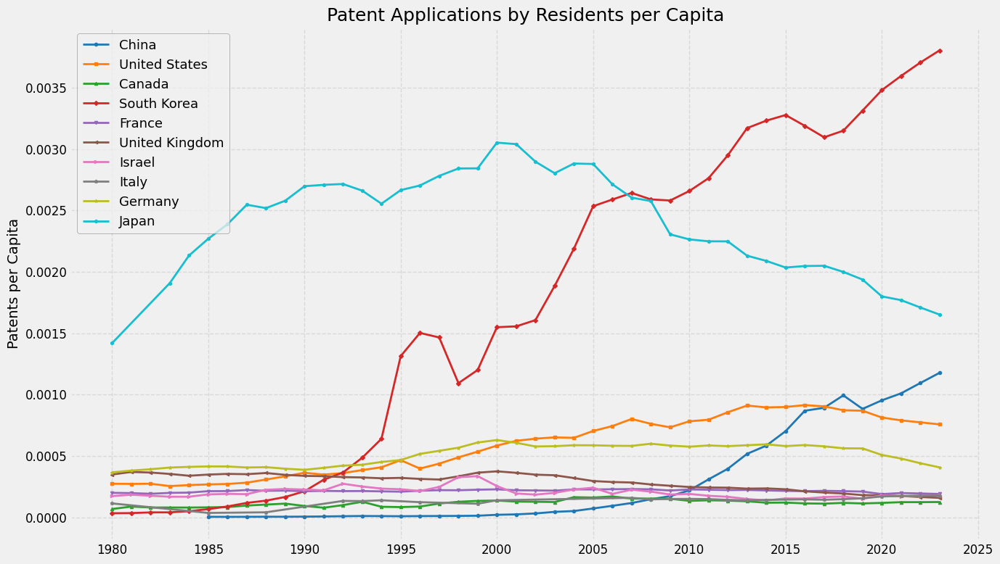

In [ ]:
# EDA - Patent Applications per Capita
patents_df = datasets.get('patents_pc')
if patents_df is not None and not patents_df.empty:
    plot_trend(
        patents_df,
        'Patent Applications by Residents per Capita',
        'Patents per Capita',
        countries=g7_countries,
        save_filename="patents_per_capita_g7_china.png",
        trend_line=False
    )

*Interpretation:* South Korea is the leader in resident patent applications per capita with a strong upward trend, contrasting starkly with Japan's significant decline from its earlier peak. China exhibits dramatic recent growth from a low base, while Canada consistently ranks near the bottom among these nations on this innovation output metric.


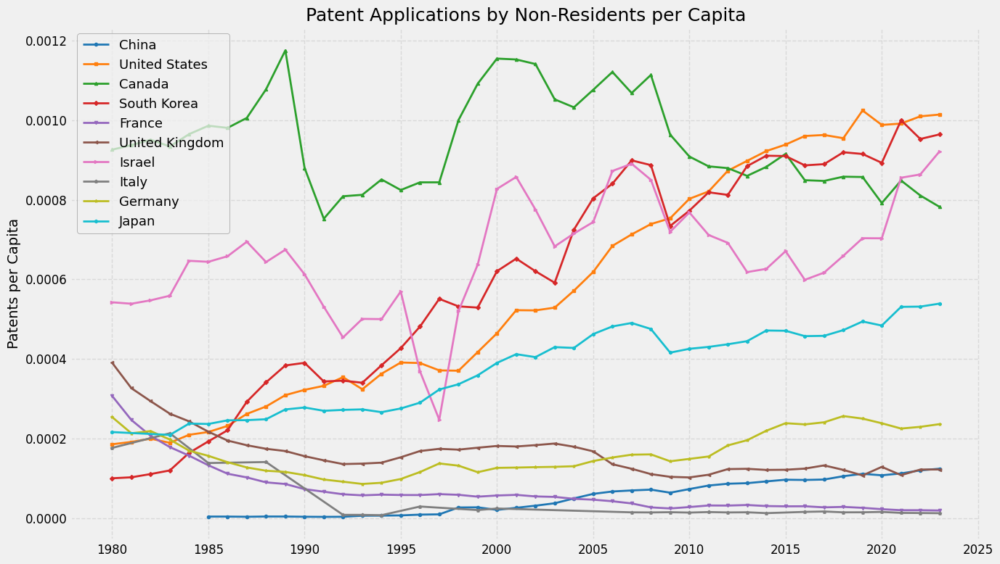

In [ ]:
# EDA - Patent Applications per Capita
patents_non_residents_df = datasets.get('patents_non_residents_pc')
if patents_non_residents_df is not None and not patents_non_residents_df.empty:
    plot_trend(
        patents_non_residents_df,
        'Patent Applications by Non-Residents per Capita',
        'Patents per Capita',
        countries=g7_countries,
        save_filename="patents_non_residents_per_capita_g7_china.png",
        trend_line=False
    )

*Interpretation:* Canada historically led in attracting non-resident patent applications per capita but has since declined, whereas the United States, South Korea, and Israel now demonstrate higher and generally increasing rates. China and several European nations show substantially lower levels of attracting foreign patents on a per capita basis.


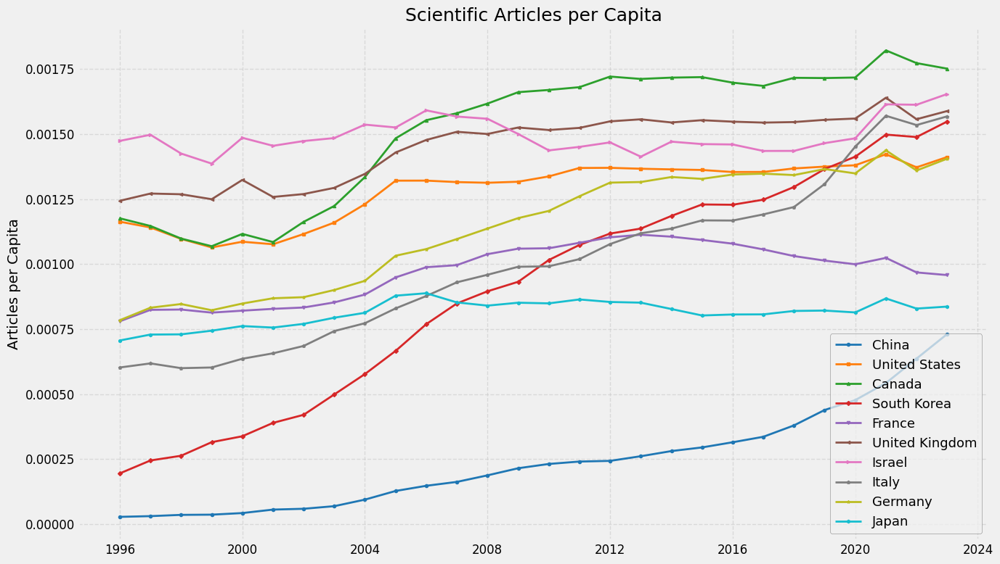

In [ ]:
# EDA - Scientific Articles per Capita
articles_df = datasets.get('scientific_articles_pc')
if articles_df is not None and not articles_df.empty:
    plot_trend(
        articles_df,
        'Scientific Articles per Capita',
        'Articles per Capita',
        countries=g7_countries,
        save_filename="scientific_articles_per_capita_g7_china.png",
        add_ci=False
    )

***Interpretation:*** Analysis indicates Canada consistently ranks among the world leaders in scientific articles per capita, alongside nations like the UK and Israel, maintaining a strong research output relative to its population. While countries like South Korea and China show faster growth rates from different starting points, Canada remains a top performer in this specific innovation metric.


Debug: Skipping Israel - not enough data points (0)


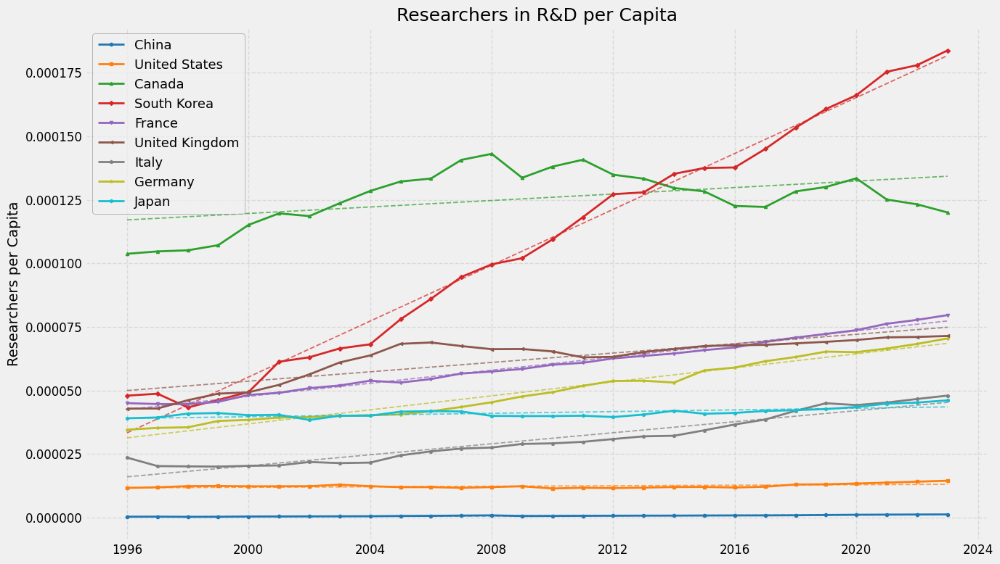

In [ ]:
# EDA - Researchers in R&D per capita
researchers_df = datasets.get('researchers_pc')
if researchers_df is not None and not researchers_df.empty:
    plot_trend(
        researchers_df[researchers_df['COUNTRY'].isin(g7_countries)],
        'Researchers in R&D per Capita',
        'Researchers per Capita',
        countries=g7_countries,
        save_filename="researchers_g7_china.png",
        trend_line=True
    )

***Interpretation:*** My analysis reveals South Korea's dramatic rise to lead in researchers per capita, surpassing Canada which has seen its initially high ratio stagnate and recently decline. Meanwhile, nations like France and Germany show steady increases, while the US and China notably lag far behind most peers on this measure of R&D input.

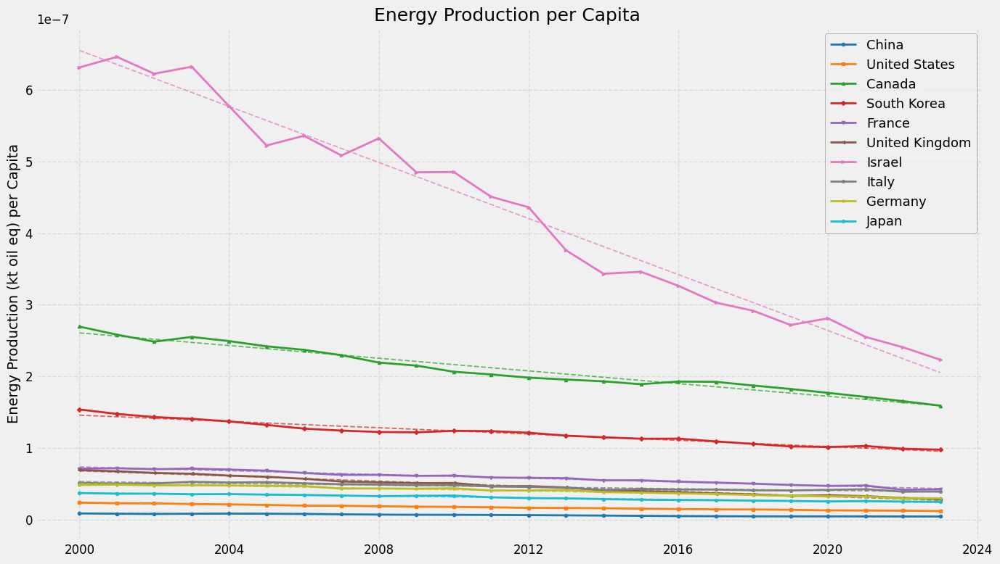

In [ ]:
# EDA - Energy production per capita
energy_prod_df = datasets.get('energy_prod_pc')
if energy_prod_df is not None and not energy_prod_df.empty:
    plot_trend(
        energy_prod_df[energy_prod_df['COUNTRY'].isin(g7_countries)],
        'Energy Production per Capita ',
        'Energy Production (kt oil eq) per Capita',
        countries=g7_countries,
        save_filename="energy_prod_g7_china.png",
        trend_line=True
    )

***Interpretation:*** It is depicted that Israel and Canada exhibit the highest per capita energy production (kt oil eq) among nations. In addition to this both show distinct downward trends over the past twenty years. South Korea follows with a more stable, moderate production level, while the remaining G7 countries, China, and Japan are at substantially lower per capita production rates, showing slight declines or relative stability.

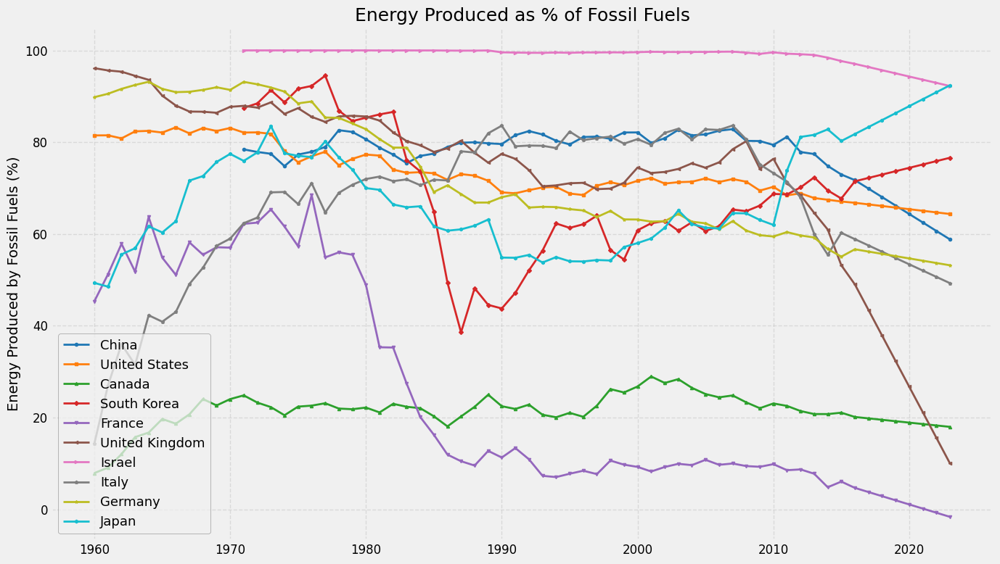

In [ ]:
# EDA - % Energy Produced by Fossil Fuels
fossil_fuels_df = datasets.get('electricity_percentage_prod')
if fossil_fuels_df is not None and not fossil_fuels_df.empty:
    plot_trend(
        fossil_fuels_df[fossil_fuels_df['COUNTRY'].isin(g7_countries)],
        'Energy Produced as % of Fossil Fuels',
        'Energy Produced by Fossil Fuels (%)',
        countries=g7_countries,
        save_filename="fossil_fuels_g7_china.png",
        trend_line=False
    )

***Interpretation:*** Analysis shows a widespread trend of decreasing reliance on fossil fuels for electricity generation among most nations. This trend is most significant in the UK and Germany. Canada and France stand out for consistently maintaining very low percentages, contrasting sharply with Israel's sustained high dependency near 100%.


--- EDA: Composite Innovation Index ---
Debug: Skipping Israel - not enough data points (0)


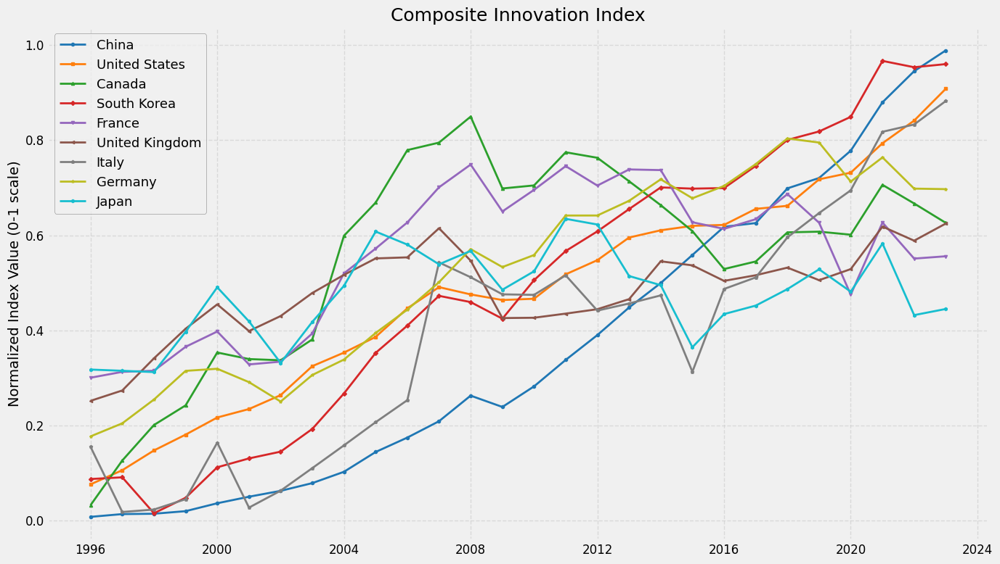

In [ ]:
# EDA - Composite Innovation Index
print("\n--- EDA: Composite Innovation Index ---")
composite_innovation_index = pd.DataFrame()
patents_df = datasets.get('patents_pc')
patents_df_filt = patents_df[patents_df['COUNTRY'].isin(g7_countries)]

patents_non_residents_df = datasets.get('patents_non_residents_pc')
patents_non_residents_df_filt = patents_non_residents_df[patents_non_residents_df['COUNTRY'].isin(g7_countries)]

rd_expenditure_df = datasets.get('rd_expenditure_absolute_pc')
rd_expenditure_df_filt = rd_expenditure_df[rd_expenditure_df['COUNTRY'].isin(g7_countries)]

researchers_df = datasets.get('researchers_pc')
researchers_df_filt = researchers_df[researchers_df['COUNTRY'].isin(g7_countries)]

fdi_net_inflows_df = datasets.get('fdi_net_inflows_absolute_pc')
fdi_net_inflows_df_filt = fdi_net_inflows_df[fdi_net_inflows_df['COUNTRY'].isin(g7_countries)]

scientific_articles_df = datasets.get('scientific_articles_pc')
scientific_articles_df_filt = scientific_articles_df[scientific_articles_df['COUNTRY'].isin(g7_countries)]

gross_capital_formation_df = datasets.get('gross_capital_formation_absolute_pc')
gross_capital_formation_df_filt = gross_capital_formation_df[gross_capital_formation_df['COUNTRY'].isin(g7_countries)]

composite_innovation_index = create_composite_innovation_index(
            dataframes=[patents_df_filt,
                        patents_non_residents_df_filt,
                        rd_expenditure_df_filt,
                        researchers_df_filt,
                        fdi_net_inflows_df_filt,
                        scientific_articles_df_filt,
                        gross_capital_formation_df_filt],
            weights = [0.25, 0.07, 0.25, 0.15, 0.06, 0.15, 0.07],
            country_col='COUNTRY')
plot_trend(
    composite_innovation_index,
    'Composite Innovation Index',
    'Normalized Index Value (0-1 scale)',
    countries=g7_countries,
    save_filename="composite_innovation_index.png",
    trend_line=False)

***Interpretation:***
The composite innovation index combines multiple factors such as patents, rd_expenditure and scientific articles per capita to name a few. A weighting was assigned to each based on a subjective importance level that each metric plays in a country's innovation.

The per capita metrics and weights representing the composite index are the following: Patents– 0.25, Non-resident Patents – 0.07, R&D Expenditure – 0.25, Researchers – 0.15, FDI inflows – 0.06, Scientific Articles – 0.15, Gross Capital Formation - 0.07.

The logic behind the selection of these weights were that Patents by residents (0.25) and R&D Expenditure (0.25) are  direct outputs and inputs of the innovation process. Researchers in R&D and Scientific Articles both with 0.15, represent human capital and knowledge dissemination and are crucial but less direct measures of innovation. The remaining indicators are weighted less between 0.07 and 0.06 as these were seen as factors that support or attact innovation thus less essential to the core innovation effort.

Additionally, normalization was applied separately for each metric/indicators/factors and within each specific country using Min-Max scaling. The sample formula is VALUE_norm = (VALUE - min_val) / (max_val - min_val). The normalization was needed due to the diverse scale and units of the metrics considered in the analysis. Due to scaling from 0-1, the final values now become directly compareable and will lead to a more realistic and accurate presentation of findings. If this was not done, factors such as R&D Expenditure would dominate the index even if a small weight was assigned compared to metrics with smaller values.

It reveals a general upward trend across most nations, with South Korea, China, and the United States demonstrating the best recent performance. This adds validity to the metrics and weights used as we know today these three nations are among the best when it relates to producing and designing innovative solutions and products. Canada, while highly competitive in the past is now showing a more stagnant trend and is falling behind the leaders. It is this fall the group wants to address.





-- Extrapolating Component Metrics for Projection --

Calculating Projected G7 Composite Index based on 7 components: patents_pc, patents_non_residents_pc, rd_expenditure_absolute_pc, researchers_pc, fdi_net_inflows_absolute_pc, scientific_articles_pc, gross_capital_formation_absolute_pc
Debug: Skipping Israel - not enough data points (0)


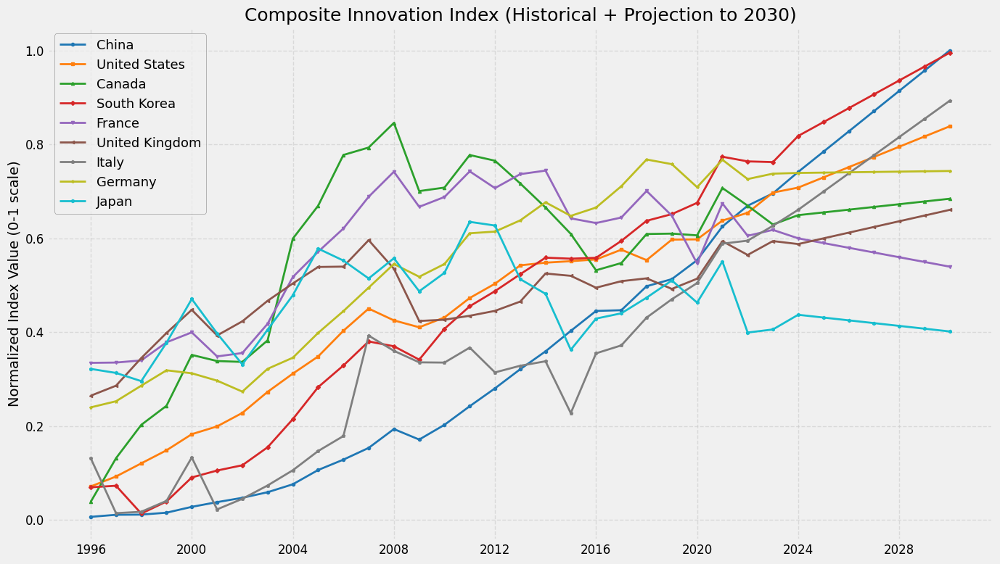

In [ ]:
# --Extrapolate Components--
print("\n-- Extrapolating Component Metrics for Projection --")
target_extrap_year = 2030
extended_components_g7 = []
valid_keys_extrap = []
component_keys = ['patents_pc',
                  'patents_non_residents_pc',
                  'rd_expenditure_absolute_pc',
                  'researchers_pc',
                  'fdi_net_inflows_absolute_pc',
                  'scientific_articles_pc',
                  'gross_capital_formation_absolute_pc',
                  ]
for key in component_keys:
    original_df = datasets.get(key)
    if original_df is not None and not original_df.empty:
        filtered_df_g7 = original_df[original_df['COUNTRY'].isin(g7_countries)].copy()
        if not filtered_df_g7.empty:
            last_year = filtered_df_g7['REF_DATE'].max().year
            if last_year < target_extrap_year:
                extended_df = extend_time_series(
                    filtered_df_g7,
                    target_year=target_extrap_year,
                    method='holt',
                    country_col='COUNTRY'
                )
            else:
                 extended_df = filtered_df_g7.copy()
                 if 'DATA_TYPE' not in extended_df.columns and 'DATA_TYPE' in original_df.columns:
                      extended_df = pd.merge(extended_df, original_df[['REF_DATE', 'COUNTRY', 'DATA_TYPE']], on=['REF_DATE', 'COUNTRY'], how='left')
                 elif 'DATA_TYPE' not in extended_df.columns:
                      extended_df['DATA_TYPE'] = 'Actual'
            if extended_df is not None and not extended_df.empty:
                 extended_components_g7.append(extended_df)
                 valid_keys_extrap.append(key)

composite_index_g7_projected = pd.DataFrame()
if len(extended_components_g7) >= 2:
    print(f"\nCalculating Projected G7 Composite Index based on {len(extended_components_g7)} components: {', '.join(valid_keys_extrap)}")
    if len(extended_components_g7) < len(component_keys):
         print("Warning: Index based on fewer components than intended due to extrapolation failures or missing data.")
    composite_index_g7_projected = create_composite_innovation_index(
        dataframes=extended_components_g7,
        weights = [0.25, 0.07, 0.25, 0.15, 0.06, 0.15, 0.07],
        country_col='COUNTRY'
    )
else:
    print("\nError: Not enough G7 component metrics successfully extrapolated. Cannot create projected composite index.")
if composite_index_g7_projected is not None and not composite_index_g7_projected.empty:
    plot_trend(
        composite_index_g7_projected,
        f'Composite Innovation Index (Historical + Projection to {target_extrap_year})',
        'Normalized Index Value (0-1 scale)',
        countries=g7_countries,
        save_filename="composite_innovation_index_g7_projected.png",
        trend_line=False
    )

<a name="policy-4-can-usa"></a>
## **5.3 Canada Deep Dive & US Comparison**

This section focuses specifically on the US and CA examining:
*   A direct comparison of trends and gaps between Canada and the United States.


-- CA vs. US Gap Analysis --

--- Analyzing Gap: Electricity Cons. (kWh/Cap) ---


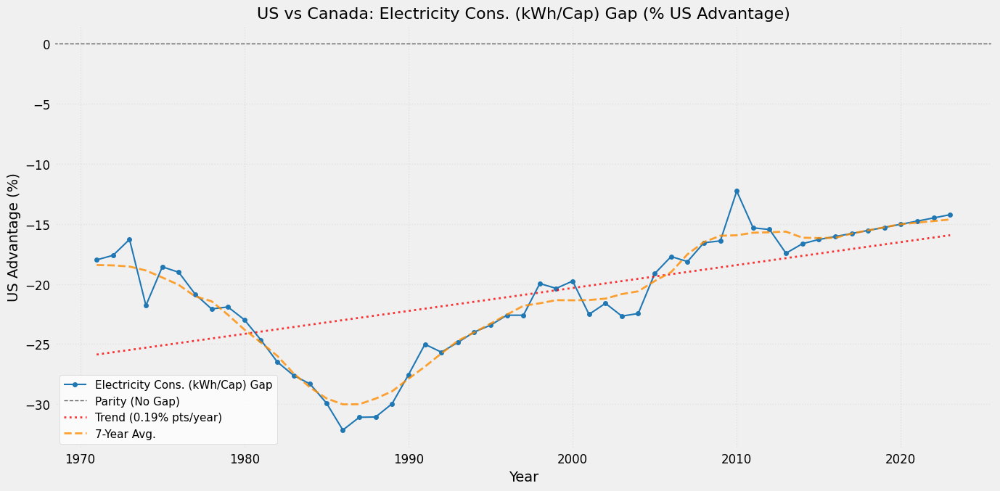


--- Electricity Cons. (kWh/Cap) Gap Analysis Summary ---
Time Period Analyzed: 1971-2023
Average US Advantage: -20.91%
Median US Advantage: -20.37%
Recent US Advantage (avg last <=5yr): -14.77%
Linear Trend: Widening US Lead (0.19 percentage points per year)
---------------------------------------------------

--- Analyzing Gap: Patents per capita ---


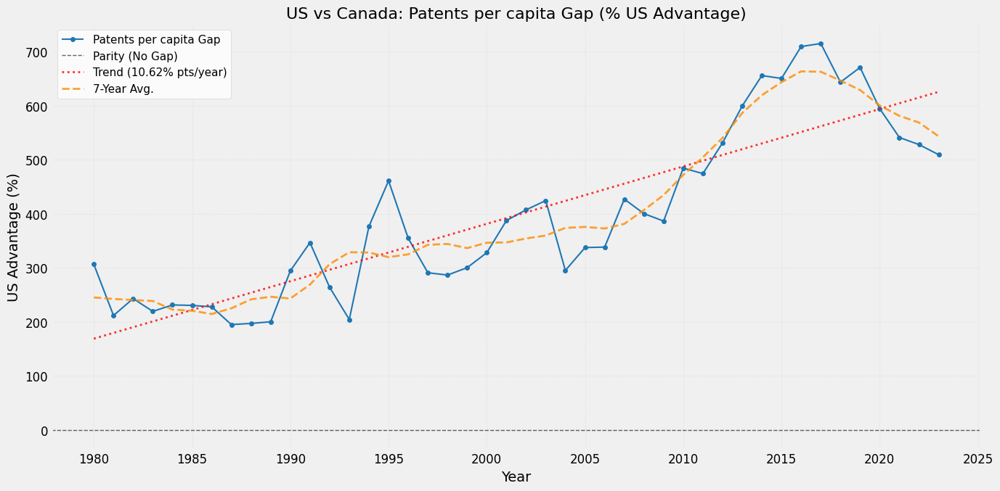


--- Patents per capita Gap Analysis Summary ---
Time Period Analyzed: 1980-2023
Average US Advantage: 397.40%
Median US Advantage: 365.71%
Recent US Advantage (avg last <=5yr): 568.82%
Linear Trend: Widening US Lead (10.62 percentage points per year)
------------------------------------------

--- Analyzing Gap: R&D Expenditure per capita ---


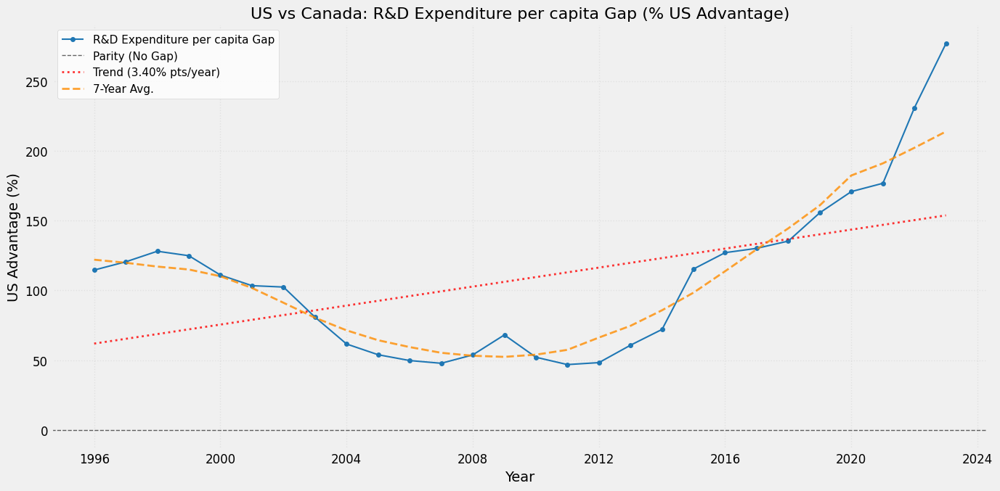


--- R&D Expenditure per capita Gap Analysis Summary ---
Time Period Analyzed: 1996-2023
Average US Advantage: 107.82%
Median US Advantage: 107.20%
Recent US Advantage (avg last <=5yr): 202.13%
Linear Trend: Widening US Lead (3.40 percentage points per year)
--------------------------------------------------

--- Analyzing Gap: Researchers per capita ---


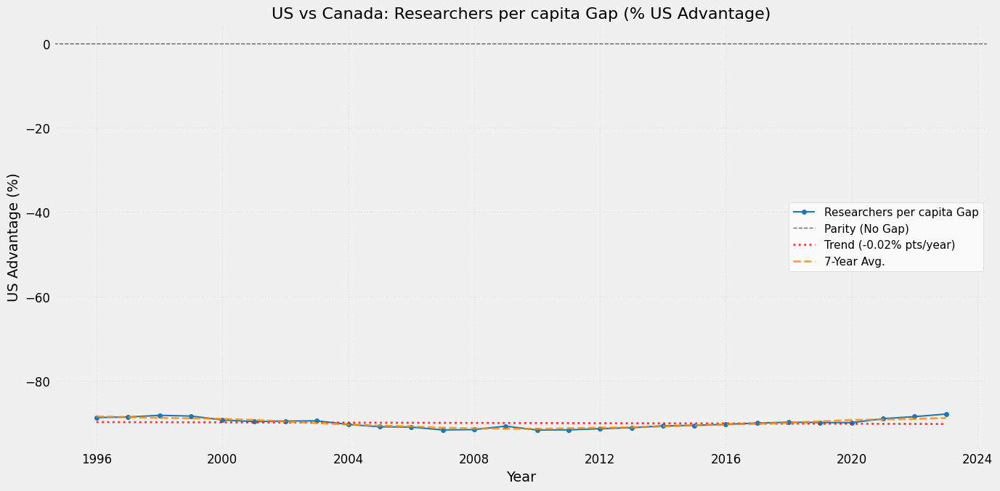


--- Researchers per capita Gap Analysis Summary ---
Time Period Analyzed: 1996-2023
Average US Advantage: -90.03%
Median US Advantage: -89.99%
Recent US Advantage (avg last <=5yr): -89.05%
Linear Trend: Narrowing US Lead (-0.02 percentage points per year)
----------------------------------------------

--- Analyzing Gap: Scientific Articles per capita ---


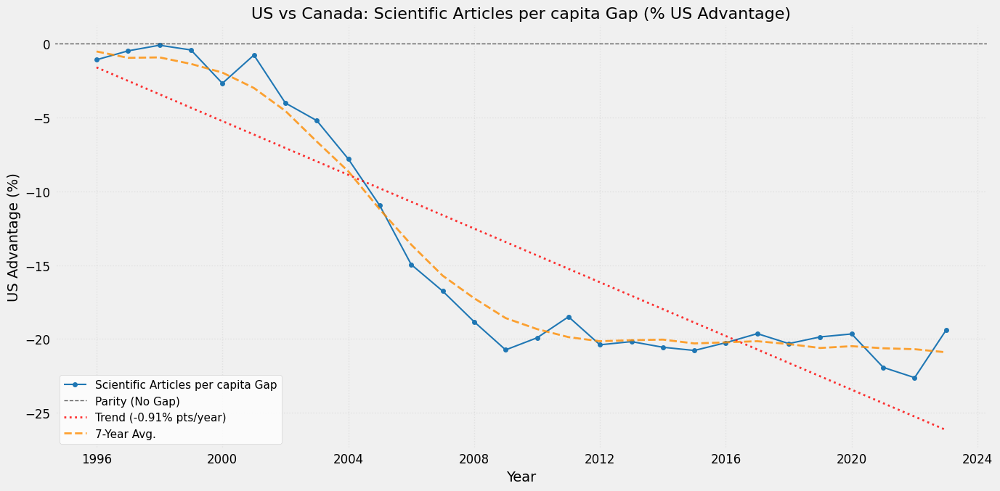


--- Scientific Articles per capita Gap Analysis Summary ---
Time Period Analyzed: 1996-2023
Average US Advantage: -13.89%
Median US Advantage: -19.11%
Recent US Advantage (avg last <=5yr): -20.69%
Linear Trend: Narrowing US Lead (-0.91 percentage points per year)
------------------------------------------------------

--- Analyzing Gap: GDP per Capita ---


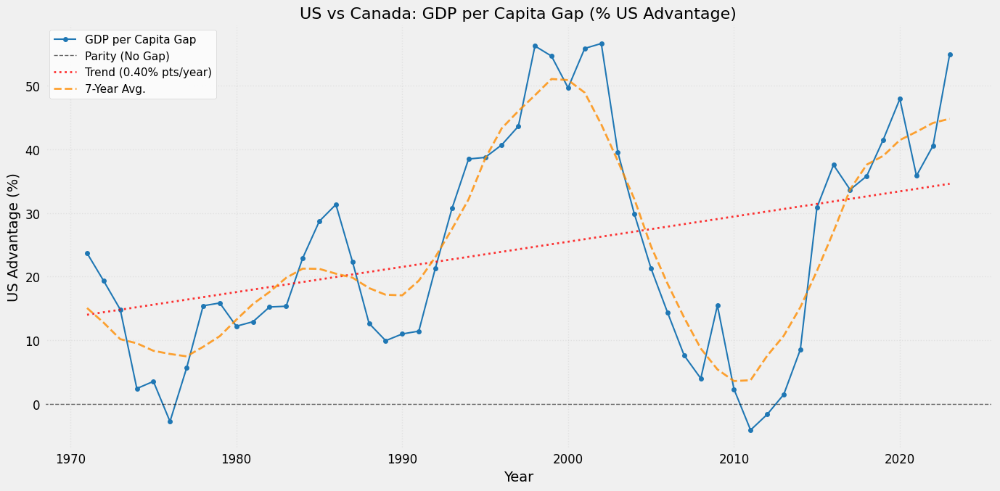


--- GDP per Capita Gap Analysis Summary ---
Time Period Analyzed: 1971-2023
Average US Advantage: 24.29%
Median US Advantage: 21.33%
Recent US Advantage (avg last <=5yr): 44.16%
Linear Trend: Widening US Lead (0.40 percentage points per year)
--------------------------------------

--- Analyzing Gap: Capital Formation per capita ---


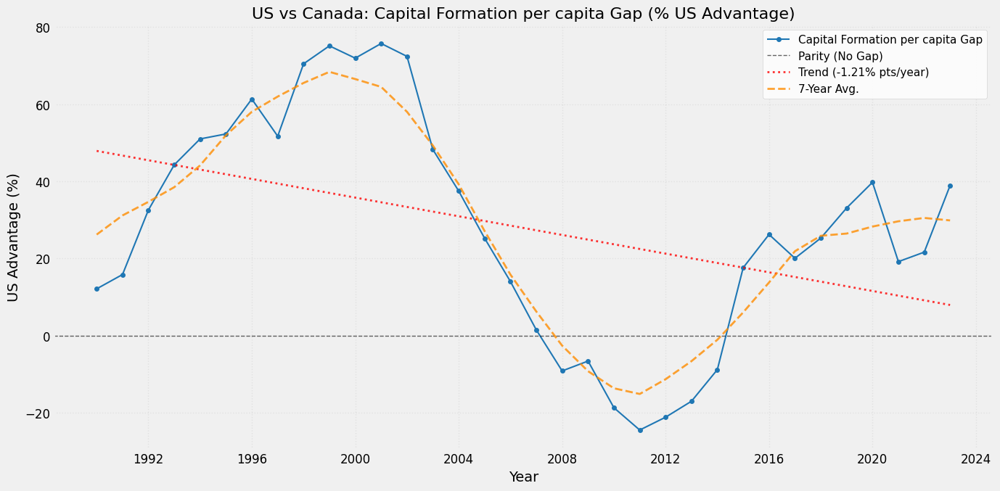


--- Capital Formation per capita Gap Analysis Summary ---
Time Period Analyzed: 1990-2023
Average US Advantage: 27.93%
Median US Advantage: 25.77%
Recent US Advantage (avg last <=5yr): 30.53%
Linear Trend: Narrowing US Lead (-1.21 percentage points per year)
----------------------------------------------------

--- Analyzing Gap: FDI Net Inflows per capita ---


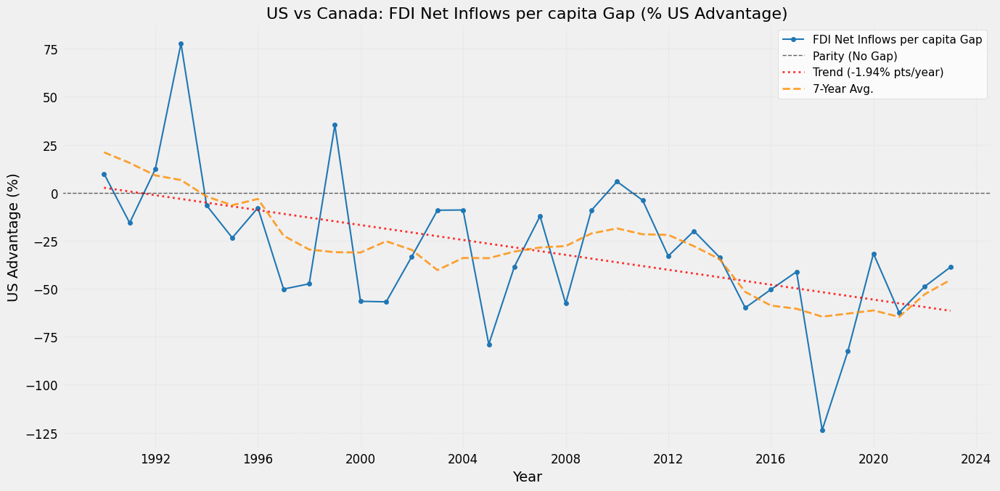


--- FDI Net Inflows per capita Gap Analysis Summary ---
Time Period Analyzed: 1990-2023
Average US Advantage: -29.45%
Median US Advantage: -33.11%
Recent US Advantage (avg last <=5yr): -52.87%
Linear Trend: Narrowing US Lead (-1.94 percentage points per year)
--------------------------------------------------


In [ ]:
# CA vs. US Gap Analysis
print("\n-- CA vs. US Gap Analysis --")
gap_analysis_metrics = {
    "Electricity Cons. (kWh/Cap)": ('electricity_pc', (1971, 2023)),
    "Patents per capita": ('patents_pc', (1980, 2023)),
    "R&D Expenditure per capita": ('rd_expenditure_absolute_pc', (1981, 2023)),
    "Researchers per capita": ('researchers_pc', (1996, 2023)),
    "Scientific Articles per capita": ('scientific_articles_pc', (1996, 2023)),
    "GDP per Capita": ('gdp_pc', (1971, 2023)),
    "Capital Formation per capita": ('gross_capital_formation_absolute_pc', (1990, 2023)),
    "FDI Net Inflows per capita": ('fdi_net_inflows_absolute_pc', (1990, 2023))
}
gap_results = {}
for metric_name, (data_key, time_range) in gap_analysis_metrics.items():
    print(f"\n--- Analyzing Gap: {metric_name} ---")
    can_df = canada_data.get(data_key)
    us_df = us_data.get(data_key)
    if can_df is not None and not can_df.empty and us_df is not None and not us_df.empty:
        try:
            gap_df = analyze_innovation_gaps(
                can_df=can_df,
                us_df=us_df,
                metric_name=metric_name,
                time_period=time_range,
                save_filename_base="canada_us_gap"
            )
            gap_results[metric_name] = gap_df
        except Exception as e:
            print(f"Error during gap analysis for {metric_name}: {e}")
    else:
        missing = []
        if can_df is None or can_df.empty:
            missing.append(f"Canada '{data_key}'")
        if us_df is None or us_df.empty:
            missing.append(f"US '{data_key}'")
        print(f"Skipping gap analysis for {metric_name}: Missing data for {', '.join(missing)}.")

***Interpretation:***

The US shows a large advantage in Patents per capita and R&D Expenditure per capita. While, Canada leads (negative US advantage) in Researchers per capita, Scientific Articles per capita, and Electricity Consumption per capita although the gap has been narrowing for the last two. GDP per capita, Capital Formation per capita, and FDI Net Inflows per capita show greater volatility with distinctive conclusions harder to be drawn. Although the longer-term trends do indicate slightly widening US advantage for GDP and narrowing advantages for Capital Formation and FDI.



-- Innovation Efficiency (Patents per kWh) --


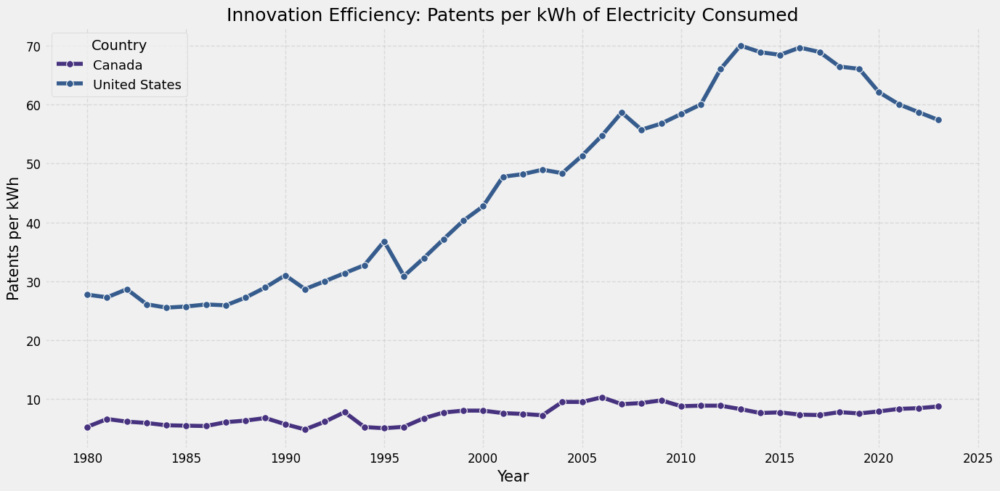


Average Innovation Efficiency (Patents per kWh, 2000-2023):
  Canada: 8.3687
  US:     58.9355
  US Advantage: 604.24%


In [ ]:
print("\n-- Innovation Efficiency (Patents per kWh) --")
can_patents = canada_data.get('patents')
can_electricity = canada_data.get('electricity')
us_patents = us_data.get('patents')
us_electricity = us_data.get('electricity')

def calculate_efficiency(pat_df, elec_df, country_name):
    pat_df_clean = pat_df[['REF_DATE', 'VALUE']].copy()
    pat_df_clean['VALUE'] = pd.to_numeric(pat_df_clean['VALUE'], errors='coerce')
    pat_df_clean = pat_df_clean.rename(columns={'VALUE': 'VALUE_patents'})
    pat_df_clean = pat_df_clean.dropna()
    elec_df_clean = elec_df[['REF_DATE', 'VALUE']].copy()
    elec_df_clean['VALUE'] = pd.to_numeric(elec_df_clean['VALUE'], errors='coerce')
    elec_df_clean = elec_df_clean.rename(columns={'VALUE': 'VALUE_electricity'})
    elec_df_clean = elec_df_clean.dropna()
    if pat_df_clean.empty or elec_df_clean.empty:
        print(f"Warning: Empty dataframe after cleaning for {country_name}. Cannot calculate efficiency.")
        return pd.DataFrame()
    merged = pd.merge(pat_df_clean, elec_df_clean, on='REF_DATE', how='inner')
    if merged.empty:
        print(f"Warning: No overlapping years found for {country_name} between patents and electricity.")
        return pd.DataFrame()

    merged = merged[merged['VALUE_electricity'].abs() > 1e-9]
    if merged.empty:
          print(f"Warning: No valid data after filtering near-zero electricity for {country_name}.")
          return pd.DataFrame()
    merged['Efficiency_Patents_per_kWh'] = merged['VALUE_patents'] / merged['VALUE_electricity']
    merged['COUNTRY'] = country_name
    return merged[['REF_DATE', 'COUNTRY', 'Efficiency_Patents_per_kWh']]

try:
    can_efficiency = calculate_efficiency(can_patents, can_electricity, 'Canada')
    us_efficiency = calculate_efficiency(us_patents, us_electricity, 'United States')
    valid_efficiency_dfs = []
    if can_efficiency is not None and not can_efficiency.empty:
        valid_efficiency_dfs.append(can_efficiency)
    if us_efficiency is not None and not us_efficiency.empty:
        valid_efficiency_dfs.append(us_efficiency)
    if not valid_efficiency_dfs:
          print("Error: No valid efficiency data calculated for either country.")
    else:
        combined_efficiency = pd.concat(valid_efficiency_dfs, ignore_index=True)
        if not combined_efficiency.empty:
            plt.figure(figsize=(14, 7))
            sns.lineplot(data=combined_efficiency, x='REF_DATE', y='Efficiency_Patents_per_kWh', hue='COUNTRY', marker='o', markersize=7)
            plt.title('Innovation Efficiency: Patents per kWh of Electricity Consumed', fontsize=18)
            plt.ylabel('Patents per kWh', fontsize=15)
            plt.xlabel('Year', fontsize=15)
            plt.grid(True, which='both', linestyle='--', alpha=0.6)
            plt.legend(title='Country', fontsize=13)
            plt.tight_layout()
            save_path = output_dir / "patent_energy_efficiency.png"
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            plt.show()
            common_eff_years = get_common_years([df for df in valid_efficiency_dfs if df is not None])
            recent_common_eff_years = [yr for yr in common_eff_years if yr >= 2000]
            if recent_common_eff_years:
                  can_avg_eff, us_avg_eff = np.nan, np.nan
                  if can_efficiency is not None and not can_efficiency.empty:
                      can_recent_eff = can_efficiency[can_efficiency['REF_DATE'].dt.year.isin(recent_common_eff_years)]['Efficiency_Patents_per_kWh']
                      can_avg_eff = can_recent_eff.mean()
                  if us_efficiency is not None and not us_efficiency.empty:
                      us_recent_eff = us_efficiency[us_efficiency['REF_DATE'].dt.year.isin(recent_common_eff_years)]['Efficiency_Patents_per_kWh']
                      us_avg_eff = us_recent_eff.mean()
                  efficiency_gap_pct = np.nan
                  if pd.notna(can_avg_eff) and pd.notna(us_avg_eff) and abs(can_avg_eff) > 1e-12:
                      efficiency_gap_pct = (us_avg_eff / can_avg_eff - 1) * 100
                  print(f"\nAverage Innovation Efficiency (Patents per kWh, {min(recent_common_eff_years)}-{max(recent_common_eff_years)}):")
                  print(f"  Canada: {can_avg_eff:.4f}")
                  print(f"  US:     {us_avg_eff:.4f}")
                  if not np.isnan(efficiency_gap_pct):
                      print(f"  US Advantage: {efficiency_gap_pct:.2f}%")
                  elif pd.notna(can_avg_eff) and pd.notna(us_avg_eff):
                      print("  Cannot calculate % advantage (Canada avg efficiency near zero).")
            else:
                  print("\nCould not calculate average efficiency comparison (no recent common years with data for both).")
        else:
              print("No combined efficiency data available for plotting or comparison.")
except Exception as e:
    print(f"Error calculating or plotting innovation efficiency: {e}")
    traceback.print_exc()

*Interpretation:*

There is a very significant difference between the two countries; the US consistently generates more patents per kWh of electricity consumed than CA throughout the entire period. US efficiency saw an increase from 1980, peaking around 2012-2014 before starting a slight downward trend, while CA efficiency has remained low and stable over the same period.


<a name="policy-4-stats-can"></a>
## **5.4 Canada Statistical Analysis**

This section focuses specifically on Canada examining:
*   Correlations between energy consumption and innovation metrics within Canada.
*   Scatter plots visualizing key relationships.
*   Regression models linking electricity consumption to innovation outputs in Canada.

In [ ]:
print("\n-- CA Stationarity Analysis (ADF Tests) --")
stationarity_results = {}
vars_to_check = {
    'Electricity Cons. (kWh/Cap)': canada_data.get('electricity_pc'),
    'Patents per capita': canada_data.get('patents_pc'),
    'R&D Expenditure per capita': canada_data.get('rd_expenditure_absolute_pc'),
    'Scientific Articles per capita': canada_data.get('scientific_articles_pc'),
    'Researchers per capita': canada_data.get('researchers_pc'),
    'GDP per Capita': canada_data.get('gdp_pc'),
    'Capital Formation per capita': canada_data.get('gross_capital_formation_absolute_pc'),
    'FDI Net Inflows per capita': canada_data.get('fdi_net_inflows_absolute_pc'),
    'Trade per capita': canada_data.get('trade_pct_gdp_absolute_pc')
}

for name, df in vars_to_check.items():
    if df is not None and not df.empty and 'VALUE' in df.columns:
        is_stationary, p_val = check_stationarity(df['VALUE'], name)
        stationarity_results[name] = {'Is Stationary (p<0.05)': is_stationary, 'P-Value': p_val}
    else:
        print(f"Skipping stationarity check for '{name}': Data unavailable.")
        stationarity_results[name] = {'Is Stationary (p<0.05)': None, 'P-Value': np.nan}

stationarity_df = pd.DataFrame.from_dict(stationarity_results, orient='index')
print("\nStationarity Test Summary:", display(stationarity_df))


-- CA Stationarity Analysis (ADF Tests) --
ADF Test for 'Electricity Cons. (kWh/Cap)':
  Test Statistic: -3.3984
  P-value: 0.0110
  Result: Likely Stationary (at alpha=0.05)
ADF Test for 'Patents per capita':
  Test Statistic: -2.2634
  P-value: 0.1840
  Result: Likely Non-Stationary (at alpha=0.05)
ADF Test for 'R&D Expenditure per capita':
  Test Statistic: -2.0329
  P-value: 0.2723
  Result: Likely Non-Stationary (at alpha=0.05)
ADF Test for 'Scientific Articles per capita':
  Test Statistic: -0.9311
  P-value: 0.7776
  Result: Likely Non-Stationary (at alpha=0.05)
ADF Test for 'Researchers per capita':
  Test Statistic: -3.1356
  P-value: 0.0240
  Result: Likely Stationary (at alpha=0.05)
ADF Test for 'GDP per Capita':
  Test Statistic: 0.2025
  P-value: 0.9724
  Result: Likely Non-Stationary (at alpha=0.05)
ADF Test for 'Capital Formation per capita':
  Test Statistic: -0.1495
  P-value: 0.9443
  Result: Likely Non-Stationary (at alpha=0.05)
ADF Test for 'FDI Net Inflows per cap

,Is Stationary (p<0.05),P-Value
Electricity Cons. (kWh/Cap),True,0.011014
Patents per capita,False,0.184032
R&D Expenditure per capita,False,0.272347
Scientific Articles per capita,False,0.777563
Researchers per capita,True,0.024025
GDP per Capita,False,0.972403
Capital Formation per capita,False,0.944278
FDI Net Inflows per capita,False,0.891738
Trade per capita,False,0.869154



Stationarity Test Summary: None


-- CA Correlation Analysis --

Correlation Matrix (CA, 1996-2023):


,Electricity Cons. (kWh/Cap),Patents per capita,Patents,R&D Expenditure per capita,Scientific Articles per capita,Researchers per capita,GDP per Capita,Capital Formation per capita,Trade per capita,FDI Inflows per capita,Patents Non-Residents per capita
Electricity Cons. (kWh/Cap),1.00,0.35,-0.18,-0.68,-0.84,-0.30,-0.79,-0.78,-0.75,-0.57,0.81
Patents per capita,0.35,1.00,0.83,0.25,0.02,0.53,0.09,0.09,0.11,0.04,0.61
Patents,-0.18,0.83,1.00,0.69,0.53,0.75,0.58,0.57,0.60,0.44,0.17
R&D Expenditure per capita,-0.68,0.25,0.69,1.00,0.94,0.86,0.97,0.96,0.94,0.65,-0.40
Scientific Articles per capita,-0.84,0.02,0.53,0.94,1.00,0.69,0.96,0.95,0.92,0.70,-0.62
Researchers per capita,-0.30,0.53,0.75,0.86,0.69,1.00,0.72,0.70,0.67,0.42,0.00
GDP per Capita,-0.79,0.09,0.58,0.97,0.96,0.72,1.00,1.00,0.98,0.72,-0.55
Capital Formation per capita,-0.78,0.09,0.57,0.96,0.95,0.70,1.00,1.00,0.98,0.73,-0.55
Trade per capita,-0.75,0.11,0.60,0.94,0.92,0.67,0.98,0.98,1.00,0.78,-0.49
FDI Inflows per capita,-0.57,0.04,0.44,0.65,0.70,0.42,0.72,0.73,0.78,1.00,-0.28


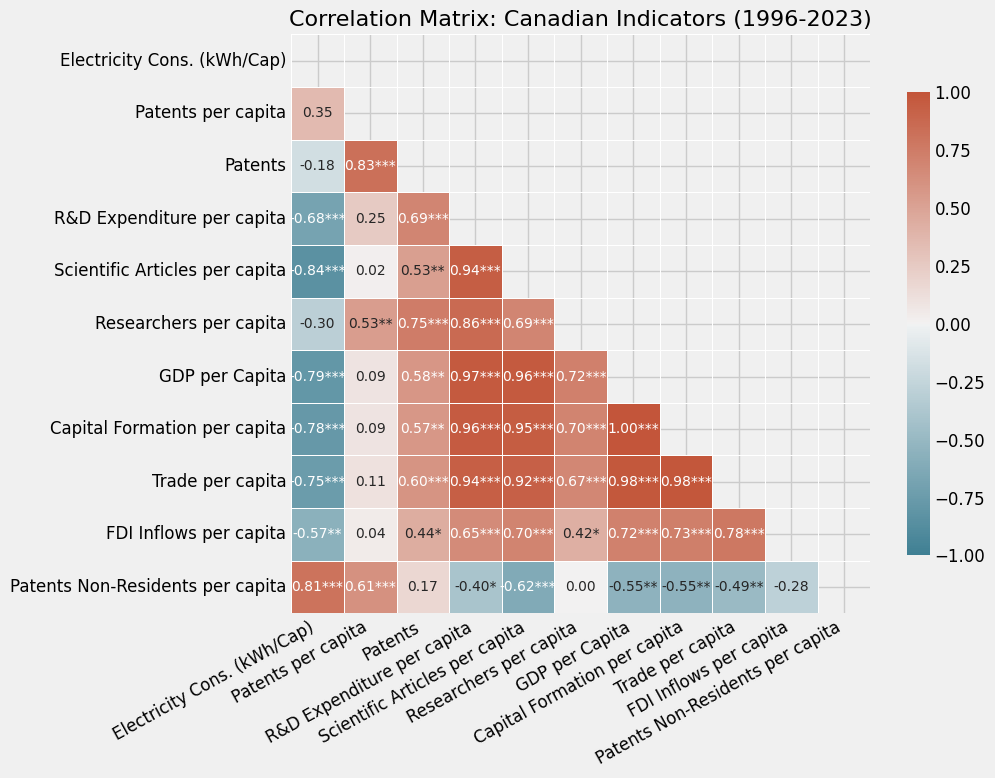

In [ ]:
# CA Correlation Analysis
print("-- CA Correlation Analysis --")
if len(canada_indicators_dfs) >= 2:
    try:
        corr_year_range = (1996, 2023)
        canada_corr_matrix, canada_corr_data = robust_correlation_analysis(
            canada_indicators_dfs,
            canada_indicator_names,
            min_periods=5, #min overlap yrs
            year_range=corr_year_range
        )
        print(f"\nCorrelation Matrix (CA, {corr_year_range[0]}-{corr_year_range[1]}):")
        styled_corr = canada_corr_matrix.style.format("{:.2f}").background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
        try:
            display(styled_corr)
        except NameError:
            print(canada_corr_matrix.round(2))
        plt.figure(figsize=(10, 8))
        mask = np.triu(np.ones_like(canada_corr_matrix, dtype=bool))
        cmap = sns.diverging_palette(220, 20, as_cmap=True)
        annot_labels = canada_corr_matrix.astype(str).copy()
        n_obs_approx = len(canada_corr_data.dropna(how='all'))
        p_critical = 0.05
        for i in range(len(canada_corr_matrix)):
            for j in range(len(canada_corr_matrix)):
                r = canada_corr_matrix.iloc[i, j]
                if i == j:
                     annot_labels.iloc[i, j] = "1.00"
                     continue
                if pd.isna(r):
                     annot_labels.iloc[i, j] = "N/A"
                     continue
                #calc pairwise N for p-val
                pairwise_data = canada_corr_data[[canada_corr_matrix.columns[i], canada_corr_matrix.columns[j]]].dropna()
                n_pairwise = len(pairwise_data)
                if n_pairwise < 3:
                     p_value = 1.0
                else:
                     try:
                         corr_coeff, p_value = stats.pearsonr(pairwise_data.iloc[:, 0], pairwise_data.iloc[:, 1])
                     except Exception:
                         p_value = 1.0
                stars = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < p_critical else ""
                annot_labels.iloc[i, j] = f"{r:.2f}{stars}"
        sns.heatmap(canada_corr_matrix,
                    annot=annot_labels,
                    cmap=cmap,
                    vmin=-1, vmax=1,
                    fmt='',
                    mask=mask,
                    square=True,
                    linewidths=0.5,
                    cbar_kws={"shrink": 0.8},
                    annot_kws={"size": 10})
        plt.title(f'Correlation Matrix: Canadian Indicators ({corr_year_range[0]}-{corr_year_range[1]})', fontsize=16)
        plt.xticks(rotation=29, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        save_path = output_dir / "canada_correlation_matrix.png"
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
    except ValueError as ve:
         print(f"Skipping cor. analysis: {ve}")

***Interpretation:***
The results are mixed and partially counter-intuitive compared to a simple expectation that higher energy use always accompanies higher innovation output.

The strong negative correlations with R&D expenditure and scientific articles are particularly noteworthy and unexpected. To try understand this further you can look back at the time series plots in the EDA section to observe the trends over time of some of the indicators investigated. The declining energy consumption Canada has experienced while other indicators remaining more stable or even increasing slightly is what would have led to the negative statistical relationships obseerved. This could suggest some decoupling or shifts in the fundamental structure of the economy. Additionally as time goes on production and experimentation methodologies become more efficient and use less electricity so this is an additional factor to help explain the observed negative relations.

The positive significant correlation with patents per capita aligns closely with intuition. As energy is needed for productive activities that lead to patents.

For Canada between 1996-2023, higher per capita electricity use is significantly associated with lower R&D spending and scientific articles per capita, but moderately associated with higher patents per capita. These relationships are strong for R&D and articles but only moderate for patents per capita.



-- CA Scatter Plots (Electricity vs. Innovation) --


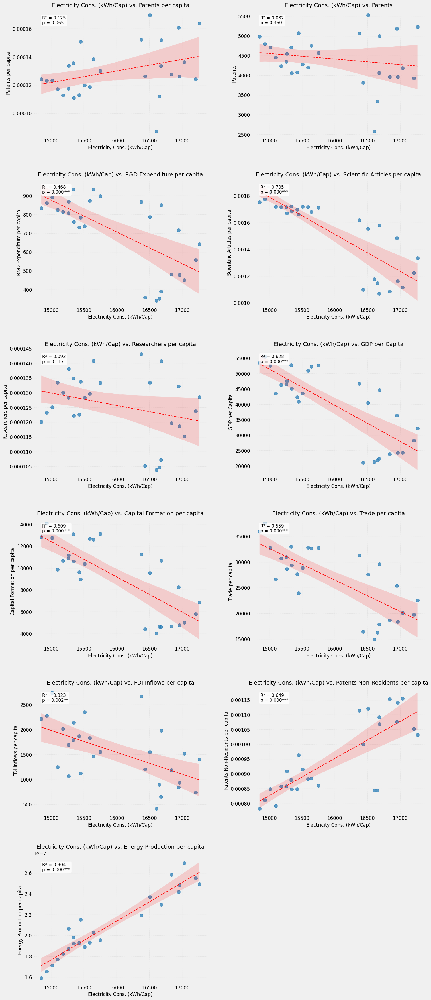

In [ ]:
# CA Scatter Plots (Electricity vs. Innovation)
print("\n-- CA Scatter Plots (Electricity vs. Innovation) --")
if 'canada_corr_data' in locals() and canada_corr_data is not None and not canada_corr_data.empty:
    x_var = 'Electricity Cons. (kWh/Cap)'
    if x_var not in canada_corr_data.columns:
         print(f"Error: X-variable '{x_var}' not found in correlation data for scatter plots.")
    else:
        present_innovation_metrics = [
            name for name in canada_indicator_names
            if name != x_var and name in canada_corr_data.columns
        ]
        num_plots = len(present_innovation_metrics)
        if num_plots > 0:
            n_cols = 2
            n_rows = (num_plots + n_cols - 1) // n_cols
            fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows), squeeze=False)
            axs = axs.flatten() # Flatten to 1D array for easy indexing
            plot_idx = 0
            for y_var in present_innovation_metrics:
                 ax = axs[plot_idx]
                 valid_data = canada_corr_data[[x_var, y_var]].dropna()
                 if len(valid_data) > 1: # min 2 points for regplot
                      sns.regplot(x=x_var, y=y_var, data=valid_data, ax=ax,
                                line_kws={"color":"red", "lw":1.5, "linestyle":"--"},
                                scatter_kws={"color": "#1f77b4", "s": 70, "alpha": 0.7})
                      try:
                            slope, intercept, r_value, p_value, std_err = stats.linregress(valid_data[x_var], valid_data[y_var])
                            stars = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
                            ax.text(0.05, 0.95, f"R² = {r_value**2:.3f}\np = {p_value:.3f}{stars}",
                                  transform=ax.transAxes, fontsize=11, verticalalignment='top',
                                  bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
                      except ValueError as e:
                           print(f"Linregress failed for {y_var}: {e}")
                           ax.text(0.05, 0.95, "Stats N/A", transform=ax.transAxes, fontsize=11, verticalalignment='top')
                      ax.set_title(f'{x_var} vs. {y_var}', fontsize=14)
                      ax.set_xlabel(x_var, fontsize=12)
                      ax.set_ylabel(y_var, fontsize=12)
                      ax.grid(True, alpha=0.3, linestyle=':')
                      plot_idx += 1
                 else:
                      ax.text(0.5, 0.5, "Not enough data", horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, color='red')
                      ax.set_title(f'{x_var} vs. {y_var}', fontsize=14)
                      plot_idx += 1
            for i in range(plot_idx, len(axs)):
                 fig.delaxes(axs[i])
            plt.tight_layout(pad=3.0)
            save_path = output_dir / "canada_electricity_innovation_scatterplots.png"
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            plt.show()

*Interpretation:*

Negative Slopes (Higher elec. consumption associated with lower indicator):

Some Negative indicators include:
Scientific Articles per capita, Researchers per capita, GDP per Capita, FDI Inflows per capita.

Positive Slopes (Higher elec. consumption associated with higher indicator):

Some Positive indicators include:
Patents per capita, Patents Non-Residents per capita, Energy Production per capita.


Negative: Patents (R²=0.032, p=0.360), Researchers (R²=0.092, p=0.117).

Positive: Patents per capita (R²=0.125, p=0.065 - marginally non-significant at α=0.05).

For R&D Expenditure and FDI Inflows, the linear trend captures the general direction but is unreliable due to the significant scatter seen. This indicates either that other factors are contributing more significantly or the relationship may not be linear.

Surprising points including that for R&D expenditure there are points with high electricity consumption but low R&D.

Summary Alignment:
The strong negative relationships between electricity and Scientific Articles/GDP/Capital/Trade/R&D are apparent. The strong positive relations with energy production and Patents of non-residents are also depicted clearly. However due to lower significance observed and the degree of scatter of the points, several indicators need further analysis which is where a multivariate analysis is a powerful tool.



-- CA Multivariate Regression Modeling (Electricity + Controls -> Innovation) --
Note: Using base data for Electricity Cons. (kWh/Cap) in regression.
Running multivariate regression with 'Electricity Cons. (kWh/Cap)' as primary predictor.
Controls: GDP per Capita, gross_capital_formation_absolute_pc

--- Regression Analysis ---
Independent Variable (X): Electricity Cons. (kWh/Cap)
Control Variables: GDP per Capita, gross_capital_formation_absolute_pc
Lag applied to Electricity Cons. (kWh/Cap): 0 years
---------------------------------------------------------
Model Summary for Electricity Cons. (kWh/Cap):
  Observations: 63
  Model Fit: R²=0.992, Adj. R²=0.991, F-test p=1.48e-61
  Effect of 'Electricity Cons. (kWh/Cap)': Coef=0.0238*** (p=0.000)
  Note: High Condition Number (1.75e+05), check multicollinearity.
----------------------------------------
Model Summary for Patents per capita:
  Observations: 44
  Model Fit: R²=0.626, Adj. R²=0.598, F-test p=1.19e-08
  Effect of 'Electricit

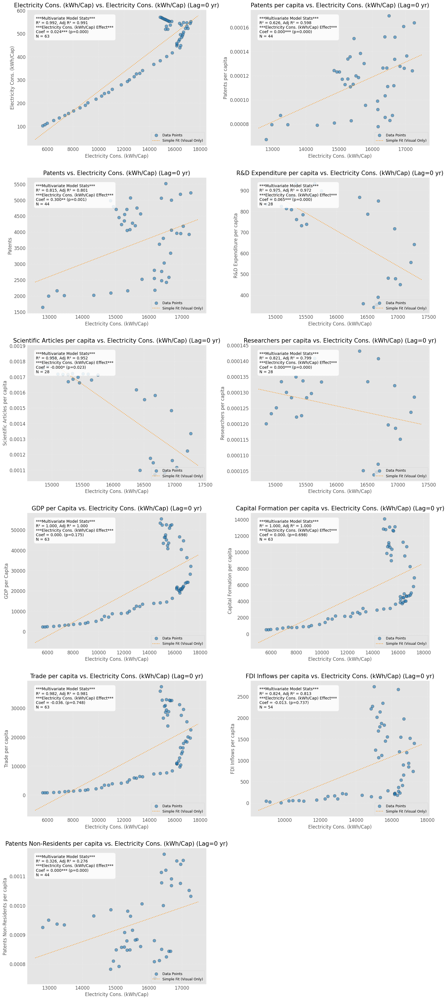

Full regression summaries saved to: /content/drive/MyDrive/MIE1624 Group Project/Group Project/energy_output/canada_multivariate_regression_lag0_full_summaries.txt

Multivariate Regression Summary (Focus on Electricity Cons. Coefficient):


,Dependent,Controls,Observations,X_Coefficient,X_StdErr,X_p_value,Significance
0,Electricity Cons. (kWh/Cap),"GDP per Capita, gross_capital_formation_absolute_pc",63,0.0238,0.0010,0.000,***
1,Patents per capita,"GDP per Capita, gross_capital_formation_absolute_pc",44,0.0000,0.0000,0.000,***
2,Patents,"GDP per Capita, gross_capital_formation_absolute_pc",44,0.2998,0.0845,0.001,**
3,R&D Expenditure per capita,"GDP per Capita, gross_capital_formation_absolute_pc",28,0.0653,0.0132,0.000,***
4,Scientific Articles per capita,"GDP per Capita, gross_capital_formation_absolute_pc",28,-0.0000,0.0000,0.023,*
5,Researchers per capita,"GDP per Capita, gross_capital_formation_absolute_pc",28,0.0000,0.0000,0.000,***
6,GDP per Capita,"GDP per Capita, gross_capital_formation_absolute_pc",63,0.0000,0.0000,0.175,
7,Capital Formation per capita,"GDP per Capita, gross_capital_formation_absolute_pc",63,0.0000,0.0000,0.698,
8,Trade per capita,"GDP per Capita, gross_capital_formation_absolute_pc",63,-0.0365,0.1128,0.748,
9,FDI Inflows per capita,"GDP per Capita, gross_capital_formation_absolute_pc",54,-0.0127,0.0376,0.737,


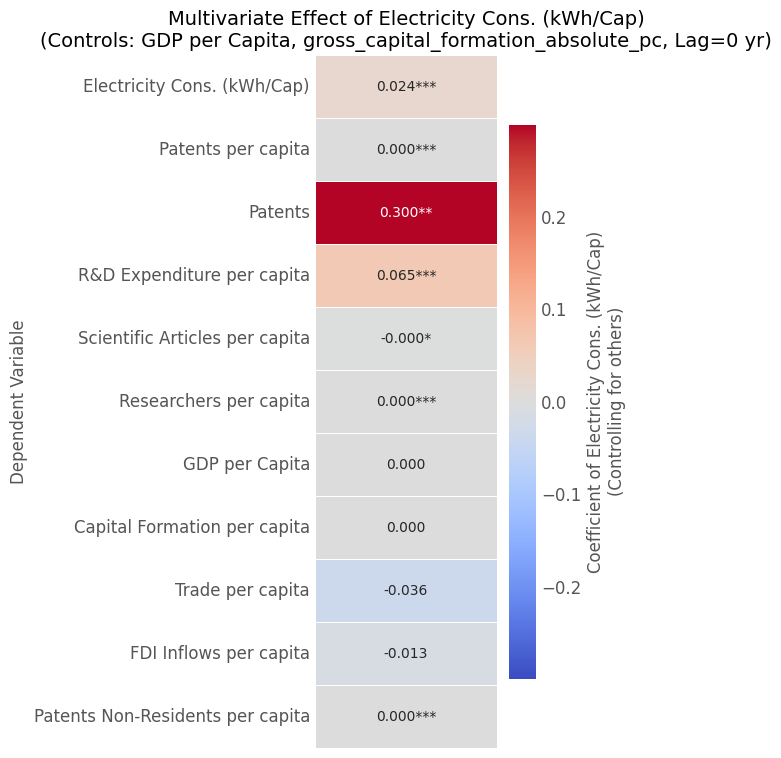

In [ ]:
print("\n-- CA Multivariate Regression Modeling (Electricity + Controls -> Innovation) --")
x_df_reg = canada_data.get('electricity_pc')
x_name_reg = 'Electricity Cons. (kWh/Cap)'
y_dfs_for_reg = []
y_names_for_reg = []
for name, df in zip(canada_indicator_names, canada_indicators_dfs):
    if name != x_name_reg:
        y_dfs_for_reg.append(df)
        y_names_for_reg.append(name)
    else:
        base_name_map = {
              'Scientific Articles (per Million)': 'scientific_articles',
              'Patents (per Million)': 'patents',
              'Electricity Cons. (kWh/Cap)': 'electricity'
        }
        base_name = base_name_map.get(name, name)
        y_df_candidate_base = canada_data.get(base_name)
        if y_df_candidate_base is not None and not y_df_candidate_base.empty:
            y_dfs_for_reg.append(y_df_candidate_base)
            y_names_for_reg.append(name)
            print(f"Note: Using base data for {name} in regression.")
        else:
            print(f"Warning: Skipping {name} in regression - Data not found.")

multivariate_regression_results_df = pd.DataFrame()
sim_models_multivariate = {}
sim_coeffs_multivariate = {}
sim_pvalues_multivariate = {}
if x_df_reg is not None and not x_df_reg.empty and 'y_dfs_for_reg' in locals() and y_dfs_for_reg:
    print(f"Running multivariate regression with '{x_name_reg}' as primary predictor.")
    if final_control_names:
        print(f"Controls: {', '.join(final_control_names)}")
    else:
        print("No control variables being used.")
    lag_to_test = 0
    multivariate_regression_results_df = create_visualize_regression_models(
        X_df=x_df_reg,
        X_name=x_name_reg,
        y_dfs=y_dfs_for_reg,
        y_names=y_names_for_reg,
        control_dfs=final_control_dfs,
        control_names=final_control_names,
        lag_years=lag_to_test,
        save_filename_base="canada_multivariate_regression"
    )
    if not multivariate_regression_results_df.empty:
         print("\nMultivariate Regression Summary (Focus on Electricity Cons. Coefficient):")
         cols_to_show = ['Dependent', 'Controls', 'Observations', 'X_Coefficient', 'X_StdErr', 'X_p_value']
         summary_display = multivariate_regression_results_df[cols_to_show].copy()
         summary_display['Significance'] = summary_display['X_p_value'].apply(
             lambda p: "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "." if p < 0.10 else ""
         )
         format_dict = {'X_Coefficient': '{:.4f}', 'X_StdErr': '{:.4f}', 'X_p_value': '{:.3f}'}
         styled_summary = summary_display.style.format(format_dict)
         try:
              display(styled_summary)
         except NameError:
              print(summary_display.to_string(formatters=format_dict))

         plot_multivariate_effect_heatmap(
             results_df=multivariate_regression_results_df,
             x_name=x_name_reg,
             controls_list=final_control_names,
             lag=lag_to_test,
             save_filename="canada_multivariate_regression",
             output_dir=output_dir
         )
         for index, row in multivariate_regression_results_df.iterrows():
             y_name = row['Dependent']
             y_df_sim_index = y_names_for_reg.index(y_name) if y_name in y_names_for_reg else -1
             if y_df_sim_index != -1:
                 y_df_sim = y_dfs_for_reg[y_df_sim_index]
                 simple_model_for_sim, _ = create_regression_model(x_df_reg, y_df_sim, lag_years=lag_to_test)
                 if simple_model_for_sim:
                     sim_models_multivariate[y_name] = simple_model_for_sim
                     sim_coeffs_multivariate[y_name] = row['X_Coefficient']
                     sim_pvalues_multivariate[y_name] = row['X_p_value']
                 else:
                     print(f"Warning: Could not re-create simple model structure for {y_name}, skipping for simulation.")
             else:
                  print(f"Warning: Could not find original y_df for {y_name}, skipping for simulation.")
    else:
        print("\nMultivariate regression modeling did not produce results.")
else:
    missing_reg = []
    if x_df_reg is None or x_df_reg.empty: missing_reg.append("X variable")
    if 'y_dfs_for_reg' not in locals() or not y_dfs_for_reg: missing_reg.append("Y variables")
    if not final_control_names: print("Note: Proceeding without control variables.")
    if missing_reg: print(f"Skipping multivariate regression modeling: Input data missing ({', '.join(missing_reg)}).")

***Interpretation:***
This multivariate analysis involves examining the impact of electricity consumption (kWh/cap) with no lags (0) while controlling for GDP and capital formation per capita. It reveals positive and significant associations with current levels of Patents, R&D Expenditure, and Researchers per capita in Canada. In this example no lags were used meaning that we assumed or examined an immediate reaction between the change of electricity consumption and the dependent variables. In reality this is unlikely to be the case but was good to set a baseline for analysis. The relationship with scientific articles is negative and not highly significant, while Trade and FDI show no significant link to past energy consumption in this controlled model. This then indicates diverse drivers for different aspects of the economy and innovation system.


-- CA Multivariate Regression Modeling w/ Lag 4 Yrs (Electricity + Controls -> Innovation) --
Note: Using base data for Electricity Cons. (kWh/Cap) in regression.
Running multivariate regression with 'Electricity Cons. (kWh/Cap)' as primary predictor.
Controls: GDP per Capita, gross_capital_formation_absolute_pc

--- Regression Analysis ---
Independent Variable (X): Electricity Cons. (kWh/Cap)
Control Variables: GDP per Capita, gross_capital_formation_absolute_pc
Lag applied to Electricity Cons. (kWh/Cap): 4 years
---------------------------------------------------------
Model Summary for Electricity Cons. (kWh/Cap):
  Observations: 60
  Model Fit: R²=0.980, Adj. R²=0.979, F-test p=1.74e-47
  Effect of 'Electricity Cons. (kWh/Cap)': Coef=0.0251*** (p=0.000)
  Note: High Condition Number (1.95e+05), check multicollinearity.
----------------------------------------
Model Summary for Patents per capita:
  Observations: 44
  Model Fit: R²=0.688, Adj. R²=0.665, F-test p=3.2e-10
  Effect of

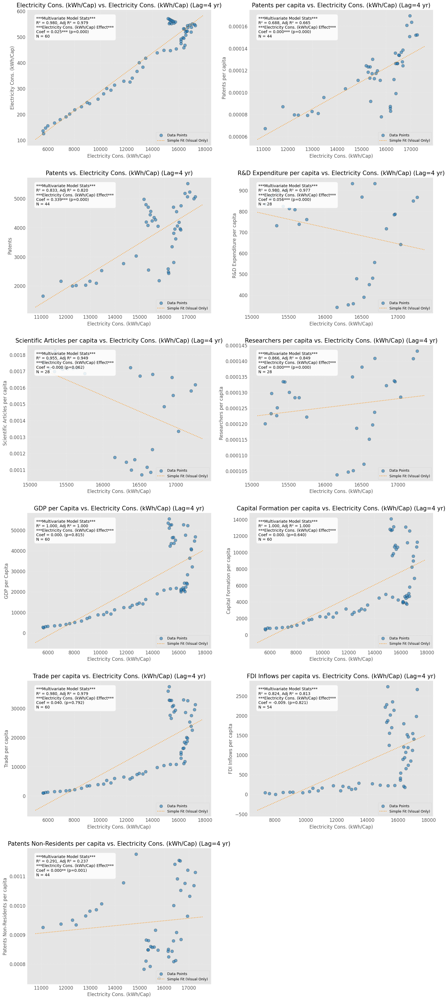

Full regression summaries saved to: /content/drive/MyDrive/MIE1624 Group Project/Group Project/energy_output/canada_multivariate_regression_lag4_full_summaries.txt

Multivariate Regression Summary (Focus on Electricity Cons. Coefficient):


,Dependent,Controls,Observations,X_Coefficient,X_StdErr,X_p_value,Significance
0,Electricity Cons. (kWh/Cap),"GDP per Capita, gross_capital_formation_absolute_pc",60,0.0251,0.0019,0.000,***
1,Patents per capita,"GDP per Capita, gross_capital_formation_absolute_pc",44,0.0000,0.0000,0.000,***
2,Patents,"GDP per Capita, gross_capital_formation_absolute_pc",44,0.3390,0.0796,0.000,***
3,R&D Expenditure per capita,"GDP per Capita, gross_capital_formation_absolute_pc",28,0.0559,0.0094,0.000,***
4,Scientific Articles per capita,"GDP per Capita, gross_capital_formation_absolute_pc",28,-0.0000,0.0000,0.062,.
5,Researchers per capita,"GDP per Capita, gross_capital_formation_absolute_pc",28,0.0000,0.0000,0.000,***
6,GDP per Capita,"GDP per Capita, gross_capital_formation_absolute_pc",60,0.0000,0.0000,0.815,
7,Capital Formation per capita,"GDP per Capita, gross_capital_formation_absolute_pc",60,0.0000,0.0000,0.640,
8,Trade per capita,"GDP per Capita, gross_capital_formation_absolute_pc",60,0.0402,0.1513,0.792,
9,FDI Inflows per capita,"GDP per Capita, gross_capital_formation_absolute_pc",54,-0.0094,0.0414,0.821,


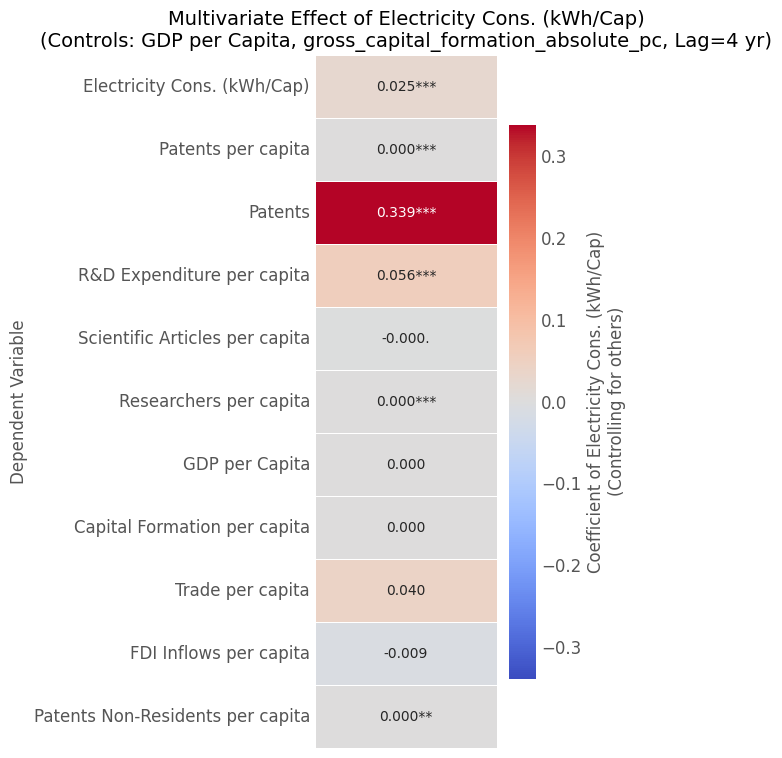

In [ ]:
print("\n-- CA Multivariate Regression Modeling w/ Lag 4 Yrs (Electricity + Controls -> Innovation) --")
x_df_reg = canada_data.get('electricity_pc')
x_name_reg = 'Electricity Cons. (kWh/Cap)'
y_dfs_for_reg = []
y_names_for_reg = []
for name, df in zip(canada_indicator_names, canada_indicators_dfs):
    if name != x_name_reg:
        y_dfs_for_reg.append(df)
        y_names_for_reg.append(name)
    else:
        base_name_map = {
              'Scientific Articles (per Million)': 'scientific_articles',
              'Patents (per Million)': 'patents',
              'Electricity Cons. (kWh/Cap)': 'electricity'
        }
        base_name = base_name_map.get(name, name)
        y_df_candidate_base = canada_data.get(base_name)
        if y_df_candidate_base is not None and not y_df_candidate_base.empty:
            y_dfs_for_reg.append(y_df_candidate_base)
            y_names_for_reg.append(name)
            print(f"Note: Using base data for {name} in regression.")
        else:
            print(f"Warning: Skipping {name} in regression - Data not found.")

multivariate_regression_results_df = pd.DataFrame()
sim_models_multivariate = {}
sim_coeffs_multivariate = {}
sim_pvalues_multivariate = {}
if x_df_reg is not None and not x_df_reg.empty and 'y_dfs_for_reg' in locals() and y_dfs_for_reg:
    print(f"Running multivariate regression with '{x_name_reg}' as primary predictor.")
    if final_control_names:
        print(f"Controls: {', '.join(final_control_names)}")
    lag_to_test = 4
    multivariate_regression_results_df = create_visualize_regression_models(
        X_df=x_df_reg,
        X_name=x_name_reg,
        y_dfs=y_dfs_for_reg,
        y_names=y_names_for_reg,
        control_dfs=final_control_dfs,
        control_names=final_control_names,
        lag_years=lag_to_test,
        save_filename_base="canada_multivariate_regression"
    )
    if not multivariate_regression_results_df.empty:
         print("\nMultivariate Regression Summary (Focus on Electricity Cons. Coefficient):")
         cols_to_show = ['Dependent', 'Controls', 'Observations', 'X_Coefficient', 'X_StdErr', 'X_p_value']
         summary_display = multivariate_regression_results_df[cols_to_show].copy()
         summary_display['Significance'] = summary_display['X_p_value'].apply(
             lambda p: "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "." if p < 0.10 else ""
         )
         format_dict = {'X_Coefficient': '{:.4f}', 'X_StdErr': '{:.4f}', 'X_p_value': '{:.3f}'}
         styled_summary = summary_display.style.format(format_dict)
         try:
              display(styled_summary)
         except NameError:
              print(summary_display.to_string(formatters=format_dict))
         plot_multivariate_effect_heatmap(
             results_df=multivariate_regression_results_df,
             x_name=x_name_reg,
             controls_list=final_control_names,
             lag=lag_to_test,
             save_filename="canada_multivariate_regression",
             output_dir=output_dir
         )
         for index, row in multivariate_regression_results_df.iterrows():
             y_name = row['Dependent']
             y_df_sim_index = y_names_for_reg.index(y_name) if y_name in y_names_for_reg else -1
             if y_df_sim_index != -1:
                 y_df_sim = y_dfs_for_reg[y_df_sim_index]
                 simple_model_for_sim, _ = create_regression_model(x_df_reg, y_df_sim, lag_years=lag_to_test)
                 if simple_model_for_sim:
                     sim_models_multivariate[y_name] = simple_model_for_sim
                     sim_coeffs_multivariate[y_name] = row['X_Coefficient']
                     sim_pvalues_multivariate[y_name] = row['X_p_value']
                 else:
                     print(f"Warning: Could not re-create simple model structure for {y_name}, skipping for simulation.")
             else:
                  print(f"Warning: Could not find original y_df for {y_name}, skipping for simulation.")
    else:
        print("\nMultivariate regression modeling did not produce results.")
else:
    missing_reg = []
    if x_df_reg is None or x_df_reg.empty: missing_reg.append("X variable")
    if 'y_dfs_for_reg' not in locals() or not y_dfs_for_reg: missing_reg.append("Y variables")
    if not final_control_names: print("Note: Proceeding without control variables.")
    if missing_reg: print(f"Skipping multivariate regression modeling: Input data missing ({', '.join(missing_reg)}).")

***Interpretation:***
In this example we examined the impact of electricity consumption (kWh/cap) from 4 years prior while maintaining the same control variables. It revealed that lagging the relationships led to stronger coefficient for patents and making it more significant. Additionally trade per capita shifted from a slighly negative relation to a slightly positive although the significance remained low.  This lagged relationship was explored to see if higher coefficients among variables would arise, as we know that the outcomes of increased energy usage might not be immediately apparent.

<a name="policy-4-simulation"></a>
## **5.5 Advanced Policy Simulation (Canada)**

This section uses the relationships explored above to simulate the potential impact of different future energy policy scenarios on Canadian innovation outcomes.

The simulation projects key innovation indicators and estimates the potential downstream economic impacts based on the preliminary Patents-GDP link.


In [ ]:
class SimplifiedPolicySimulator:
    """
    Simulates innovation metrics based on simplified energy scenarios.
    Uses simple OLS models (Innovation Metric ~ Energy Consumption)
    to project outcomes based on deterministic future energy pathways.
    Scenarios are defined by deviations from a baseline energy growth rate.
    Uncertainty is estimated using prediction intervals from the provided OLS models.
    """
    def __init__(self,
                 base_year: int,
                 projection_years: int = 7,
                 baseline_energy_growth_rate: float = 0.01,
                 ci_alpha: float = 0.10):
        """
        Initializes the simulator.
        """
        if not isinstance(base_year, int) or base_year <= 1900:
            raise ValueError("base_year must be a valid year integer.")
        if not isinstance(projection_years, int) or projection_years <= 0:
            raise ValueError("projection_years must be a positive integer.")
        if not isinstance(baseline_energy_growth_rate, (int, float)):
             raise ValueError("baseline_energy_growth_rate must be numeric.")
        if not 0 < ci_alpha < 1:
             raise ValueError("ci_alpha must be between 0 and 1.")

        self.base_year = base_year
        self.projection_years = projection_years
        self.num_proj_points = projection_years + 1
        self.baseline_energy_growth_rate = baseline_energy_growth_rate
        self.ci_alpha = ci_alpha
        try:
            self.z_score = stats.norm.ppf(1 - self.ci_alpha / 2)
        except Exception as e:
            warnings.warn(f"Could not calculate z-score for CI, defaulting to 1.645 (90% CI): {e}")
            self.z_score = 1.645

        self.scenarios: Dict[str, float] = {}
        self.results: Dict[str, pd.DataFrame] = {}
        self.historical_energy_df: Optional[pd.DataFrame] = None
        self.simple_models: Dict[str, sm.regression.linear_model.RegressionResultsWrapper] = {}
        self.latest_innovation_values: Dict[str, float] = {}
        self.latest_energy_value: Optional[float] = None
        self.projection_years_index: Optional[pd.Index] = None

        print(f"SimplifiedPolicySimulator initialized:")
        print(f"  Base Year: {self.base_year}")
        print(f"  Projection Horizon: {self.projection_years} years (up to {self.base_year + self.projection_years})")
        print(f"  Baseline Energy Growth Rate: {self.baseline_energy_growth_rate:.2%}")
        print(f"  Prediction Interval: {(1 - self.ci_alpha):.0%} (alpha={self.ci_alpha})")


    def _project_energy(self, scenario_deviation_rate: float) -> np.ndarray:
        """
        Generates a deterministic energy pathway for scenarios.
        """
        if self.latest_energy_value is None:
             raise RuntimeError("Latest energy value not set. Run `prepare_inputs` first.")

        effective_growth_rate = self.baseline_energy_growth_rate + scenario_deviation_rate
        growth_factor = 1.0 + effective_growth_rate
        energy_pathway = np.zeros(self.num_proj_points)
        energy_pathway[0] = self.latest_energy_value

        for i in range(1, self.num_proj_points):
            energy_pathway[i] = energy_pathway[i-1] * growth_factor

        energy_pathway = np.maximum(energy_pathway, 0)
        return energy_pathway

    def _project_innovation(self,
                           metric_name: str,
                           energy_pathway: np.ndarray
                           ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Projects an innovation metric based on energy pathway w/ OLS model.
        """
        if metric_name not in self.simple_models:
            raise KeyError(f"No OLS model found for metric: {metric_name}")
        if metric_name not in self.latest_innovation_values:
             raise KeyError(f"No latest historical value found for metric: {metric_name}")

        model = self.simple_models[metric_name]
        latest_value = self.latest_innovation_values[metric_name]
        X_pred_input = sm.add_constant(energy_pathway, has_constant='add')
        try:
            mean_pred = model.predict(X_pred_input)
            prstd, _, _ = wls_prediction_std(model, X_pred_input, alpha=self.ci_alpha)
            prstd = np.maximum(prstd, 0)
            half_interval = self.z_score * prstd

            lower_bound = mean_pred - half_interval
            upper_bound = mean_pred + half_interval
            mean_pred[0] = latest_value
            lower_bound[0] = latest_value
            upper_bound[0] = latest_value
            if (latest_value >= 0) and ('GDP' not in metric_name):
                 mean_pred = np.maximum(mean_pred, 0)
                 lower_bound = np.maximum(lower_bound, 0)

            return mean_pred, lower_bound, upper_bound

        except Exception as e:
            warnings.warn(f"Error predicting or calculating intervals for {metric_name}: {e}. Returning NaNs.")
            nan_array = np.full(self.num_proj_points, np.nan)
            nan_array[0] = latest_value
            return nan_array, nan_array.copy(), nan_array.copy()


    def run(self,
            historical_energy_df: pd.DataFrame,
            simple_ols_models: Dict[str, sm.regression.linear_model.RegressionResultsWrapper],
            latest_innovation_values: Dict[str, float],
            scenarios: Dict[str, float]):
        """
        Runs the simulation for all scenarios and metrics.
        """
        # -- Input Val --
        if not isinstance(historical_energy_df, pd.DataFrame) or historical_energy_df.empty:
             raise ValueError("historical_energy_df must be a non-empty DataFrame.")
        if 'REF_DATE' not in historical_energy_df.columns or 'VALUE' not in historical_energy_df.columns:
             raise ValueError("historical_energy_df must contain 'REF_DATE' and 'VALUE' columns.")
        if not isinstance(simple_ols_models, dict) or not simple_ols_models:
             raise ValueError("simple_ols_models must be a non-empty dictionary.")
        if not isinstance(latest_innovation_values, dict) or not latest_innovation_values:
             raise ValueError("latest_innovation_values must be a non-empty dictionary.")
        if not isinstance(scenarios, dict) or not scenarios:
            raise ValueError("scenarios must be a non-empty dictionary.")
        if 'Baseline' not in scenarios:
             warnings.warn("Scenarios dictionary should ideally include a 'Baseline' entry (e.g., with deviation 0.0).")

        #keys match between models & latest vals
        if set(simple_ols_models.keys()) != set(latest_innovation_values.keys()):
            warnings.warn("Mismatch between keys in simple_ols_models and latest_innovation_values. Only overlapping metrics will be processed.")
            common_metrics = list(set(simple_ols_models.keys()) & set(latest_innovation_values.keys()))
            if not common_metrics:
                 raise ValueError("No common metrics found between models and latest values.")
            self.simple_models = {k: simple_ols_models[k] for k in common_metrics}
            self.latest_innovation_values = {k: latest_innovation_values[k] for k in common_metrics}
        else:
            self.simple_models = simple_ols_models
            self.latest_innovation_values = latest_innovation_values
        self.scenarios = scenarios

        try:
             energy_df_sorted = historical_energy_df.sort_values('REF_DATE').copy()
             energy_df_sorted['REF_DATE'] = pd.to_datetime(energy_df_sorted['REF_DATE'])
             self.historical_energy_df = energy_df_sorted[energy_df_sorted['REF_DATE'].dt.year <= self.base_year]
             if self.historical_energy_df.empty:
                  raise ValueError(f"No historical energy data found at or before base_year {self.base_year}.")
             latest_energy_row = self.historical_energy_df.iloc[-1]
             actual_latest_year = latest_energy_row['REF_DATE'].year

             if actual_latest_year != self.base_year:
                  warnings.warn(f"Latest energy data is from {actual_latest_year}, not {self.base_year}. Using {actual_latest_year} as effective base year for simulation start.")
                  self.base_year = actual_latest_year # Adjust base year to actual data

             self.latest_energy_value = latest_energy_row['VALUE']
             if pd.isna(self.latest_energy_value):
                 raise ValueError("Latest energy value is NaN.")

             proj_years_list = list(range(self.base_year, self.base_year + self.num_proj_points))
             self.projection_years_index = pd.Index(proj_years_list, name="Year")

        except Exception as e:
             print(f"Error preparing energy data: {e}")
             raise

        # -- Sim Loops --
        print(f"\nRunning simulation from {self.base_year} to {self.projection_years_index.max()}...")
        self.results = {}
        processed_metrics = list(self.simple_models.keys())
        for metric_name in processed_metrics:
            print(f"  Simulating: {metric_name}")
            model = self.simple_models[metric_name]
            if not isinstance(model, sm.regression.linear_model.RegressionResultsWrapper):
                warnings.warn(f"Skipping {metric_name}: Invalid model object provided.")
                continue
            metric_results_dict = {}
            for scenario_name, scenario_deviation in self.scenarios.items():
                 try:
                    energy_path = self._project_energy(scenario_deviation)
                    preds, lowers, uppers = self._project_innovation(metric_name, energy_path)
                    metric_results_dict[scenario_name] = preds
                    metric_results_dict[f"{scenario_name}_lower"] = lowers
                    metric_results_dict[f"{scenario_name}_upper"] = uppers
                 except Exception as e:
                     warnings.warn(f"Failed simulation for Metric '{metric_name}', Scenario '{scenario_name}': {e}")
                     nan_array = np.full(self.num_proj_points, np.nan)
                     metric_results_dict[scenario_name] = nan_array
                     metric_results_dict[f"{scenario_name}_lower"] = nan_array.copy()
                     metric_results_dict[f"{scenario_name}_upper"] = nan_array.copy()
            try:
                 proj_df = pd.DataFrame(metric_results_dict, index=self.projection_years_index)
                 self.results[metric_name] = proj_df
            except Exception as df_err:
                 warnings.warn(f"Error creating DataFrame for {metric_name}: {df_err}")
                 self.results[metric_name] = pd.DataFrame(index=self.projection_years_index) # Empty DF
        print("Simulation run complete.")
        return self.results


    def visualize(self,
                  historical_innovation_dfs: Dict[str, pd.DataFrame],
                  output_filename: str = "simplified_innovation_projections.png"):

        if not self.results:
            print("No simulation results available to visualize. Run `simulate()` first.")
            return
        if not isinstance(historical_innovation_dfs, dict):
            print("Warning: historical_innovation_dfs is not a dictionary. Cannot plot history.")
            historical_innovation_dfs = {}

        n_metrics = len(self.results)
        if n_metrics == 0:
             print("No metrics found in simulation results.")
             return

        n_rows = (n_metrics + 1) // 2
        n_cols = min(n_metrics, 2)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows), squeeze=False)
        axs = axs.flatten()
        scenario_colors = plt.get_cmap('coolwarm', len(self.scenarios))
        scenario_styles = ['-', '--', '-.', ':']
        metric_names = list(self.results.keys())
        for i, metric_name in enumerate(metric_names):
            ax = axs[i]
            projection_df = self.results[metric_name]
            if projection_df.empty:
                 ax.text(0.5, 0.5, "No Projection Data", horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
                 ax.set_title(f'{metric_name} - Projections', fontsize=15)
                 continue

            last_hist_year_metric = self.base_year - 1
            if metric_name in historical_innovation_dfs:
                hist_df = historical_innovation_dfs[metric_name]
                if isinstance(hist_df, pd.DataFrame) and not hist_df.empty and 'REF_DATE' in hist_df.columns and 'VALUE' in hist_df.columns:
                    hist_df = hist_df.copy()
                    hist_df['REF_DATE'] = pd.to_datetime(hist_df['REF_DATE'])
                    hist_df_clean = hist_df.dropna(subset=['REF_DATE', 'VALUE']).sort_values('REF_DATE')
                    hist_to_plot = hist_df_clean[hist_df_clean['REF_DATE'].dt.year <= self.base_year]
                    if not hist_to_plot.empty:
                        ax.plot(hist_to_plot['REF_DATE'].dt.year, hist_to_plot['VALUE'],
                                color='black', linewidth=1.5, linestyle=':', marker='.', markersize=4, label='Historical', alpha=0.6)
                        last_hist_year_metric = hist_to_plot['REF_DATE'].dt.year.max()
                else:
                     print(f"Warning: Historical data for {metric_name} is invalid or empty.")
            else:
                 print(f"Warning: No historical data provided for {metric_name}.")
            scenarios_in_df = list(self.scenarios.keys())
            years_proj = projection_df.index
            for j, scenario_name in enumerate(scenarios_in_df):
                if scenario_name not in projection_df.columns:
                     warnings.warn(f"Scenario '{scenario_name}' not found in projection results for '{metric_name}'. Skipping plot.")
                     continue
                mean_col = scenario_name
                lower_col = f"{scenario_name}_lower"
                upper_col = f"{scenario_name}_upper"
                mean_values = projection_df[mean_col]
                lower_values = projection_df.get(lower_col)
                upper_values = projection_df.get(upper_col)
                color = scenario_colors(j / len(scenarios_in_df))
                linestyle = scenario_styles[j % len(scenario_styles)]
                ax.plot(years_proj, mean_values,
                        marker='.', markersize=5, linewidth=1.8, label=scenario_name,
                        color=color, linestyle=linestyle)
            ax.set_title(f'{metric_name} - Projections', fontsize=15)
            ax.set_ylabel(f'{metric_name}', fontsize=12)
            ax.set_xlabel('Year', fontsize=12)
            ax.grid(True, linestyle='-', alpha=0.6)
            ax.legend(fontsize=10, loc='best')
            plot_start_year = max(self.base_year - 15, years_proj.min() - 1)
            ax.set_xlim(left=plot_start_year, right = years_proj.max() + 1)

            all_plotted_vals = []
            if 'hist_to_plot' in locals() and not hist_to_plot.empty:
                 all_plotted_vals.append(hist_to_plot['VALUE'].values)

            proj_cols_to_get = [scen for scen in scenarios_in_df if scen in projection_df.columns]
            if proj_cols_to_get:
                proj_vals_nd = projection_df[proj_cols_to_get].values
                all_plotted_vals.append(proj_vals_nd.flatten())

            if all_plotted_vals:
                flat_vals = np.concatenate(all_plotted_vals)
                flat_vals = flat_vals[~np.isnan(flat_vals)]

                if len(flat_vals) > 0 and (flat_vals >= 0).all() and ('GDP' not in metric_name):
                     current_ymin, current_ymax = ax.get_ylim()
                     new_ymax = max(current_ymax, flat_vals.max() * 1.05)
                     ax.set_ylim(bottom=0, top=new_ymax)
        for k in range(i + 1, len(axs)):
             fig.delaxes(axs[k])
        plt.tight_layout(pad=2.0, h_pad=3.0)
        save_path = output_dir / output_filename
        try:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        except Exception as e:
            print(f"Failed to save projection plot {save_path}: {e}")
        plt.show()


    def _calculate_economic_impacts(self,
                                   patent_metric_name: str,
                                   gdp_level_df: pd.DataFrame,
                                   patent_gdp_level_model: sm.regression.linear_model.RegressionResultsWrapper
                                   ) -> Optional[pd.DataFrame]:
        """
        Calculates estimated GDP differences based on patent proj.
        """
        if patent_metric_name not in self.results:
            print(f"Warning: Patent metric '{patent_metric_name}' not found in simulation results. Cannot calculate economic impacts.")
            return None
        if 'Baseline' not in self.scenarios:
            print("Warning: 'Baseline' scenario not found. Cannot calculate relative economic impacts.")
            return None
        if not isinstance(gdp_level_df, pd.DataFrame) or gdp_level_df.empty:
             print("Warning: Historical GDP level DataFrame is missing or empty.")
             return None
        if 'REF_DATE' not in gdp_level_df.columns or 'VALUE' not in gdp_level_df.columns:
             print("Warning: GDP level DataFrame missing 'REF_DATE' or 'VALUE' columns.")
             return None
        if not isinstance(patent_gdp_level_model, sm.regression.linear_model.RegressionResultsWrapper):
             print("Warning: Invalid or missing patent_gdp_level_model.")
             return None
        patent_projections = self.results[patent_metric_name]
        end_year = patent_projections.index.max()

        #extract model params
        try:
            intercept = patent_gdp_level_model.params.get('const', 0)
            predictor_name = next((p for p in patent_gdp_level_model.params.index if p != 'const'), None)
            if predictor_name is None:
                 print("Warning: Could not find predictor coefficient in patent_gdp_level_model.")
                 return None
            patent_coeff = patent_gdp_level_model.params[predictor_name]
            p_value = patent_gdp_level_model.pvalues[predictor_name]
            print(f"Using Patent->GDP Level Model: GDP ~ {patent_coeff:.2f} * {predictor_name} + {intercept:.2f} (p={p_value:.3f})")
            if p_value >= 0.1:
                 print("Note: The relationship in the Patent->GDP Level model is not statistically significant (p>=0.1). Results are highly speculative.")
        except Exception as e:
            print(f"Error extracting parameters from patent_gdp_level_model: {e}")
            return None

        final_patent_levels = {}
        for scenario in self.scenarios:
            if scenario in patent_projections.columns:
                try:
                    final_patent_levels[scenario] = patent_projections.loc[end_year, scenario]
                except KeyError:
                     print(f"Warning: Could not get final patent level for {scenario} in year {end_year}.")
                     return None
            else:
                 print(f"Warning: Scenario '{scenario}' not found in patent projections.")
                 return None

        #est. GDP based on patent levels
        final_gdp_estimates = {}
        for scenario, patent_level in final_patent_levels.items():
             if pd.notna(patent_level):
                  final_gdp_estimates[scenario] = intercept + patent_coeff * patent_level
             else:
                  final_gdp_estimates[scenario] = np.nan

        #calc diff vs base
        baseline_gdp_est = final_gdp_estimates.get('Baseline')
        if baseline_gdp_est is None or pd.isna(baseline_gdp_est):
             print("Warning: Cannot calculate relative impacts - Baseline GDP estimate is missing or NaN.")
             return None

        impacts = []
        for scenario in self.scenarios:
            if scenario == 'Baseline': continue
            scenario_gdp_est = final_gdp_estimates[scenario]
            if pd.isna(scenario_gdp_est):
                 warnings.warn(f"GDP estimate for {scenario} is NaN. Skipping impact calculation.")
                 continue
            gdp_diff_value = scenario_gdp_est - baseline_gdp_est
            gdp_diff_percent = (gdp_diff_value / baseline_gdp_est) * 100 if abs(baseline_gdp_est) > 1e-9 else 0
            impacts.append({
                'Scenario': scenario,
                f'Patent_Level_Proj_{end_year}': final_patent_levels[scenario],
                f'Est_GDP_Level_Proj_{end_year}': scenario_gdp_est,
                f'Est_GDP_Diff_vs_Baseline_{end_year}_Value': gdp_diff_value,
                f'Est_GDP_Diff_vs_Baseline_{end_year}_Percent': gdp_diff_percent,
            })
        print("Economic impact calculation finished (interpret with caution).")
        return pd.DataFrame(impacts)


    def run_and_analyze(self,
                       historical_energy_df: pd.DataFrame,
                       simple_ols_models: Dict[str, sm.regression.linear_model.RegressionResultsWrapper],
                       latest_innovation_values: Dict[str, float],
                       scenarios: Dict[str, float],
                       historical_innovation_dfs: Dict[str, pd.DataFrame],
                       gdp_level_df: Optional[pd.DataFrame] = None,
                       patent_gdp_level_model: Optional[sm.regression.linear_model.RegressionResultsWrapper] = None,
                       patent_metric_name: Optional[str] = None,
                       output_filename_prefix: str = "simplified_policy"
                       ) -> Dict:

        projections = self.run(
            historical_energy_df=historical_energy_df,
            simple_ols_models=simple_ols_models,
            latest_innovation_values=latest_innovation_values,
            scenarios=scenarios
        )
        self.visualize(
            historical_innovation_dfs=historical_innovation_dfs,
            output_filename=f"{output_filename_prefix}_projections.png"
        )
        economic_impacts_df = None
        if gdp_level_df is not None and patent_gdp_level_model is not None and patent_metric_name is not None:
            economic_impacts_df = self._calculate_economic_impacts(
                patent_metric_name=patent_metric_name,
                gdp_level_df=gdp_level_df,
                patent_gdp_level_model=patent_gdp_level_model
            )
            if economic_impacts_df is not None and not economic_impacts_df.empty:
                 print("\n--- Economic Impact Summary (Illustrative) ---")
                 print("Based on projected differences in GDP levels derived from projected patent levels.")
                 try:
                      display(economic_impacts_df.style.format({
                          col: '{:,.2f}' for col in economic_impacts_df.columns if 'Value' in col or 'Level' in col
                      }).format({
                          col: '{:,.2f}%' for col in economic_impacts_df.columns if 'Percent' in col
                      }))
                 except NameError:
                      print(economic_impacts_df.to_string())
            else:
                 print("\nEconomic impact calculation did not produce results.")
        elif gdp_level_df is None:
             print("\nSkipping economic impact calculation: Historical GDP level data not provided.")
        elif patent_gdp_level_model is None:
             print("\nSkipping economic impact calculation: Patent-to-GDP level model not provided.")
        elif patent_metric_name is None:
             print("\nSkipping economic impact calculation: Name of the patent metric was not specified.")
        return {
            'projections': projections,
            'economic_impacts': economic_impacts_df
        }

In [ ]:
if 'datasets' not in locals() or not isinstance(datasets, dict):
      raise NameError("Main 'datasets' dictionary not found. Run data loading first.")
if 'create_regression_model' not in locals() or not callable(create_regression_model):
    raise NameError("'create_regression_model' function not found.")
metrics_map_for_demo = {
      'Patents per capita': 'patents_pc',
      'Scientific Articles per capita': 'scientific_articles_pc',
      'R&D Expenditure per capita': 'rd_expenditure_absolute_pc',
      'Researchers per capita': 'researchers_pc',
      'GDP per capita': 'gdp_pc'
}
demo_models = {}
demo_latest_values = {}
demo_hist_innov_dfs = {}
energy_key = 'electricity_pc'
base_energy_df_all = datasets.get(energy_key)
if base_energy_df_all is None or base_energy_df_all.empty:
    raise ValueError(f"Required energy data '{energy_key}' not found in datasets.")

if 'COUNTRY' in base_energy_df_all.columns:
    can_elec_pc_df = base_energy_df_all[base_energy_df_all['COUNTRY'] == 'Canada'].copy()
    if can_elec_pc_df.empty:
          raise ValueError(f"No data found for Canada in energy dataset '{energy_key}'.")
else:
    warnings.warn(f"Energy dataset '{energy_key}' missing 'COUNTRY' column. Assuming it's only Canada data.")
    can_elec_pc_df = base_energy_df_all.copy()
can_elec_pc_df['REF_DATE'] = pd.to_datetime(can_elec_pc_df['REF_DATE'], errors='coerce')
can_elec_pc_df = can_elec_pc_df.dropna(subset=['REF_DATE', 'VALUE']).sort_values('REF_DATE')
if can_elec_pc_df.empty:
      raise ValueError("Canadian energy data is empty after cleaning.")

for metric_name, dataset_key in metrics_map_for_demo.items():
    print(f"-Processing {metric_name} (from {dataset_key})...")
    metric_df_all = datasets.get(dataset_key)

    if metric_df_all is None or metric_df_all.empty:
        print(f"Warning: Dataset '{dataset_key}' not found or empty. Skipping metric.")
        continue
    if 'COUNTRY' in metric_df_all.columns:
          metric_df_can = metric_df_all[metric_df_all['COUNTRY'] == 'Canada'].copy()
          if metric_df_can.empty:
              print(f"Warning: No data found for Canada in dataset '{dataset_key}'. Skipping metric.")
              continue
    else:
          warnings.warn(f"Metric dataset '{dataset_key}' missing 'COUNTRY' column. Assuming it's only Canada data.")
          metric_df_can = metric_df_all.copy()
    metric_df_can['REF_DATE'] = pd.to_datetime(metric_df_can['REF_DATE'], errors='coerce')
    metric_df_can = metric_df_can.dropna(subset=['REF_DATE', 'VALUE']).sort_values('REF_DATE')
    if metric_df_can.empty:
          print(f"    -> Warning: Canadian data for '{dataset_key}' is empty after cleaning. Skipping metric.")
          continue

    model_simple, data_simple = create_regression_model(
        X_df=can_elec_pc_df,
        y_df=metric_df_can,
        lag_years=4
    )
    if model_simple is not None:
          demo_models[metric_name] = model_simple
          demo_latest_values[metric_name] = metric_df_can['VALUE'].iloc[-1]
          demo_hist_innov_dfs[metric_name] = metric_df_can
          print(f"Model fitted. Latest value: {demo_latest_values[metric_name]:.4f}. Observations used: {model_simple.nobs}")
    else:
          print(f"Failed to fit simple OLS model.")
if not demo_models:
      print("\nError: No simple OLS models were successfully fitted. Cannot run demo simulation.")
      exit()

demo_scenarios = {
    'Baseline': 0.0,
    'Modest Growth': 0.0075,  # Baseline + 0.75%
    'High Growth': 0.02,    # Baseline + 2%
    'Efficiency Gains': -0.01 # Baseline - 1.0%
}
demo_gdp_total_df = datasets.get('gdp')
demo_patent_metric_name = 'Patents per capita'
demo_patent_gdp_model = None

if demo_gdp_total_df is not None and not demo_gdp_total_df.empty and demo_patent_metric_name in demo_hist_innov_dfs:
    pat_hist_df = demo_hist_innov_dfs.get(demo_patent_metric_name)
    if 'COUNTRY' in demo_gdp_total_df.columns:
          gdp_total_can_all = demo_gdp_total_df[demo_gdp_total_df['COUNTRY'] == 'Canada'].copy()
          if gdp_total_can_all.empty:
              print("\nWarning: No Canada data found in TOTAL GDP dataset. Cannot fit illustrative econ model.")
              gdp_total_can_all = pd.DataFrame()
          else:
              gdp_total_can_all['REF_DATE'] = pd.to_datetime(gdp_total_can_all['REF_DATE'])
              gdp_total_can_all = gdp_total_can_all.dropna(subset=['REF_DATE', 'VALUE']).sort_values('REF_DATE')
    else:
          warnings.warn("Total GDP dataset missing 'COUNTRY' column. Assuming Canada data.")
          gdp_total_can_all = demo_gdp_total_df.copy()
          gdp_total_can_all['REF_DATE'] = pd.to_datetime(gdp_total_can_all['REF_DATE'])
          gdp_total_can_all = gdp_total_can_all.dropna(subset=['REF_DATE', 'VALUE']).sort_values('REF_DATE')

    if pat_hist_df is not None and not pat_hist_df.empty and not gdp_total_can_all.empty:
          print("\nFitting illustrative Patent -> GDP Level model...")
          gdp_ols_data = gdp_total_can_all[['REF_DATE', 'VALUE']].rename(columns={'VALUE': 'GDP_Total'})
          pat_ols_data = pat_hist_df[['REF_DATE', 'VALUE']].rename(columns={'VALUE': demo_patent_metric_name})
          merged_econ_data = pd.merge(gdp_ols_data, pat_ols_data, on='REF_DATE', how='inner').dropna()
          if len(merged_econ_data) > 5:
              Y_econ = merged_econ_data['GDP_Total']
              X_econ = merged_econ_data[demo_patent_metric_name]
              X_econ = sm.add_constant(X_econ)
              try:
                  demo_patent_gdp_model = sm.OLS(Y_econ, X_econ).fit()
                  try:
                      print(demo_patent_gdp_model.summary(xname=['const', demo_patent_metric_name]).tables[1])
                  except:
                      print(demo_patent_gdp_model.summary(xname=['const', demo_patent_metric_name]))
              except Exception as e:
                    print(f"Failed to fit illustrative Patent->GDP model: {e}")
          else:
                print("Not enough overlapping data to fit illustrative Patent->GDP model.")
    elif pat_hist_df is None or pat_hist_df.empty:
          print("\nWarning: Historical patent data for Canada is missing/empty. Cannot fit illustrative econ model.")
    elif gdp_total_can_all.empty:
          print("\nWarning: Historical TOTAL GDP data for Canada is missing/empty. Cannot fit illustrative econ model.")

elif demo_gdp_total_df is None or demo_gdp_total_df.empty:
      print("\nWarning: Total GDP dataset ('gdp') not found or empty. Cannot fit illustrative econ model.")
elif demo_patent_metric_name not in demo_hist_innov_dfs:
      print(f"\nWarning: Historical data for patent metric '{demo_patent_metric_name}' missing. Cannot fit illustrative econ model.")

-Processing Patents per capita (from patents_pc)...
Model fitted. Latest value: 0.0001. Observations used: 44.0
-Processing Scientific Articles per capita (from scientific_articles_pc)...
Model fitted. Latest value: 0.0018. Observations used: 28.0
-Processing R&D Expenditure per capita (from rd_expenditure_absolute_pc)...
Model fitted. Latest value: 833.7443. Observations used: 28.0
-Processing Researchers per capita (from researchers_pc)...
Model fitted. Latest value: 0.0001. Observations used: 28.0
-Processing GDP per capita (from gdp_pc)...
Model fitted. Latest value: 53431.1857. Observations used: 60.0

Fitting illustrative Patent -> GDP Level model...
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const              -5.024e+11   3.41e+11     -1.475      0.148   -1.19e+12    1.85e+11
Patents per capita  1.346e+16   2.89e+15      4.664      0.000    7.64e+15

SimplifiedPolicySimulator initialized:
  Base Year: 2023
  Projection Horizon: 7 years (up to 2030)
  Baseline Energy Growth Rate: 0.50%
  Prediction Interval: 90% (alpha=0.1)

Running simulation from 2023 to 2030...
  Simulating: Patents per capita
  Simulating: Scientific Articles per capita
  Simulating: R&D Expenditure per capita
  Simulating: Researchers per capita
  Simulating: GDP per capita
Simulation run complete.


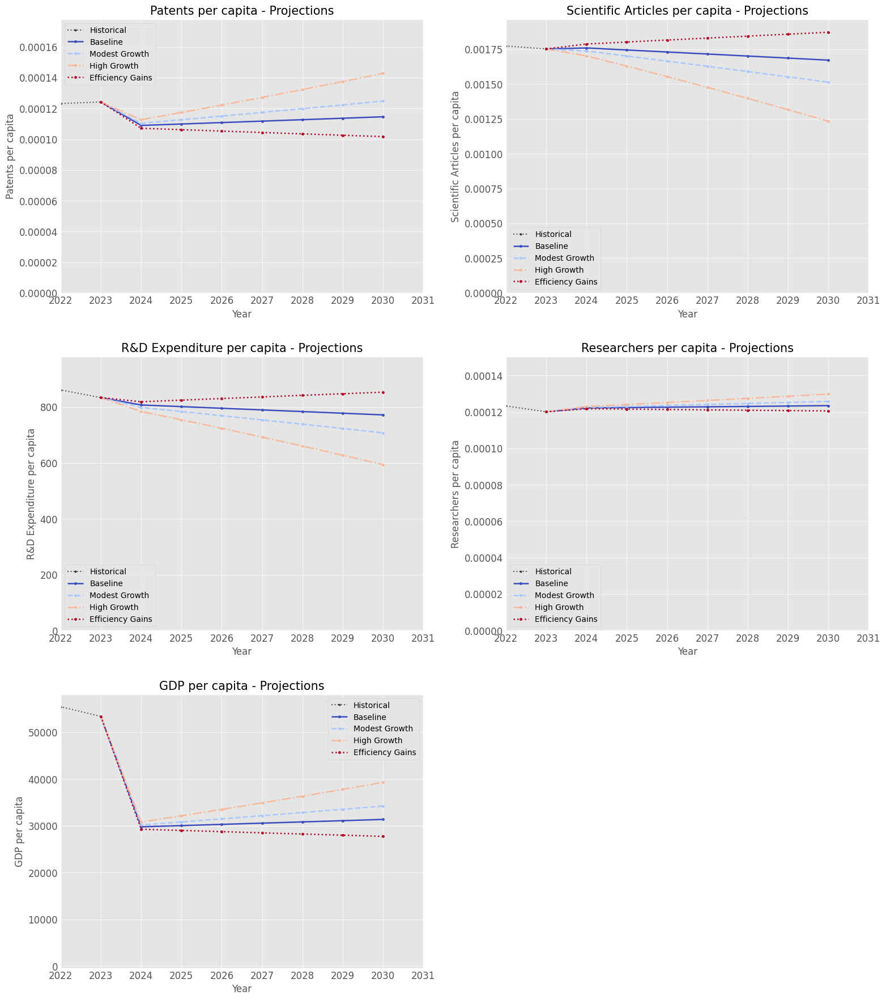

Using Patent->GDP Level Model: GDP ~ 13458416091526698.00 * Patents per capita + -502438198520.73 (p=0.000)
Economic impact calculation finished (interpret with caution).

--- Economic Impact Summary (Illustrative) ---
Based on projected differences in GDP levels derived from projected patent levels.


,Scenario,Patent_Level_Proj_2030,Est_GDP_Level_Proj_2030,Est_GDP_Diff_vs_Baseline_2030_Value,Est_GDP_Diff_vs_Baseline_2030_Percent
0,Modest Growth,0.000125,1176856408207.723633,137270740585.893921,13.20%
1,High Growth,0.000143,1419619626397.098145,380033958775.268433,36.56%
2,Efficiency Gains,0.000102,865869714658.619751,-173715952963.209961,-16.71%


In [ ]:
if not can_elec_pc_df.empty and demo_models:
    simulator = SimplifiedPolicySimulator(
        base_year=2023,
        projection_years=7,
        baseline_energy_growth_rate=0.005
    )
    analysis_results = simulator.run_and_analyze(
        historical_energy_df=can_elec_pc_df,
        simple_ols_models=demo_models,
        latest_innovation_values=demo_latest_values,
        scenarios=demo_scenarios,
        historical_innovation_dfs=demo_hist_innov_dfs,
        gdp_level_df=gdp_total_can_all if 'gdp_total_can_all' in locals() else None,
        patent_gdp_level_model=demo_patent_gdp_model,
        patent_metric_name=demo_patent_metric_name,
        output_filename_prefix="demo_simplified_policy"
    )
    demo_projections = analysis_results.get('projections')
    demo_econ_impacts = analysis_results.get('economic_impacts')
else:
      print("\nCannot run demo simulation due to missing Canadian energy data or models.")

***Interpretation:*** This simulation projects innovation & economic indicators under different energy growth scenarios using simple models relating each metric directly to electricity use. Higher energy growth correlates with higher projected Patents and GDP per capita which is shown in the significant estimated gdp difference in the illustrative impact table. Counter-intuitively increasing energy consumption per capita correlates with lower Scientific Articles and R&D expenditure. These contradictory results, indicate that the underlying simple models utilized are probably omitting crucial factors like overall GDP growth and others. This highlights the limitations of this approach and the necessity of incorporating the multivariate results to be more confident in the projections and simulations.

<a name = "chatbot"></a>
# **6.0 Chatbot**


A chatbot was build to help people discuss and understand our group's Canada's innovation and strategy plan. It can be used as a key source to handle commonly asked questions, providing both troubleshooting guidance and 24/7 assistance. It can also have a meaningful conversation with the user by providing data, and key insights on Canada’s innovation Strategy.

The data used for this chatbot includes this jupyter notebook, summaries we extracted from innovation reports across different countries and the consulting report we created.

Link to working Chatbot: https://dandrob-chatbot-chatbotfrontendfrontend-streamlit-tdtfty.streamlit.app/

Link to ChatBot Repo: https://github.com/DanDRob/chatbot

<a name="conclusion"></a>
# **7.0 Conclusion**
This notebook explored Canada’s position within the global innovation ecosystem and proposed a comprehensive four-policy framework to address its key challenges. Through strategic exploration and data-driven reasoning, our goal was to identify actionable recommendations to help Canada improve its innovation capacity, economic competitiveness, and global influence.

We began by analyzing Canada’s weaknesses relative to other nations, identifying persistent issues such as weak R&D commercialization, high corporate tax burdens, talent outflows, and underutilized energy assets. Based on this, we developed four focused innovation policies:

*   Policy 1 addresses Canada’s commercialization gap by enhancing late-stage innovation and facilitating the transition from research to market.

*   Policy 2 tackles high tax burdens and bureaucratic delays through targeted deregulation and corporate tax incentives, aiming to improve startup success and attract investment.

*   Policy 3 focuses on mitigating brain-drain by analyzing causes and recommending strategies to retain and attract talent.

*   Policy 4 leverages Canada's underutilized energy sector to drive GDP growth and attract energy-intensive, high-tech industries.

Our findings showed that Canada needs to:

*   Have a better late-stage funding initiative and on R&D expenditure to limit to foster promising businesses and encourage well-established businesses to pursue innovative ventures

*   Slash corportate tax rates and aim to deregulate to incentivize startup activities and attract venture capital investments while boosting GDP growth

*   Offer more interesting compensation for skilled and innovative workers to compete with the USA in terms of purchasing power and housing affordability to limit the current brain drain

*   Stimulate higher energy growth to attract highly innovative industries while providing cheaper energy to incentivize home-grown startups and skilled workers to operate and reside in Canada (which will also boost GDP growth)

In parallel, the notebook applies sound data science practices — from data cleaning and merging, to exploratory visualization, statistical testing, and interpretation — demonstrating how policy design can be enhanced by rigorous, evidence-based analysis.

The policies developped in this notebook, if adopted, will help Canada retain and develop home-grown innovators and attract established global innovative businesses, which will help it claim a top spot as a global innovator.